<a href="https://colab.research.google.com/github/antoinehrl/2425/blob/main/2425.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##imports

In [4]:
!pip install ISLP -q

In [5]:
!pip install l0bnb -q

In [6]:
import os, sys
from google.colab import drive
drive.mount('/content/drive')
nb_path = '/content/notebooks'
os.symlink('/content/drive/My Drive/Colab Notebooks', nb_path)
sys.path.insert(0,nb_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileExistsError: [Errno 17] File exists: '/content/drive/My Drive/Colab Notebooks' -> '/content/notebooks'

In [7]:
import pandas as pd
import statsmodels.api as sm

import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
from statsmodels.api import OLS
import sklearn.model_selection as skm
import sklearn.linear_model as skl
from sklearn.preprocessing import StandardScaler
from ISLP import load_data, confusion_table
from ISLP.models import ModelSpec as MS
from functools import partial

from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from ISLP.models import \
     (Stepwise,
      sklearn_selected,
      sklearn_selection_path)
from l0bnb import fit_path

In [8]:

from sklearn.tree import (DecisionTreeClassifier as DTC,
                          DecisionTreeRegressor as DTR,
                          plot_tree,
                          export_text)
from sklearn.metrics import (accuracy_score,
                             log_loss)
from sklearn.ensemble import \
     (RandomForestRegressor as RF,
      GradientBoostingRegressor as GBR)
from ISLP.bart import BART


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
loanmain_stata = "197302-V1/loanmain.dta"
loanmain_df = pd.read_stata("197302-V1/loanmain.dta")

##Cleaning (2)

In [13]:

loanmain_df2 = loanmain_df.set_index(['firmid'])

In [14]:
loanmain_df2.head()

,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,polconnection,...,_Ibasecount_4,_Ibasecount_5,_Ibasecount_6,_Ibasecount_7,_Ibasecount_8,_Ibasecount_9,_Ibasecount_10,_Ibasecount_11,basecounty,survey_town
firmid,,,,,,,,,,,,,,,,,,,,,
111.0,0.0,0.0,1.0,38.0,0.0,34.0,15.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,9.0
111.0,0.0,0.0,0.0,39.0,0.0,50.0,12.0,0.0,2.0,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,9.0
111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,9.0
112.0,0.0,0.0,0.0,22.0,0.0,12.0,3.0,1.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,9.0
112.0,0.0,1.0,0.0,24.0,0.0,12.0,2.0,0.0,2.0,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,9.0


## Summary Stats Tables

In [15]:
baseline_data = loanmain_df2[loanmain_df2['post'] == 0]

panel_a_vars = ['firmage', 'retail', 'labor', 'total_profit', 'lnpart5revenue']
panel_b_vars = ['gender', 'age', 'education_college', 'polconnection']
panel_c_vars = ['bankloan', 'otherloan_amount', 'bankloan_interest']
panel_d_vars = ['num_clients', 'num_supplier']

In [16]:
baseline_data = loanmain_df2[loanmain_df2['post'] == 0]

# List of baseline characteristics to check balance
balance_vars = ['firmage', 'retail', 'labor', 'total_profit', 'part5revenue']

# Regress baseline characteristics on treatment indicators (T50, C50, T80, C80)
balance_results = {}
for var in balance_vars:
    # Define the model: baseline characteristics regressed on treatment indicators
    model = sm.OLS(baseline_data[var], sm.add_constant(baseline_data[['T50', 'C50', 'T80', 'C80']])).fit(cov_type='HC3')
    balance_results[var] = model.summary()

# Display the balance check results
for var, result in balance_results.items():
    print(f"Balance Check for {var}:\n{result}\n")

Balance Check for firmage:
                            OLS Regression Results                            
Dep. Variable:                firmage   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     4.589
Date:                Fri, 20 Dec 2024   Prob (F-statistic):            0.00107
Time:                        20:43:36   Log-Likelihood:                -9099.3
No. Observations:                3173   AIC:                         1.821e+04
Df Residuals:                    3168   BIC:                         1.824e+04
Df Model:                           4                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.4787    

In [17]:
baseline_data = loanmain_df2[loanmain_df2['post'] == 0]
endline_data = loanmain_df2[loanmain_df2['round'] == 3]

panel_a_vars = ['firmage', 'retail', 'labor', 'total_profit', 'part5revenue']
panel_b_vars = ['gender', 'age', 'education_college', 'polconnection']
panel_c_vars = ['bankloan', 'bankloan_amount', 'bankloan_interest']
panel_d_vars = ['num_clients', 'num_supplier']
panel_e_vars = ['flagatt', 'shutdown']

In [13]:
results = {}

# Function to perform balance checks for a given list of variables
def perform_balance_checks(data, vars_list, panel_name):
    panel_results = {}
    for var in vars_list:
        if var in data.columns:
            # Drop missing values for the variable
            temp_data = data.dropna(subset=[var])

            # Check if there's enough variation to perform the regression
            if temp_data[var].nunique() > 1:
                try:
                    model = sm.OLS(temp_data[var], sm.add_constant(temp_data[['T50', 'C50', 'T80', 'C80']])).fit(cov_type='HC3')
                    panel_results[var] = model.summary()
                except Exception as e:
                    print(f"Error running regression for {var} in {panel_name}: {e}")
            else:
                print(f"Skipping {var} in {panel_name}: Not enough variation.")
    results[panel_name] = panel_results

# Run balance checks for Panels A to D using baseline data
perform_balance_checks(baseline_data, panel_a_vars, 'Panel A')
perform_balance_checks(baseline_data, panel_b_vars, 'Panel B')
perform_balance_checks(baseline_data, panel_c_vars, 'Panel C')
perform_balance_checks(baseline_data, panel_d_vars, 'Panel D')

# Run balance checks for Panel E using endline data
perform_balance_checks(endline_data, panel_e_vars, 'Panel E')

print(results)




{'Panel A': {'firmage': <class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
Dep. Variable:                firmage   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     4.589
Date:                Fri, 20 Dec 2024   Prob (F-statistic):            0.00107
Time:                        06:19:36   Log-Likelihood:                -9099.3
No. Observations:                3173   AIC:                         1.821e+04
Df Residuals:                    3168   BIC:                         1.824e+04
Df Model:                           4                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

In [ ]:
#model1 = sm.OLS(baseline_data['firmage'], sm.add_constant(baseline_data[['T50', 'C50', 'T80', 'C80']])).fit(cov_type='HC3')
#model2 = sm.OLS(baseline_data['retail'], sm.add_constant(baseline_data[['T50', 'C50', 'T80', 'C80']])).fit(cov_type='HC3')

In [14]:
!pip install stargazer -q
from stargazer.stargazer import Stargazer
!pip install pystout
from pystout import pystout

In [15]:
!pip install linearmodels -q
import linearmodels as ln

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.7 MB/s eta 0:00:00


In [ ]:
#pystout(models=[model1, model2],    latex export template.
 #       file='test_table.tex',
  #      digits=3,
   #     endog_names=['firmage', 'retail'],
    #    varlabels={'const':'Constant',
     #              'T50':'Disp','C50':'MPG', 'T80':'MPG', 'C800':'MPG'},
      #  mgroups={'First Group':[1,2],'Second Group':3},
       # modstat={'nobs':'Obs','rsquared_adj':'Adj. R\sym{2}','fvalue':'F-stat'}
        #)

In [ ]:
#pystout(
 #   models=models_list,
  #  file='balance_check_results.tex',  # Output file name
   # addnotes=['Note: This table presents the balance check results for different panels and variables.'],
    #digits=3,  # Format numbers with 3 decimal places
    #endog_names=endog_names,  # Use variable names as endogenous names
    #varlabels={'const': 'Constant', 'T50': 'Treatment 50', 'C50': 'Control 50',
              # 'T80': 'Treatment 80', 'C80': 'Control 80'},  # Rename variables for clarity
    #mgroups={'Panel A': [1, 2, 3], 'Panel B': [4, 5, 6]},  # Example grouping
    #modstat={'nobs': 'Obs', 'rsquared_adj': 'Adj. $R^2$', 'fvalue': 'F-stat'}  # Model stats to display
#)

##Summary Stats figures

In [18]:
loanmain_df3 = baseline_data.reset_index().copy()
loanmain_df4 = endline_data.reset_index().copy()

In [19]:
import seaborn as sns

In [17]:
loanmain_df3['T80'].value_counts()

,count
T80,
0.0,1959
1.0,1214


In [57]:
# Identifying pure control (where all treatment indicators are 0)
loanmain_df3['pure_control'] = loanmain_df3[['T50', 'T80', 'C50', 'C80']].sum(axis=1) == 0
loanmain_df2['pure_control'] = loanmain_df3[['T50', 'T80', 'C50', 'C80']].sum(axis=1) == 0

# Mapping type to 'Treatment' or 'Control'

# Creating a new column that combines type and intensity
loanmain_df2['intensity'] = loanmain_df3.apply(lambda row: 'T50' if row['T50'] == 1 else
                                                         'T80' if row['T80'] == 1 else
                                                         'C50' if row['C50'] == 1 else
                                                         'C80' if row['C80'] == 1 else
                                                         'Pure Control' if row['pure_control'] else
                                               'Unknown', axis=1)

loanmain_df3['intensity'] = loanmain_df3.apply(lambda row: 'T50' if row['T50'] == 1 else
                                                         'T80' if row['T80'] == 1 else
                                                         'C50' if row['C50'] == 1 else
                                                         'C80' if row['C80'] == 1 else
                                                         'Pure Control' if row['pure_control'] else
                                               'Unknown', axis=1)


loanmain_df3['type_intensity'] = loanmain_df3.apply(
    lambda row: f"{'Treated'} - {row['intensity']}" if row['type'] == 1 else
                f"{'Untreated'} - {row['intensity']}" if row['type'] == 0 else
                'Unknown',
    axis=1
)
loanmain_df3['type_intensity'].value_counts()

loanmain_df4['pure_control'] = loanmain_df4[['T50', 'T80', 'C50', 'C80']].sum(axis=1) == 0

loanmain_df4['intensity'] = loanmain_df4.apply(lambda row: 'T50' if row['T50'] == 1 else
                                                         'T80' if row['T80'] == 1 else
                                                         'C50' if row['C50'] == 1 else
                                                         'C80' if row['C80'] == 1 else
                                                         'Pure Control' if row['pure_control'] else
                                               'Unknown', axis=1)


loanmain_df4['type_intensity'] = loanmain_df4.apply(
    lambda row: f"{'Treated'} - {row['intensity']}" if row['type'] == 1 else
                f"{'Untreated'} - {row['intensity']}" if row['type'] == 0 else
                'Unknown',
    axis=1
)

In [ ]:
loanmain_df3['intensity'].value_counts()

,count
intensity,
Pure Control,1247
T80,1214
C80,287
T50,222
C50,203


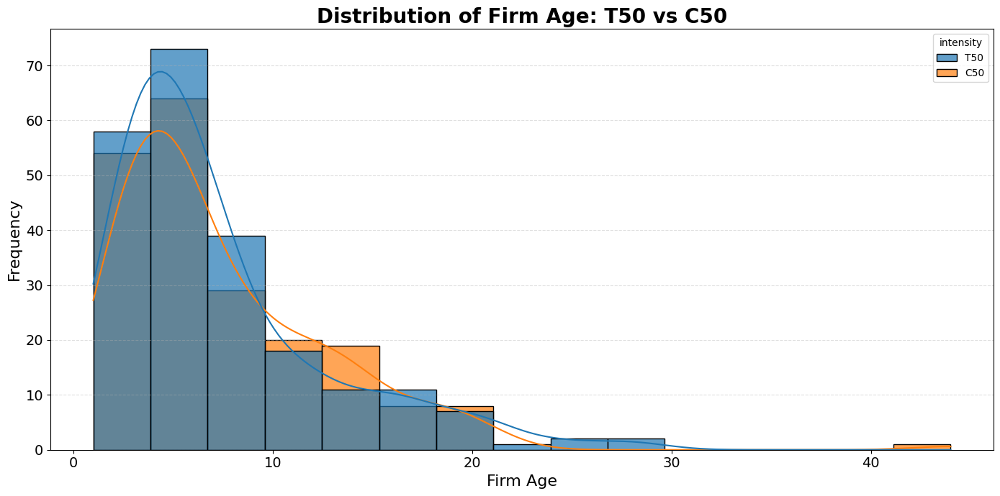

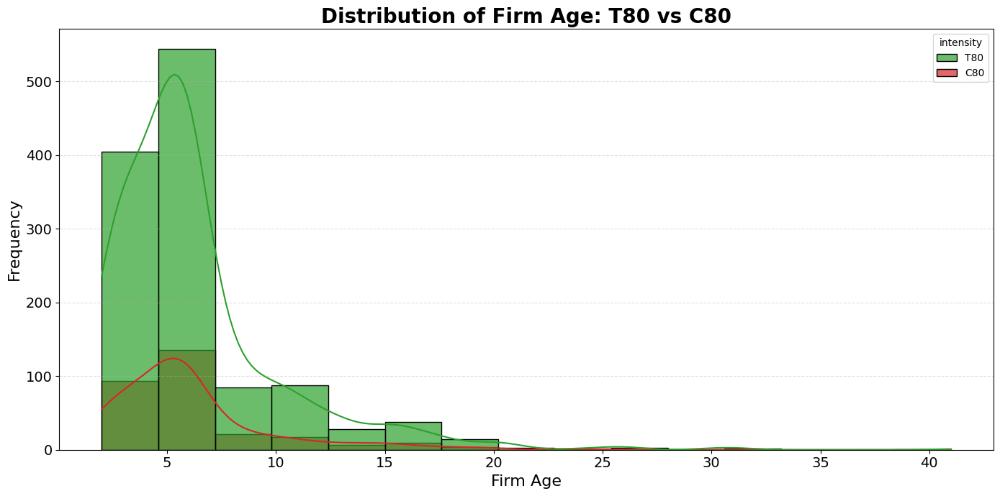

<ipython-input-23-4df133a4a215>:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=loanmain_df3[loanmain_df3['intensity'] == 'Pure Control'], x='firmage', kde=True, bins=15, palette=palette3, alpha=0.7, linewidth=1)


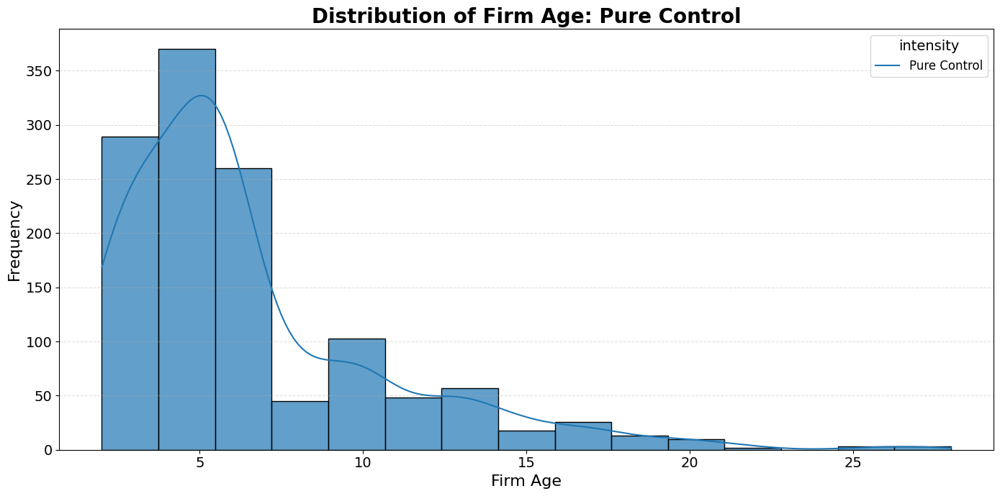

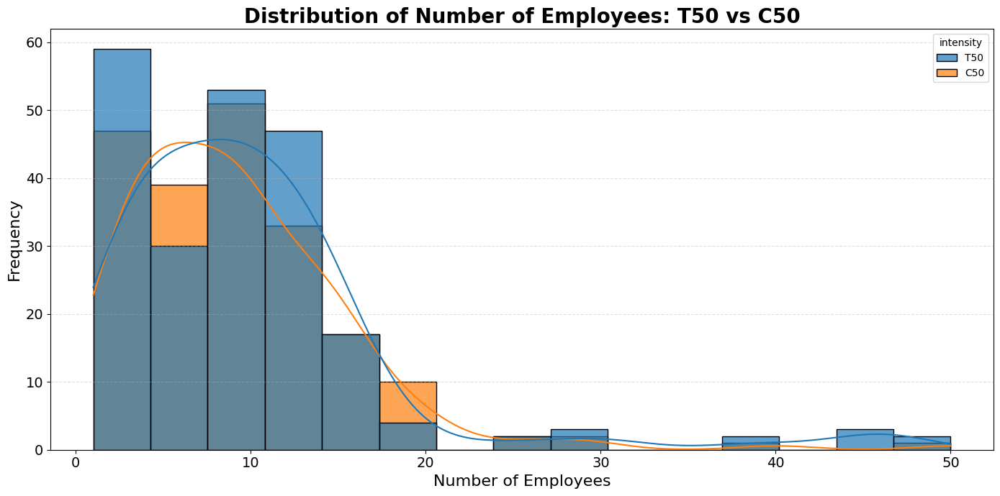

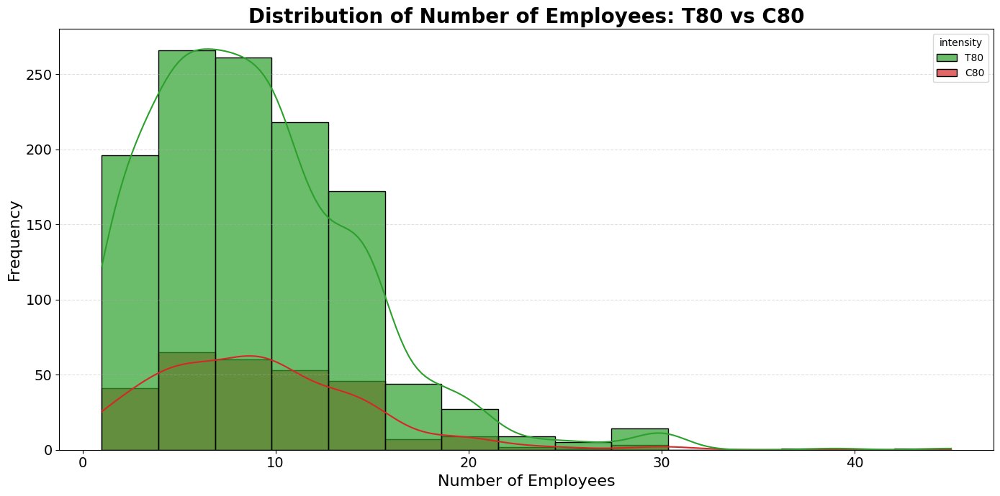

<ipython-input-23-4df133a4a215>:87: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=loanmain_df3[loanmain_df3['intensity'] == 'Pure Control'], x='labor', kde=True, bins=15, palette=palette3, alpha=0.7, linewidth=1)


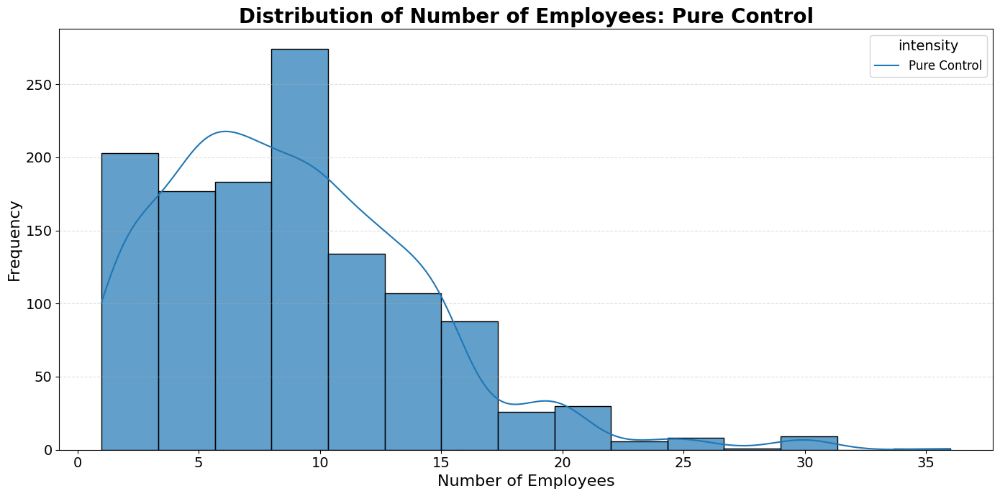

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Custom color palette for distinct colors
palette = {
    'T50': '#1f77b4',  # Blue
    'C50': '#ff7f0e',  # Orange
}

palette2 = {
    'T80': '#2ca02c',  # Green
    'C80': '#d62728',  # Red
    'Pure Control': '#9467bd'  # Purple
}

palette3 = {
    'Pure Control': '#9467bd'  # Purple
}


# Plotting separate histograms for T50 vs C50
plt.figure(figsize=(14, 7))
sns.histplot(data=loanmain_df3[loanmain_df3['intensity'].isin(['T50', 'C50'])], x='firmage', hue='intensity', kde=True, bins=15, alpha=0.7, linewidth=1)
plt.title('Distribution of Firm Age: T50 vs C50', fontsize=20, fontweight='bold')
plt.xlabel('Firm Age', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Plotting separate histograms for T80 vs C80
plt.figure(figsize=(14, 7))
sns.histplot(data=loanmain_df3[loanmain_df3['intensity'].isin(['T80', 'C80'])], x='firmage', hue='intensity', kde=True, bins=15, palette=palette2, alpha=0.7, linewidth=1)
plt.title('Distribution of Firm Age: T80 vs C80', fontsize=20, fontweight='bold')
plt.xlabel('Firm Age', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Plotting separate histogram for Pure Control
plt.figure(figsize=(14, 7))
sns.histplot(data=loanmain_df3[loanmain_df3['intensity'] == 'Pure Control'], x='firmage', kde=True, bins=15, palette=palette3, alpha=0.7, linewidth=1)
plt.title('Distribution of Firm Age: Pure Control', fontsize=20, fontweight='bold')
plt.xlabel('Firm Age', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.legend(['Pure Control'], title='intensity', fontsize=12, title_fontsize=14, loc='upper right')
plt.tight_layout()
plt.show()

# Repeat the process for Number of Employees

# Plotting separate histograms for T50 vs C50
plt.figure(figsize=(14, 7))
sns.histplot(data=loanmain_df3[loanmain_df3['intensity'].isin(['T50', 'C50'])], x='labor', hue='intensity', kde=True, bins=15, palette=palette, alpha=0.7, linewidth=1)
plt.title('Distribution of Number of Employees: T50 vs C50', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Plotting separate histograms for T80 vs C80
plt.figure(figsize=(14, 7))
sns.histplot(data=loanmain_df3[loanmain_df3['intensity'].isin(['T80', 'C80'])], x='labor', hue='intensity', kde=True, bins=15, palette=palette2, alpha=0.7, linewidth=1)
plt.title('Distribution of Number of Employees: T80 vs C80', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Plotting separate histogram for Pure Control
plt.figure(figsize=(14, 7))
sns.histplot(data=loanmain_df3[loanmain_df3['intensity'] == 'Pure Control'], x='labor', kde=True, bins=15, palette=palette3, alpha=0.7, linewidth=1)
plt.title('Distribution of Number of Employees: Pure Control', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.legend(['Pure Control'], title='intensity', fontsize=12, title_fontsize=14, loc='upper right')
plt.tight_layout()
plt.show()


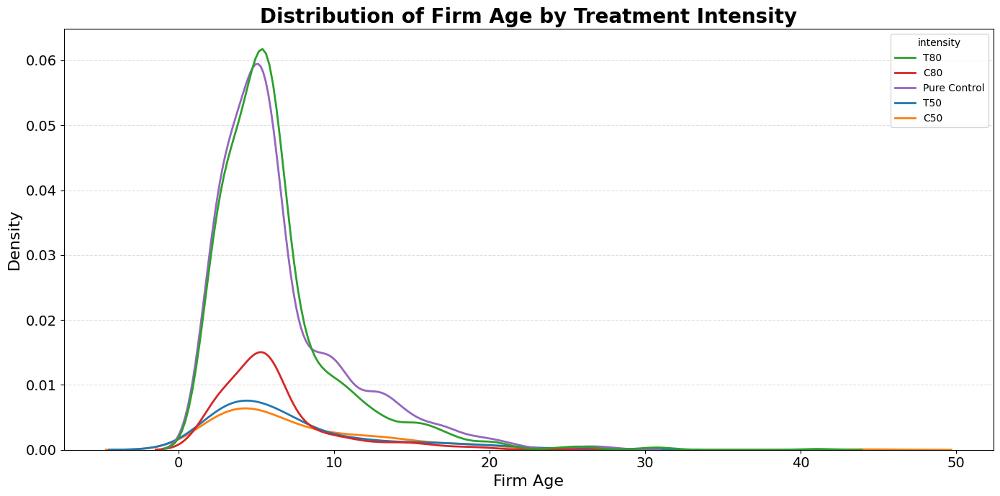

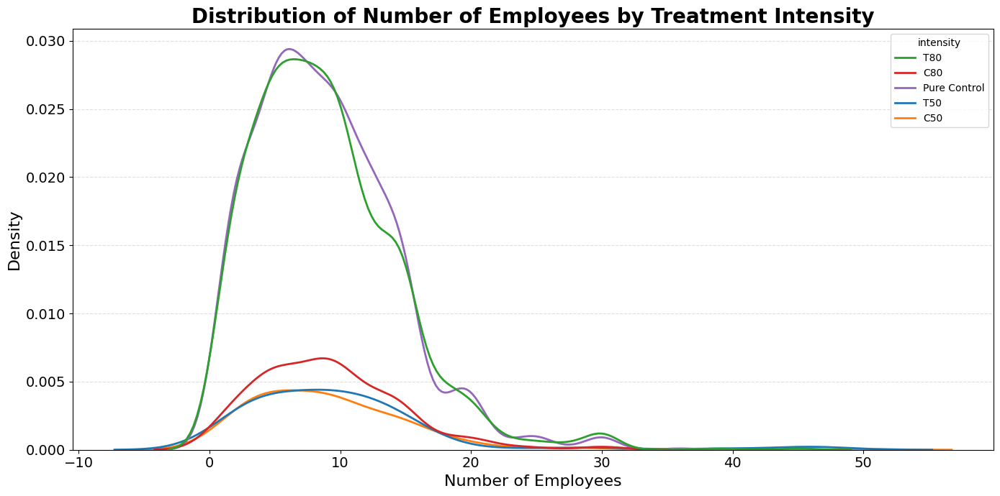

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Custom color palette for distinct colors
palette = {
    'T50': '#1f77b4',  # Blue
    'C50': '#ff7f0e',  # Orange
    'T80': '#2ca02c',  # Green
    'C80': '#d62728',  # Red
    'Pure Control': '#9467bd'  # Purple
}

# Overall plot for Firm Age with all treatment intensities
plt.figure(figsize=(14, 7))
sns.kdeplot(data=loanmain_df3, x='firmage', hue='intensity', palette=palette, linewidth=2)
plt.title('Distribution of Firm Age by Treatment Intensity', fontsize=20, fontweight='bold')
plt.xlabel('Firm Age', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Overall plot for Number of Employees with all treatment intensities
plt.figure(figsize=(14, 7))
sns.kdeplot(data=loanmain_df3, x='labor', hue='intensity', palette=palette, linewidth=2)
plt.title('Distribution of Number of Employees by Treatment Intensity', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


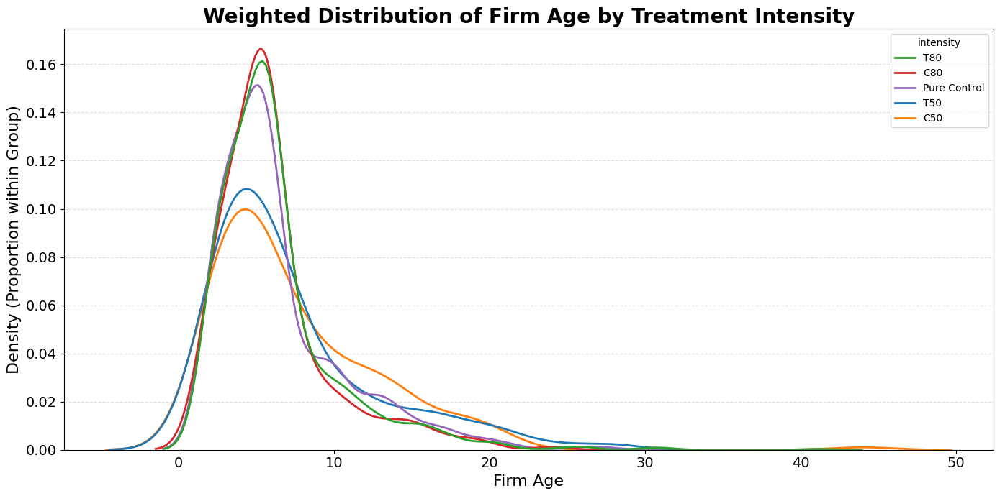

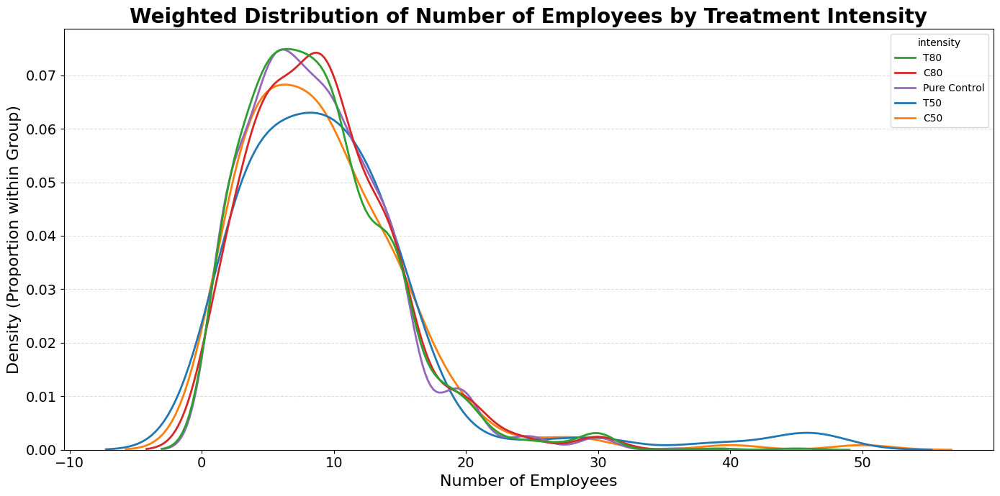

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Custom color palette for distinct colors
palette = {
    'T50': '#1f77b4',  # Blue
    'C50': '#ff7f0e',  # Orange
    'T80': '#2ca02c',  # Green
    'C80': '#d62728',  # Red
    'Pure Control': '#9467bd'  # Purple
}

# Overall plot for Firm Age with all treatment intensities showing weighted densities
plt.figure(figsize=(14, 7))
sns.kdeplot(data=loanmain_df3, x='firmage', hue='intensity', palette=palette, linewidth=2, common_norm=False)
plt.title('Weighted Distribution of Firm Age by Treatment Intensity', fontsize=20, fontweight='bold')
plt.xlabel('Firm Age', fontsize=16)
plt.ylabel('Density (Proportion within Group)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Overall plot for Number of Employees with all treatment intensities showing weighted densities
plt.figure(figsize=(14, 7))
sns.kdeplot(data=loanmain_df3, x='labor', hue='intensity', palette=palette, linewidth=2, common_norm=False)
plt.title('Weighted Distribution of Number of Employees by Treatment Intensity', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees', fontsize=16)
plt.ylabel('Density (Proportion within Group)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


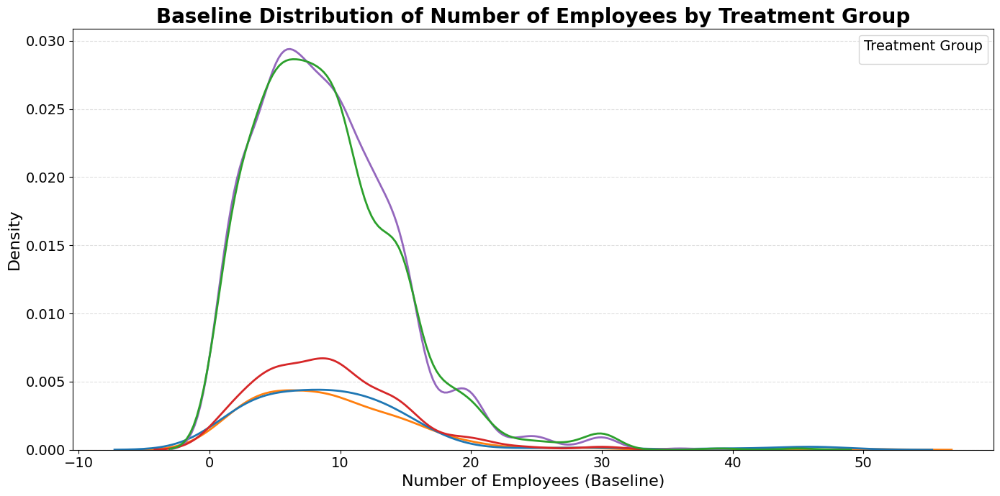

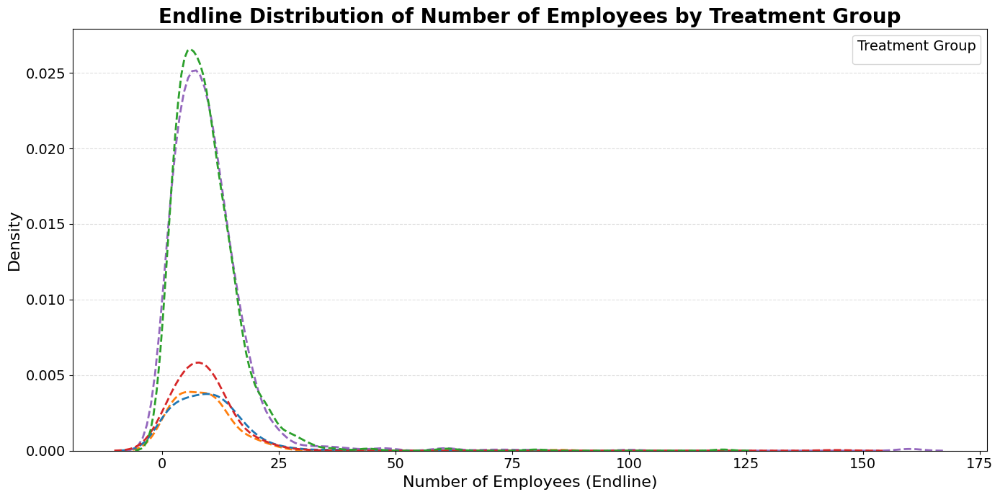

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Custom color palette for distinct lines
palette = {
    'T50': '#1f77b4',  # Blue
    'C50': '#ff7f0e',  # Orange
    'T80': '#2ca02c',  # Green
    'C80': '#d62728',  # Red
    'Pure Control': '#9467bd'  # Purple
}

# Plotting baseline density for the number of employees by treatment group
plt.figure(figsize=(14, 7))
sns.kdeplot(data=loanmain_df3, x='labor', hue='intensity', palette=palette, linewidth=2)
plt.title('Baseline Distribution of Number of Employees by Treatment Group', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees (Baseline)', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='Treatment Group', fontsize=12, title_fontsize=14, loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Assuming you have an endline DataFrame named loanmain_df_endline
# Plotting endline density for the number of employees by treatment group
plt.figure(figsize=(14, 7))
sns.kdeplot(data=loanmain_df4, x='labor', hue='intensity', palette=palette, linewidth=2, linestyle='--')
plt.title('Endline Distribution of Number of Employees by Treatment Group', fontsize=20, fontweight='bold')
plt.xlabel('Number of Employees (Endline)', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='Treatment Group', fontsize=12, title_fontsize=14, loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


In [ ]:
growth_df = loanmain_df4[['firmid', 'intensity', 'labor']].copy()
growth_df.rename(columns={'labor': 'labor_endline'}, inplace=True)
growth_df['labor_baseline'] = loanmain_df3.set_index('firmid').loc[growth_df['firmid'], 'labor'].values
growth_df['labor_growth'] = (growth_df['labor_endline'] - growth_df['labor_baseline']) / growth_df['labor_baseline']

growth_df.head()

,firmid,intensity,labor_endline,labor_baseline,labor_growth
0,111.0,T80,13.0,12.0,0.083333
1,112.0,T80,9.0,9.0,0.000000
2,113.0,T80,5.0,6.0,-0.166667
3,114.0,T80,11.0,12.0,-0.083333
4,115.0,C80,3.0,7.0,-0.571429


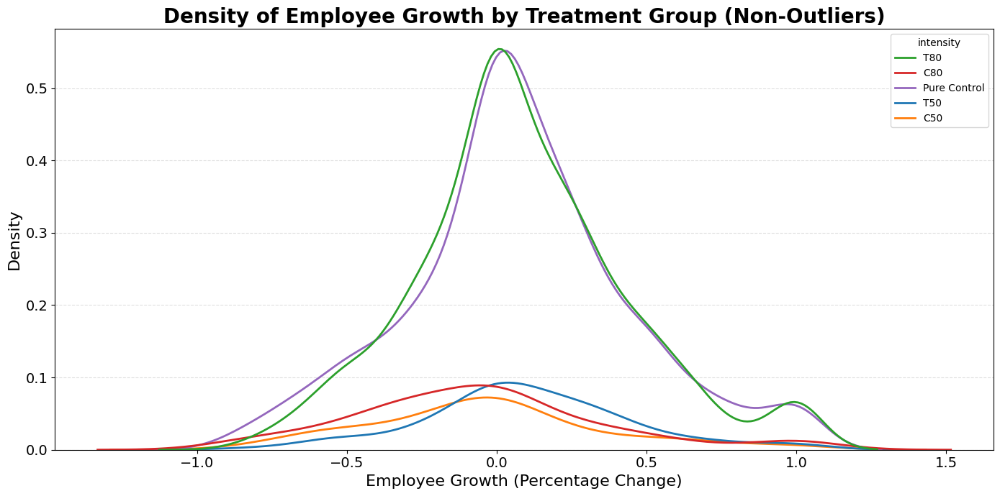

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate the IQR for labor growth
q1 = growth_df['labor_growth'].quantile(0.25)
q3 = growth_df['labor_growth'].quantile(0.75)
iqr = q3 - q1

# Define the bounds for non-outliers (1.5 * IQR rule)
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Filter out outliers
filtered_growth_df = growth_df[(growth_df['labor_growth'] >= lower_bound) & (growth_df['labor_growth'] <= upper_bound)]

# Plotting the density of employee growth without outliers
plt.figure(figsize=(14, 7))
sns.kdeplot(data=filtered_growth_df, x='labor_growth', hue='intensity', palette=palette, linewidth=2)
plt.title('Density of Employee Growth by Treatment Group (Non-Outliers)', fontsize=20, fontweight='bold')
plt.xlabel('Employee Growth (Percentage Change)', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


In [ ]:
loanmain_df2['intensity'] = loanmain_df2.apply(
    lambda row: 'Treated' if row['type'] == 1 else
                'Untreated, Control Market' if row['type'] == 0 and row['survey_town_type'] == 0 else
                'Untreated, Treated Market',
    axis=1
)

In [ ]:
df_filtered = loanmain_df2[loanmain_df2['round'].isin([1, 3])]

# Pivot the data to get baseline and endline labor for each firm
df_pivot = df_filtered.pivot_table(index=['firmid', 'intensity'], columns='round', values='labor')

# Rename the columns for clarity
df_pivot.columns = ['labor_baseline', 'labor_endline']
df_pivot = df_pivot.reset_index()


df_pivot['labor_growth'] = (df_pivot['labor_endline'] - df_pivot['labor_baseline'])

df_pivot['intensity'].value_counts()

,count
intensity,
Treated,1436
"Untreated, Control Market",1247
"Untreated, Treated Market",490


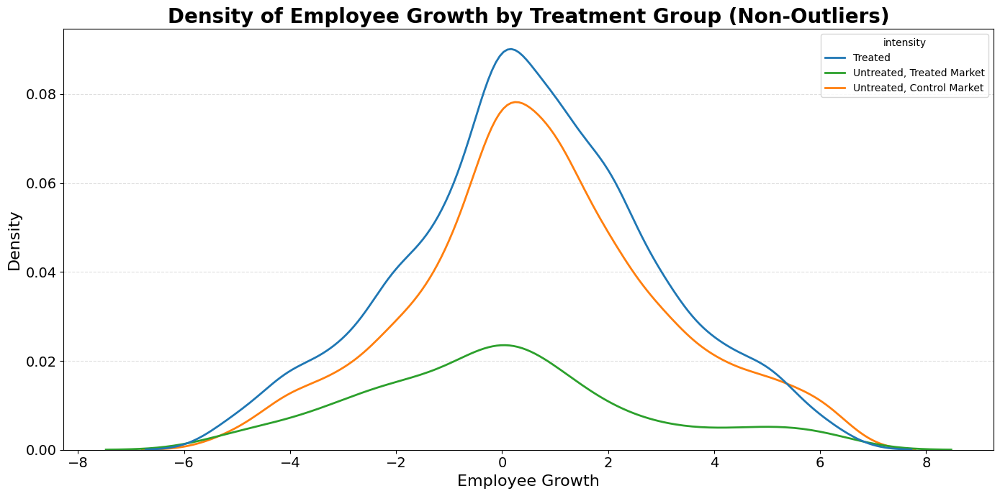

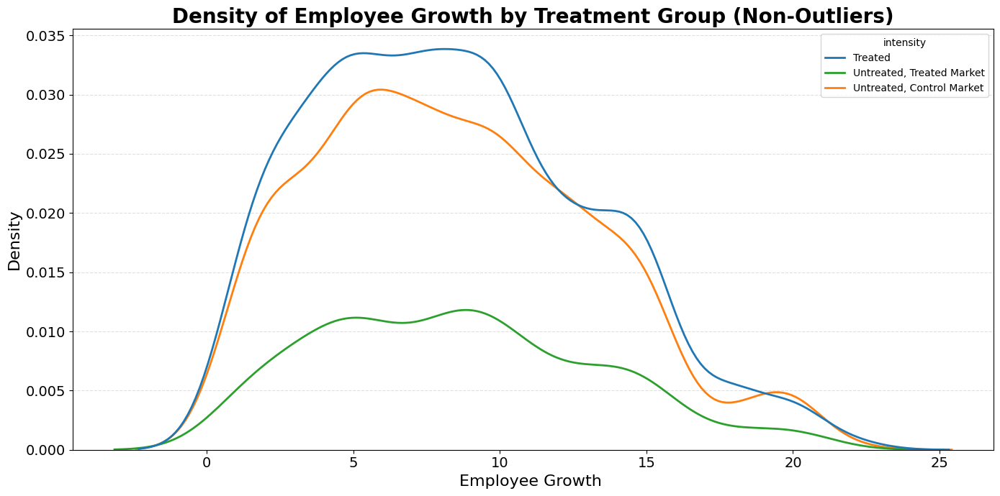

In [ ]:
palette = {
    'Treated': '#1f77b4',  # Blue
    'Untreated, Control Market': '#ff7f0e',  # Orange
    'Untreated, Treated Market': '#2ca02c',  # Green
    'Unknown': '#d62728'  # Red (in case of unknowns)
}

# Calculate the IQR for labor growth
q1 = df_pivot['labor_growth'].quantile(0.25)
q3 = df_pivot['labor_growth'].quantile(0.75)
iqr = q3 - q1

# Define the bounds for non-outliers (1.5 * IQR rule)
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Filter out outliers
filtered_growth_df = df_pivot[(df_pivot['labor_growth'] >= lower_bound) & (df_pivot['labor_growth'] <= upper_bound)]

# Plotting the density of employee growth without outliers
plt.figure(figsize=(14, 7))
sns.kdeplot(data=filtered_growth_df, x='labor_growth', hue='intensity', palette=palette, linewidth=2)
plt.title('Density of Employee Growth by Treatment Group (Non-Outliers)', fontsize=20, fontweight='bold')
plt.xlabel('Employee Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


q1 = df_pivot['labor_baseline'].quantile(0.25)
q3 = df_pivot['labor_baseline'].quantile(0.75)
iqr = q3 - q1

# Define the bounds for non-outliers (1.5 * IQR rule)
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

filtered_growth_df = df_pivot[(df_pivot['labor_baseline'] >= lower_bound) & (df_pivot['labor_baseline'] <= upper_bound)]
plt.figure(figsize=(14, 7))
sns.kdeplot(data=filtered_growth_df, x='labor_baseline', hue='intensity', palette=palette, linewidth=2)
plt.title('Density of Employee Growth by Treatment Group (Non-Outliers)', fontsize=20, fontweight='bold')
plt.xlabel('Employee Growth ', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()



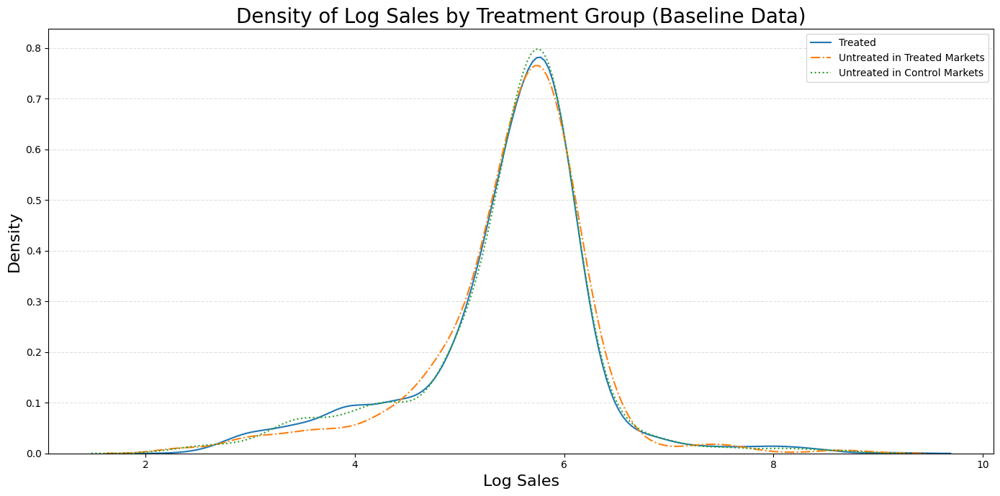

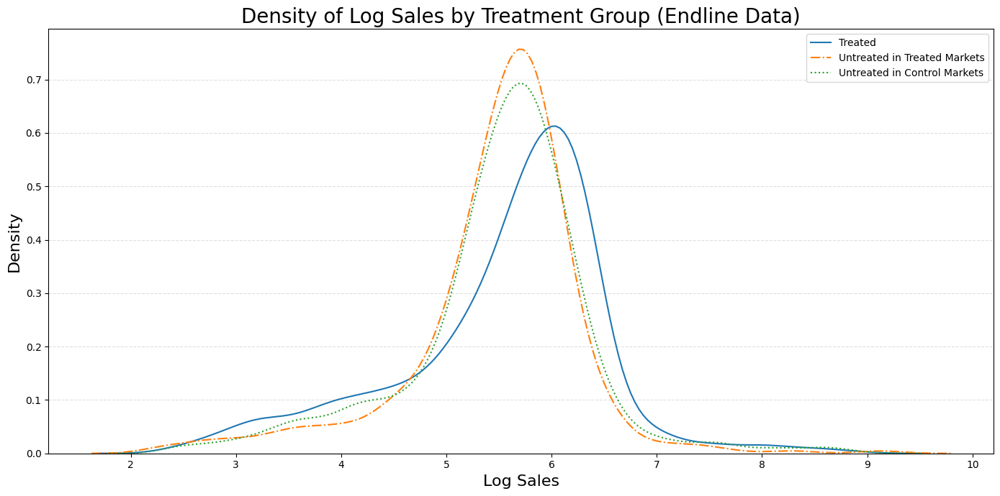

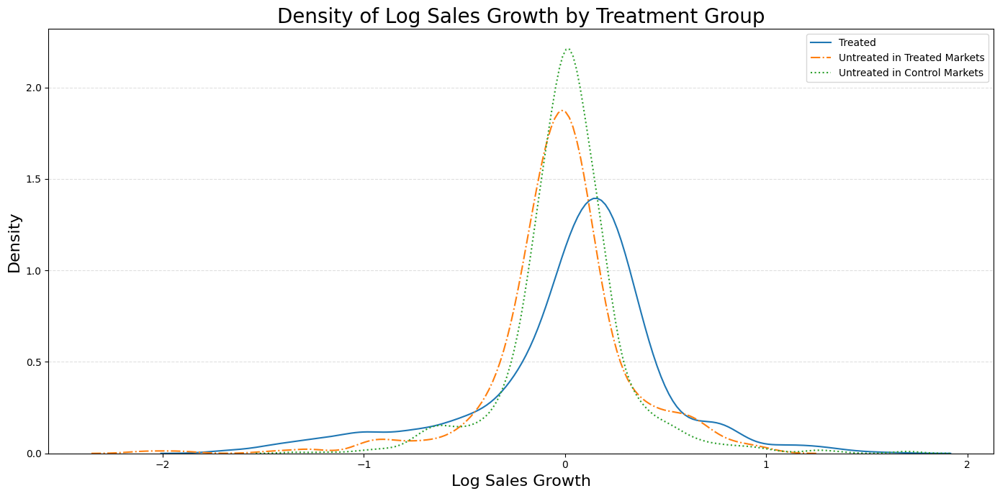

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


df = loanmain_df2.reset_index().copy()

# Calculate growth in log sales for rounds > 1
df['growthsales'] = df.groupby('firmid')['lnpart5revenue'].diff().where(df['round'] > 1)

# Calculate average growthsales per firm for rounds > 1
df['avggrowthsales'] = df.groupby('firmid')['growthsales'].transform('mean').where(df['round'] > 1)

# Define the line styles for different groups
line_styles = {
    'Treated': 'solid',
    'Untreated in Treated Markets': 'dashdot',
    'Untreated in Control Markets': 'dotted'
}

# Plot for log sales (lnpart5revenue) in round 1
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] == 1)], x='lnpart5revenue', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] == 1)], x='lnpart5revenue', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] == 1)], x='lnpart5revenue', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Sales by Treatment Group (Baseline Data)', fontsize=20)
plt.xlabel('Log Sales', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()

plt.savefig('log_sales_density.png', format = 'png')
plt.show()

# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='lnpart5revenue', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='lnpart5revenue', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='lnpart5revenue', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Sales by Treatment Group (Endline Data)', fontsize=20)
plt.xlabel('Log Sales', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_sales_density2.png', format = 'png')
plt.show()

# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='avggrowthsales', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='avggrowthsales', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='avggrowthsales', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Sales Growth by Treatment Group', fontsize=20)
plt.xlabel('Log Sales Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


<ipython-input-34-b25f7068a79d>:7: RuntimeWarning: invalid value encountered in log
  df['lnprofit'] = df['total_profit'].apply(lambda x: np.log(x + 1))
<ipython-input-34-b25f7068a79d>:7: RuntimeWarning: divide by zero encountered in log
  df['lnprofit'] = df['total_profit'].apply(lambda x: np.log(x + 1))


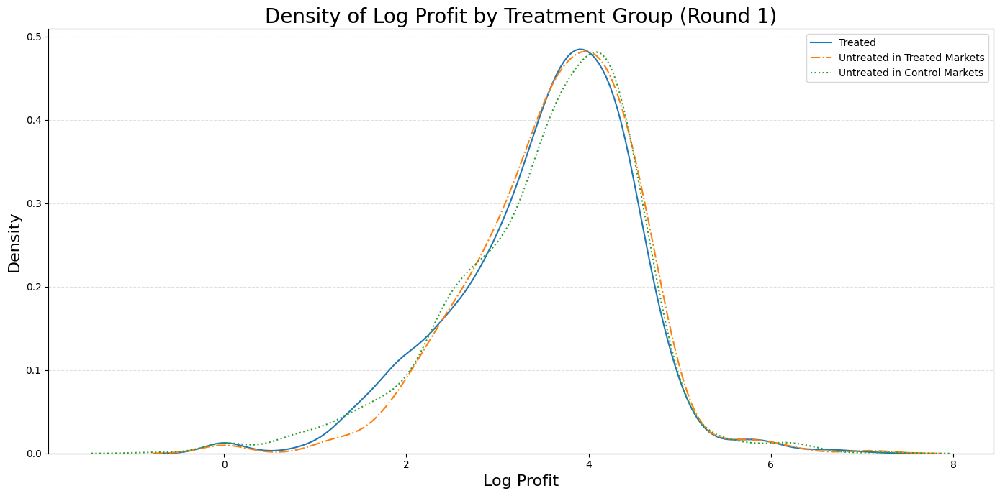

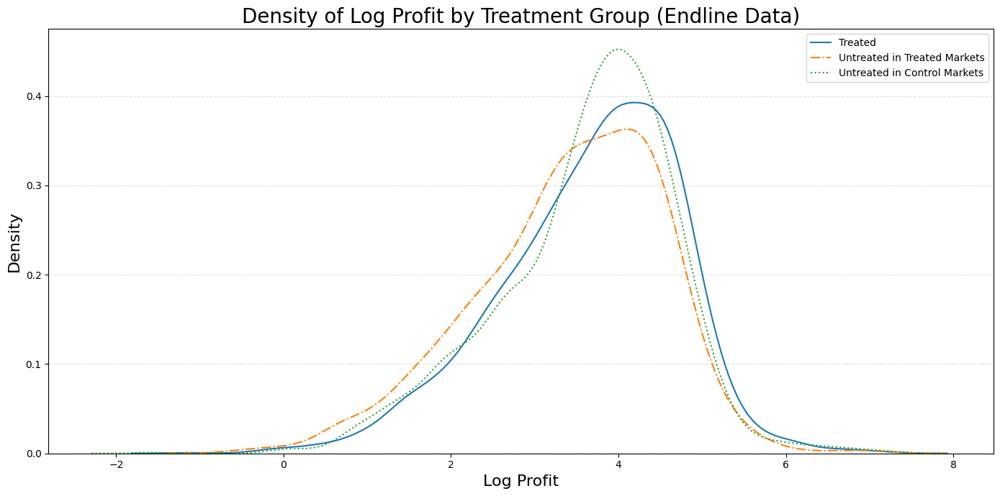

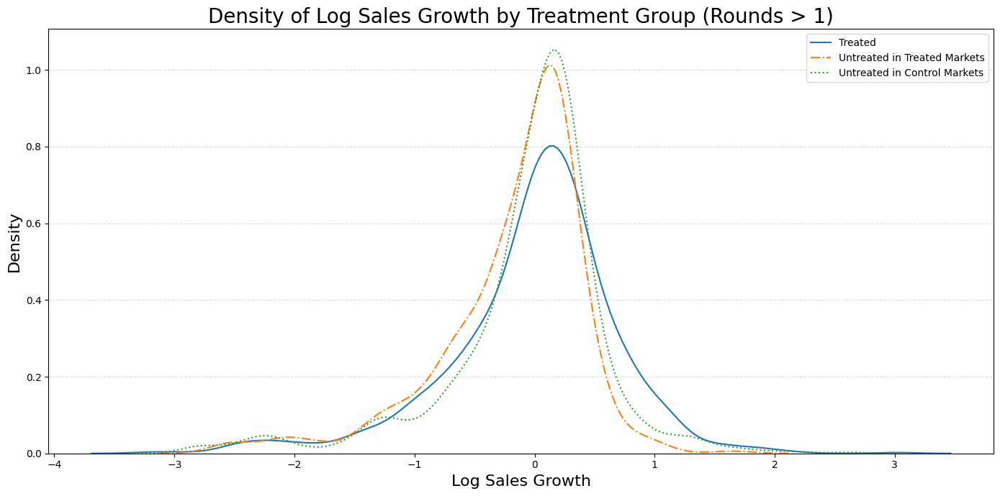

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


df = loanmain_df2.reset_index().copy()
df['lnprofit'] = df['total_profit'].apply(lambda x: np.log(x + 1))

# Calculate growth in log sales for rounds > 1
df['growthsales'] = df.groupby('firmid')['lnprofit'].diff().where(df['round'] > 1)

# Calculate average growthsales per firm for rounds > 1
df['avggrowthsales'] = df.groupby('firmid')['growthsales'].transform('mean').where(df['round'] > 1)

# Define the line styles for different groups
line_styles = {
    'Treated': 'solid',
    'Untreated in Treated Markets': 'dashdot',
    'Untreated in Control Markets': 'dotted'
}

# Plot for log sales (lnpart5revenue) in round 1
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] == 1)], x='lnprofit', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] == 1)], x='lnprofit', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] == 1)], x='lnprofit', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Profit by Treatment Group (Round 1)', fontsize=20)
plt.xlabel('Log Profit', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_profit_density.png', format = 'png')
plt.show()


# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='lnprofit', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='lnprofit', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='lnprofit', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Profit by Treatment Group (Endline Data)', fontsize=20)
plt.xlabel('Log Profit', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_profit_density2.png', format = 'png')
plt.show()

# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='avggrowthsales', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='avggrowthsales', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='avggrowthsales', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Sales Growth by Treatment Group (Rounds > 1)', fontsize=20)
plt.xlabel('Log Sales Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


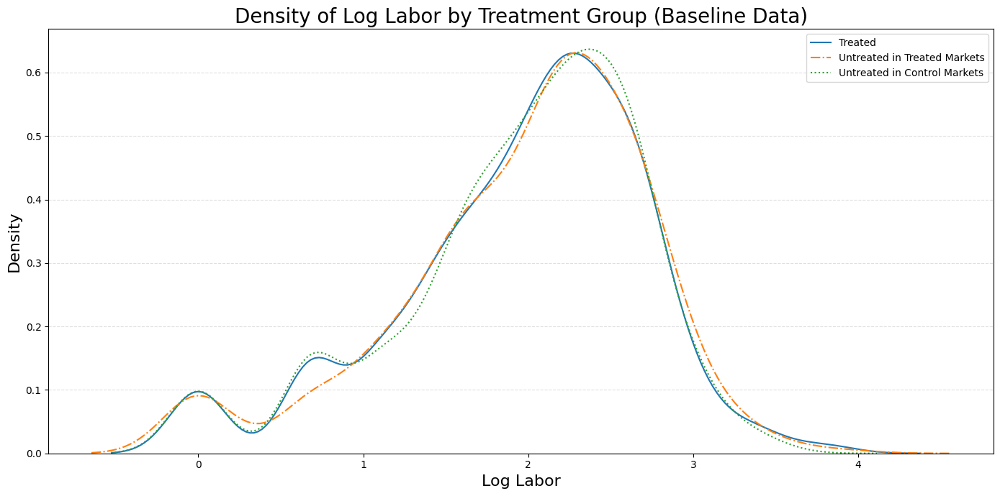

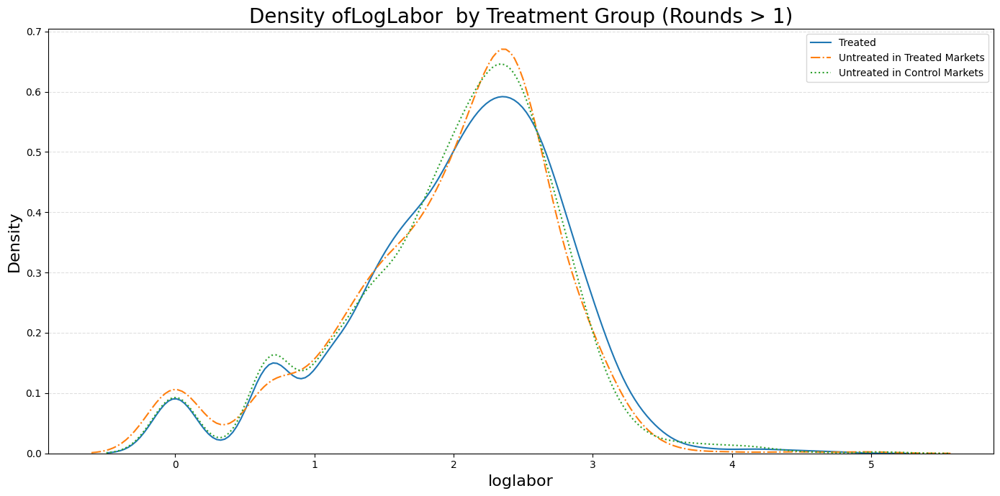

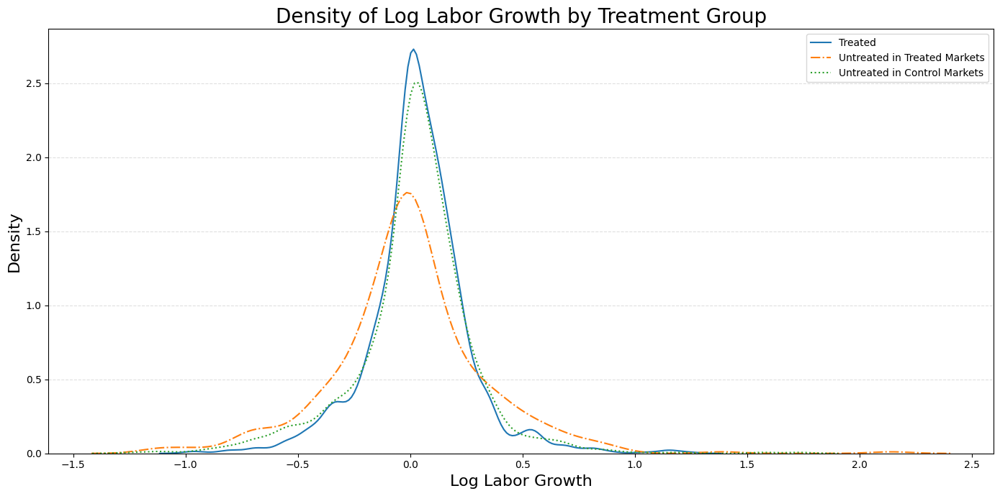

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


df = loanmain_df2.reset_index().copy()

# Calculate growth in log sales for rounds > 1
df['growth'] = df.groupby('firmid')['lnlabor'].diff().where(df['round'] > 1)

# Calculate average growthsales per firm for rounds > 1
df['avggrowth'] = df.groupby('firmid')['growth'].transform('mean').where(df['round'] > 1)

# Define the line styles for different groups
line_styles = {
    'Treated': 'solid',
    'Untreated in Treated Markets': 'dashdot',
    'Untreated in Control Markets': 'dotted'
}

# Plot for log sales (lnpart5revenue) in round 1
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] == 1)], x='lnlabor', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] == 1)], x='lnlabor', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] == 1)], x='lnlabor', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Labor by Treatment Group (Baseline Data)', fontsize=20)
plt.xlabel('Log Labor', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_labor_density.png', format = 'png')
plt.show()


# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='lnlabor', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='lnlabor', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='lnlabor', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density ofLogLabor  by Treatment Group (Rounds > 1)', fontsize=20)
plt.xlabel('loglabor', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='avggrowth', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Labor Growth by Treatment Group', fontsize=20)
plt.xlabel('Log Labor Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_labor_growth_density.png', format = 'png')
plt.show()


In [ ]:
df = loanmain_df2.reset_index().copy()

df['turnover_rate'] = abs(df['labor'].diff()) / df['labor'].shift(1)

# Filter out NaN values and irrelevant rounds
df = df[df['round'] > 1]

# Plot turnover rate by treatment group
plt.figure(figsize=(14, 7))
sns.barplot(data=df, x='intensity', y='turnover_rate', palette='Set2')
plt.title('Turnover Rate by Treatment Group')
plt.xlabel('Treatment Group')
plt.ylabel('Turnover Rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


df = loanmain_df2.reset_index().copy()

df['labor'].diff().head()

ValueError: Could not interpret value `intensity` for `x`. An entry with this name does not appear in `data`.

<Figure size 1400x700 with 0 Axes>

In [ ]:
loanmain_df2['intensity'] = loanmain_df2.apply(
    lambda row: 'Treated' if row['type'] == 1 else
                'Untreated, Control Market' if row['type'] == 0 and row['survey_town_type'] == 0 else
                'Untreated, Treated Market',
    axis=1
)

df_filtered = loanmain_df2[loanmain_df2['round'].isin([1, 3])]

# Pivot the data to get baseline and endline labor for each firm
df_pivot = df_filtered.pivot_table(index=['firmid', 'intensity'], columns='round', values='labor')

# Rename the columns for clarity
df_pivot.columns = ['labor_baseline', 'labor_endline']
df_pivot = df_pivot.reset_index()

df_pivot.head()

,firmid,intensity,labor_baseline,labor_endline
0,111.0,Treated,12.0,13.0
1,112.0,Treated,9.0,9.0
2,113.0,Treated,6.0,5.0
3,114.0,Treated,12.0,11.0
4,115.0,"Untreated, Treated Market",7.0,3.0


<ipython-input-36-43620d67c9a5>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_pivot, x='intensity', y='turnover_rate', palette='Set2')


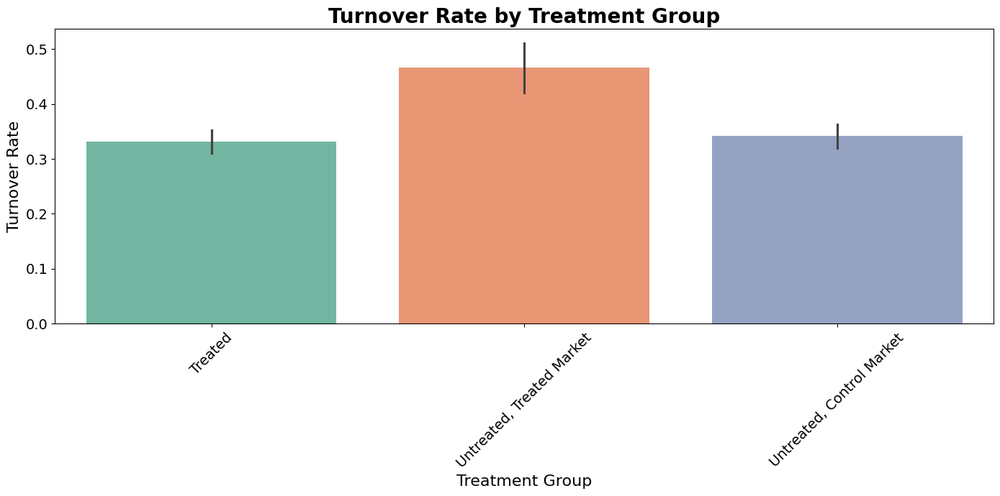

In [ ]:
df_pivot['labor_growth'] = (df_pivot['labor_endline'] - df_pivot['labor_baseline'])

# Calculate the number of employees who left (absolute value to ensure positivity)
df_pivot['employees_left'] = abs(df_pivot['labor_endline'] - df_pivot['labor_baseline'])

# Calculate the average number of employees during the period
df_pivot['average_employees'] = (df_pivot['labor_baseline'] + df_pivot['labor_endline']) / 2

# Calculate the turnover rate
df_pivot['turnover_rate'] = df_pivot['employees_left'] / df_pivot['average_employees']

# Remove rows where 'average_employees' is zero or NaN (to avoid division errors)
df_pivot = df_pivot.dropna(subset=['turnover_rate'])
df_pivot = df_pivot[df_pivot['average_employees'] > 0]

# Merge treatment group information back to the DataFrame if necessary

# Plotting turnover rate by treatment group
plt.figure(figsize=(14, 7))
sns.barplot(data=df_pivot, x='intensity', y='turnover_rate', palette='Set2')
plt.title('Turnover Rate by Treatment Group', fontsize=20, fontweight='bold')
plt.xlabel('Treatment Group', fontsize=16)
plt.ylabel('Turnover Rate', fontsize=16)
plt.xticks(fontsize=14, rotation=45)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig('turnover_rate_by_treatment_group.png', format = 'png')
plt.show()



In [ ]:
df_pivot.head()

,firmid,intensity,labor_baseline,labor_endline,labor_growth,employees_left,average_employees,turnover_rate
0,111.0,Treated,12.0,13.0,1.0,1.0,12.5,0.080000
1,112.0,Treated,9.0,9.0,0.0,0.0,9.0,0.000000
2,113.0,Treated,6.0,5.0,-1.0,1.0,5.5,0.181818
3,114.0,Treated,12.0,11.0,-1.0,1.0,11.5,0.086957
4,115.0,"Untreated, Treated Market",7.0,3.0,-4.0,4.0,5.0,0.800000


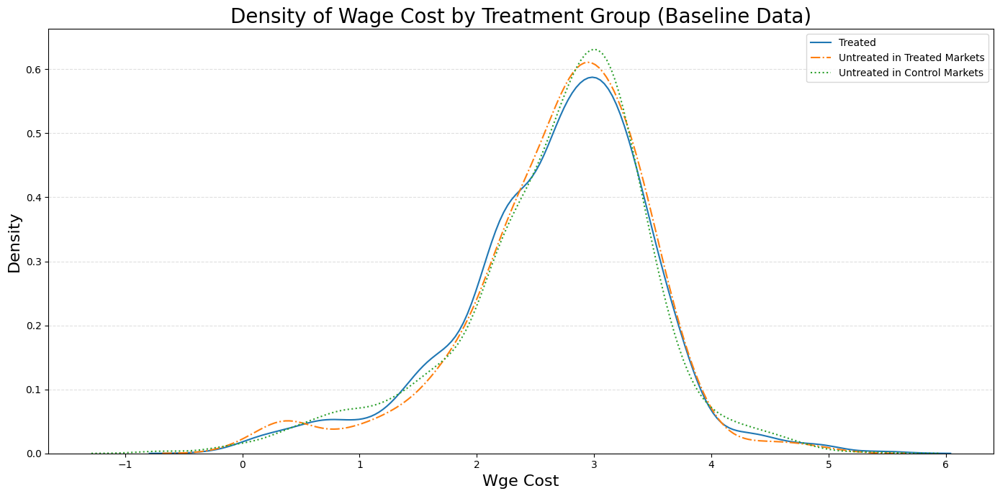

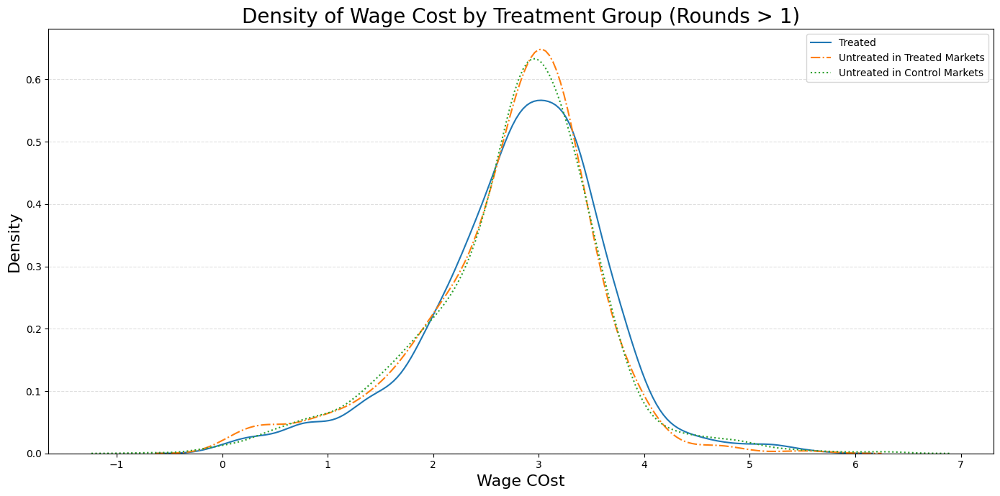

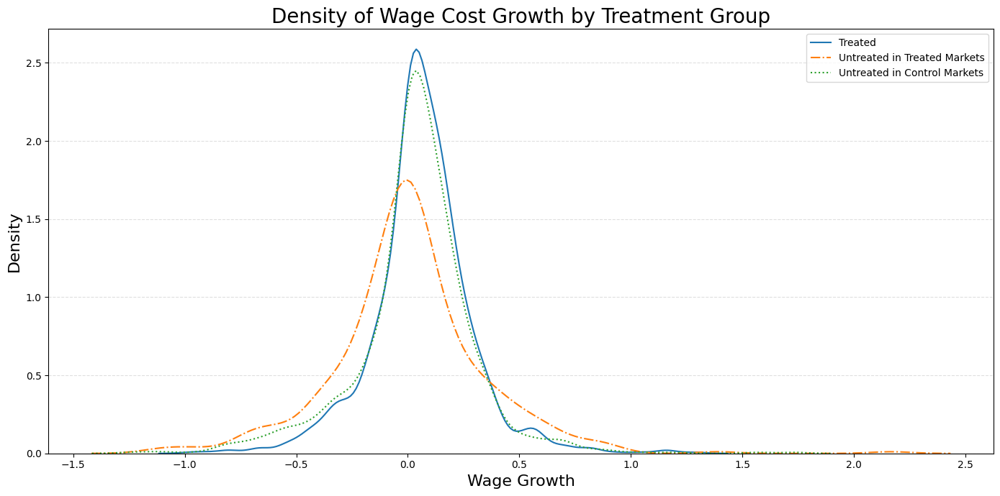

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


df = loanmain_df2.reset_index().copy()

# Calculate growth in log sales for rounds > 1
df['growth'] = df.groupby('firmid')['lnwage_cost'].diff().where(df['round'] > 1)

# Calculate average growthsales per firm for rounds > 1
df['avggrowth'] = df.groupby('firmid')['growth'].transform('mean').where(df['round'] > 1)

# Define the line styles for different groups
line_styles = {
    'Treated': 'solid',
    'Untreated in Treated Markets': 'dashdot',
    'Untreated in Control Markets': 'dotted'
}

# Plot for log sales (lnpart5revenue) in round 1
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] == 1)], x='lnwage_cost', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] == 1)], x='lnwage_cost', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] == 1)], x='lnwage_cost', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Wage Cost by Treatment Group (Baseline Data)', fontsize=20)
plt.xlabel('Wge Cost', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('wage_cost_density.png', format = 'png')
plt.show()

# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='lnwage_cost', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='lnwage_cost', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='lnwage_cost', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Wage Cost by Treatment Group (Rounds > 1)', fontsize=20)
plt.xlabel('Wage COst', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='avggrowth', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Wage Cost Growth by Treatment Group', fontsize=20)
plt.xlabel('Wage Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('wage_cost_growth_density.png', format = 'png')
plt.show()


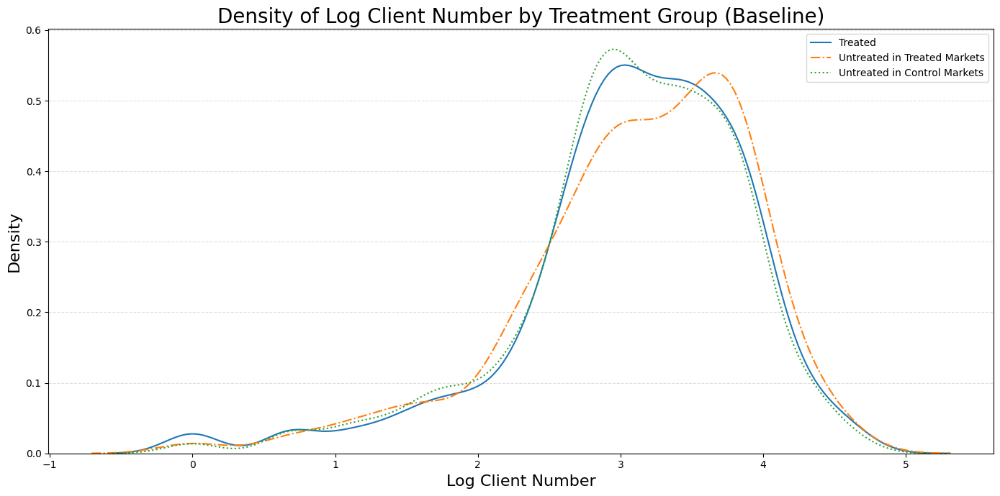

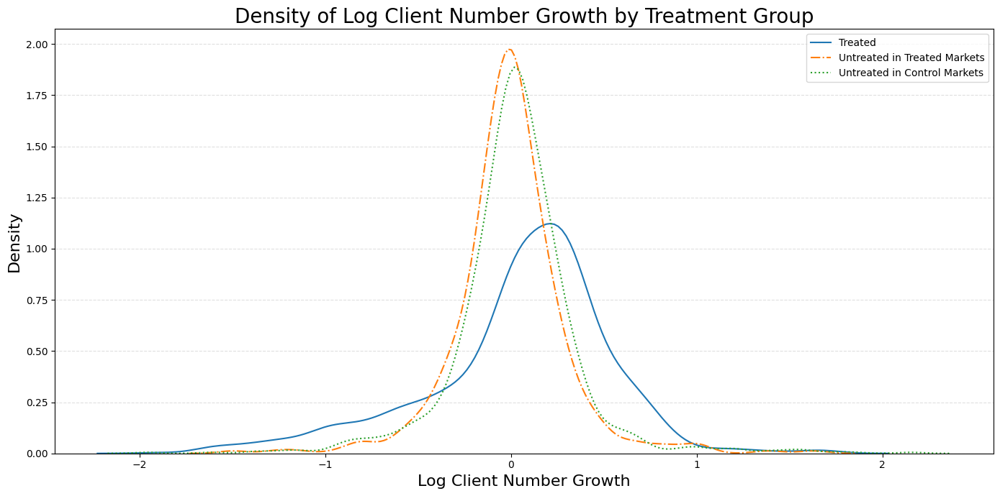

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


df = loanmain_df2.reset_index().copy()

# Calculate growth in log sales for rounds > 1
df['growth'] = df.groupby('firmid')['lnnum_clients'].diff().where(df['round'] > 1)

# Calculate average growthsales per firm for rounds > 1
df['avggrowth'] = df.groupby('firmid')['growth'].transform('mean').where(df['round'] > 1)

# Define the line styles for different groups
line_styles = {
    'Treated': 'solid',
    'Untreated in Treated Markets': 'dashdot',
    'Untreated in Control Markets': 'dotted'
}

# Plot for log sales (lnpart5revenue) in round 1
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] == 1)], x='lnnum_clients', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] == 1)], x='lnnum_clients', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] == 1)], x='lnnum_clients', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Client Number by Treatment Group (Baseline)', fontsize=20)
plt.xlabel('Log Client Number', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_client_number_density.png', format = 'png')
plt.show()

# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='avggrowth', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Log Client Number Growth by Treatment Group', fontsize=20)
plt.xlabel('Log Client Number Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('log_client_number_growth_density.png', format = 'png')
plt.show()


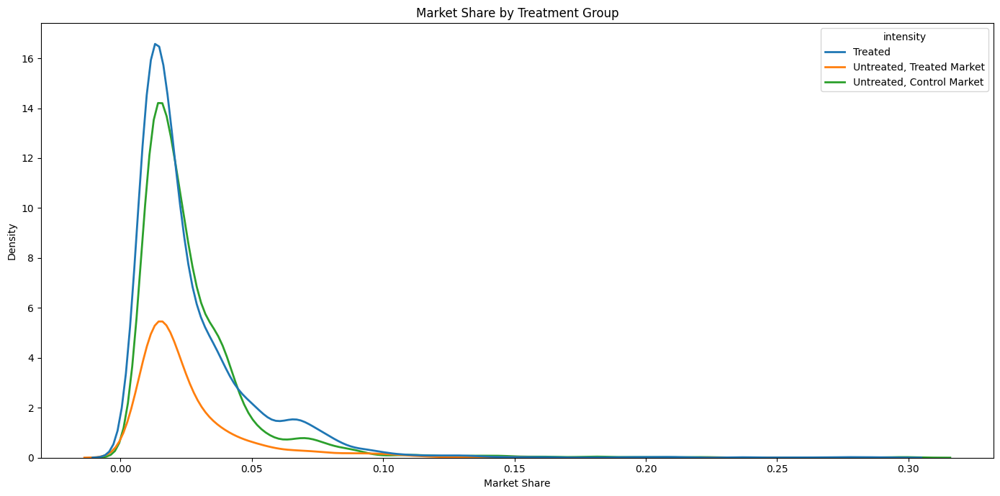

,firmid,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,...,_Ibasecount_7,_Ibasecount_8,_Ibasecount_9,_Ibasecount_10,_Ibasecount_11,basecounty,survey_town,intensity,total_market_revenue,market_share
0,111.0,0.0,0.0,1.0,38.0,0.0,34.0,15.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,7.0,9.0,Treated,353.502777,0.017288
1,111.0,0.0,0.0,0.0,39.0,0.0,50.0,12.0,0.0,2.0,...,1.0,0.0,0.0,0.0,0.0,7.0,9.0,Treated,326.107697,0.019711
2,111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,...,1.0,0.0,0.0,0.0,0.0,7.0,9.0,Treated,300.349792,0.013352
3,112.0,0.0,0.0,0.0,22.0,0.0,12.0,3.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,7.0,9.0,Treated,353.502777,0.012396
4,112.0,0.0,1.0,0.0,24.0,0.0,12.0,2.0,0.0,2.0,...,1.0,0.0,0.0,0.0,0.0,7.0,9.0,Treated,326.107697,0.013317


In [ ]:
# Calculate total market revenue by round and market
df = loanmain_df2.reset_index().copy()

df['total_market_revenue'] = df.groupby(['survey_town', 'round'])['lnpart5revenue'].transform('sum')

# Calculate market share for each firm
df['market_share'] = df['lnpart5revenue'] / df['total_market_revenue']

# Plot market share distribution by treatment group
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df, x='market_share', hue='intensity', linewidth=2)
plt.title('Market Share by Treatment Group')
plt.xlabel('Market Share')
plt.ylabel('Density')
plt.tight_layout()
plt.show()

df.head()

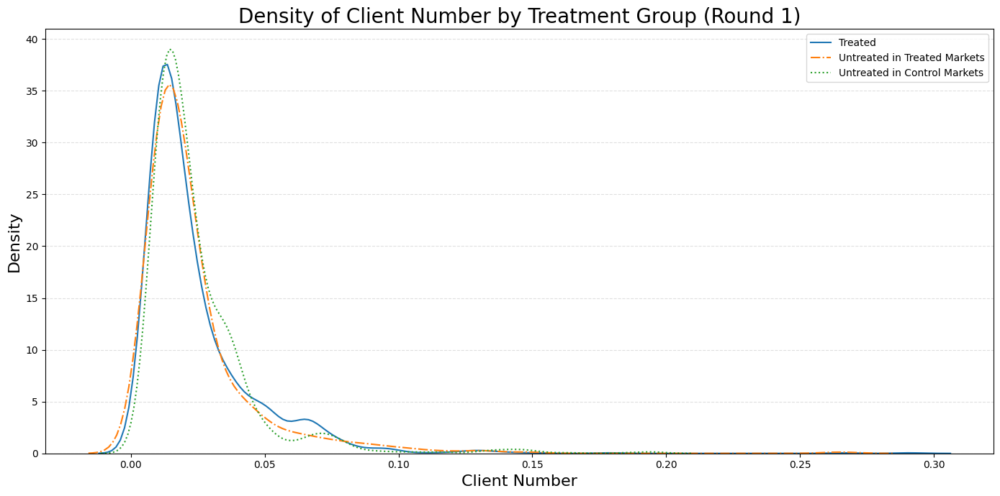

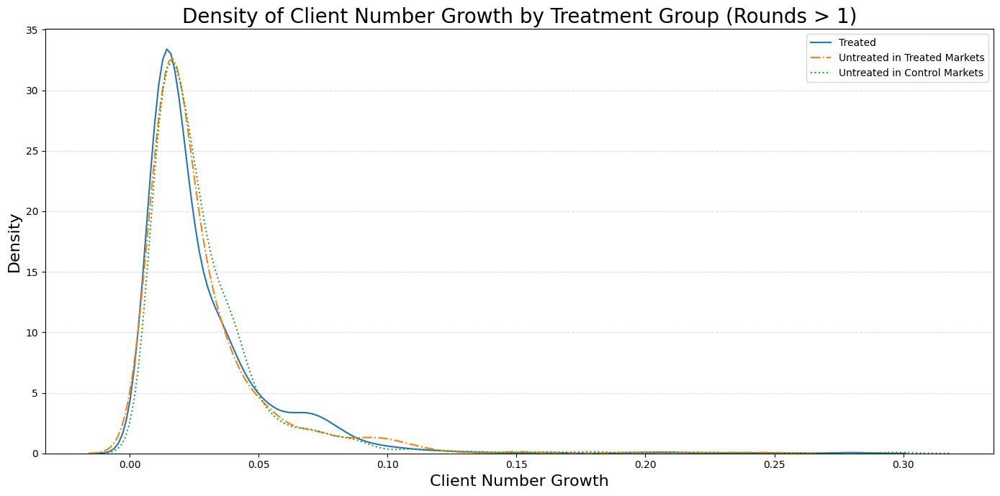

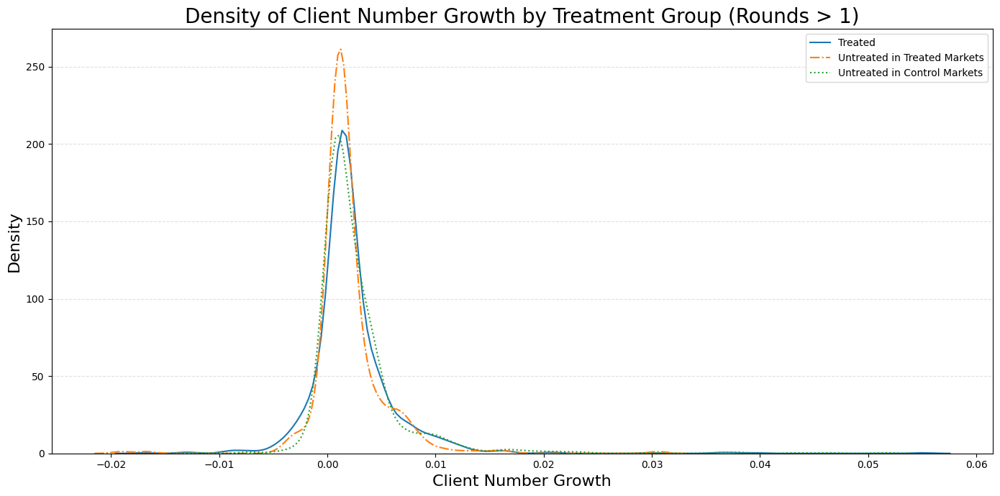

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# Calculate growth in log sales for rounds > 1
df['growth'] = df.groupby('firmid')['market_share'].diff().where(df['round'] > 1)

# Calculate average growthsales per firm for rounds > 1
df['avggrowth'] = df.groupby('firmid')['growth'].transform('mean').where(df['round'] > 1)

# Define the line styles for different groups
line_styles = {
    'Treated': 'solid',
    'Untreated in Treated Markets': 'dashdot',
    'Untreated in Control Markets': 'dotted'
}

# Plot for log sales (lnpart5revenue) in round 1
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] == 1)], x='market_share', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] == 1)], x='market_share', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] == 1)], x='market_share', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Client Number by Treatment Group (Round 1)', fontsize=20)
plt.xlabel('Client Number', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='market_share', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='market_share', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='market_share', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Client Number Growth by Treatment Group (Rounds > 1)', fontsize=20)
plt.xlabel('Client Number Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()
# Plot for average log sales growth (avggrowthsales)
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df[(df['type'] == 1) & (df['round'] > 1)], x='avggrowth', label='Treated', linestyle=line_styles['Treated'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] != 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Treated Markets', linestyle=line_styles['Untreated in Treated Markets'])
sns.kdeplot(data=df[(df['type'] == 0) & (df['survey_town_type'] == 0) & (df['round'] > 1)], x='avggrowth', label='Untreated in Control Markets', linestyle=line_styles['Untreated in Control Markets'])
plt.title('Density of Client Number Growth by Treatment Group (Rounds > 1)', fontsize=20)
plt.xlabel('Client Number Growth', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


In [ ]:
market_share_trends = df.groupby(['round', 'intensity'])['market_share'].mean().reset_index()

# Pivot the data to create columns for each treatment group
market_share_pivot = market_share_trends.pivot(index='round', columns='intensity', values='market_share')


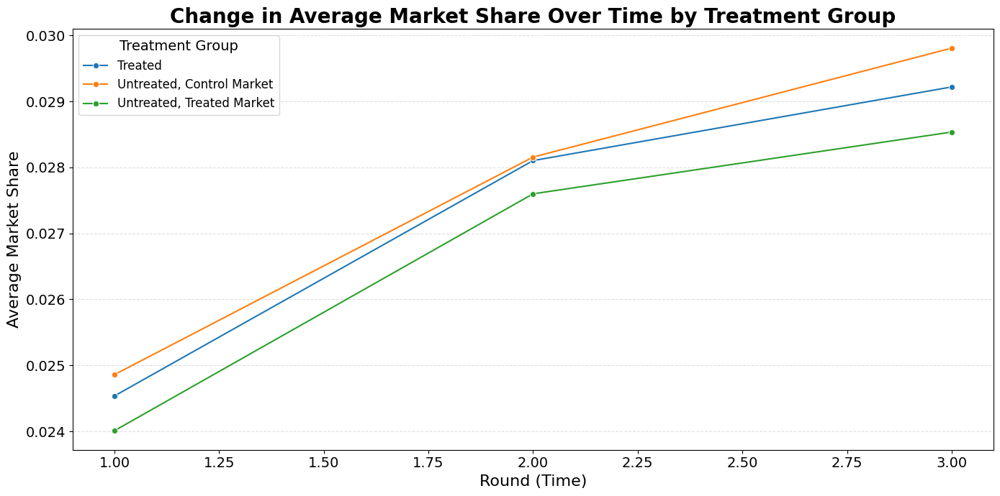

In [ ]:
plt.figure(figsize=(14, 7))
sns.lineplot(data=market_share_trends, x='round', y='market_share', hue='intensity', palette=palette, marker='o')
plt.title('Change in Average Market Share Over Time by Treatment Group', fontsize=20, fontweight='bold')
plt.xlabel('Round (Time)', fontsize=16)
plt.ylabel('Average Market Share', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='Treatment Group', fontsize=12, title_fontsize=14, loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

In [ ]:
df.head()

,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,polconnection,...,indsize,indsalessum,marketshare,marketshare2,herf,invherf,interpost,inter4post,interpost_comp1,interpost_comp2
firmid,,,,,,,,,,,,,,,,,,,,,
111.0,0.0,0.0,1.0,38.0,0.0,34.0,15.0,0.0,1.0,0.0,...,36.0,11503.500000,0.019603,0.000384,0.015637,63.951118,0.0,0.000000,0.000000,0.0
111.0,0.0,0.0,0.0,39.0,0.0,50.0,12.0,0.0,2.0,NaN,...,36.0,13403.729492,0.023087,0.000533,0.016157,61.892632,1.0,0.771429,0.771429,0.0
111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,NaN,...,36.0,12727.082031,0.002167,0.000005,0.018490,54.083206,1.0,0.771429,0.771429,0.0
112.0,0.0,0.0,0.0,22.0,0.0,12.0,3.0,1.0,1.0,0.0,...,6.0,1845.000000,0.021680,0.000470,0.160916,6.214418,0.0,0.000000,0.000000,0.0
112.0,0.0,1.0,0.0,24.0,0.0,12.0,2.0,0.0,2.0,NaN,...,6.0,1768.178589,0.021749,0.000473,0.181971,5.495395,1.0,0.800000,0.800000,0.0


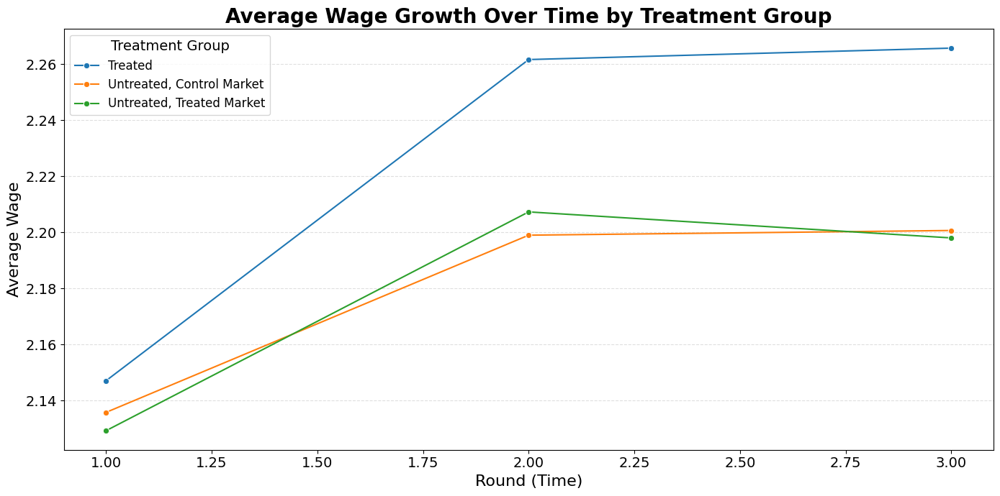

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = loanmain_df2.copy()
# Custom color palette for distinct colors
palette = {
    'Treated': '#1f77b4',  # Blue
    'Untreated, Control Market': '#ff7f0e',  # Orange
    'Untreated, Treated Market': '#2ca02c',  # Green
    'Unknown': '#d62728'  # Red (in case of unknowns)
}

# Calculate average wage for each round
df['average_wage'] = df['wage_cost'] / df['labor']

# Calculate the average wage growth for each treatment group by round
wage_growth_trends = df.groupby(['round', 'intensity'])['average_wage'].mean().reset_index()

# Plotting wage growth trends over time by treatment group
plt.figure(figsize=(14, 7))
sns.lineplot(data=wage_growth_trends, x='round', y='average_wage', hue='intensity', palette=palette, marker='o')
plt.title('Average Wage Growth Over Time by Treatment Group', fontsize=20, fontweight='bold')
plt.xlabel('Round (Time)', fontsize=16)
plt.ylabel('Average Wage', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='Treatment Group', fontsize=12, title_fontsize=14, loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


## Take-Up - effects on borrowing

In [58]:
df = loanmain_df2.copy()



df['townsize'] = df.groupby(['survey_town', 'round'])['type'].transform('count')


df['indsize'] = df.groupby(['survey_town', 'industry', 'round'])['type'].transform('count')


df['indsalessum'] = df.groupby(['industry', 'survey_town', 'round'])['part5revenue'].transform('sum')



In [59]:
# Calculate market share and Herfindahl index
df['marketshare'] = df['part5revenue'] / (2 * df['indsalessum'])
df['marketshare2'] = df['marketshare'] ** 2
df['herf'] = df.groupby(['survey_town', 'industry', 'round'])['marketshare2'].transform('sum') * 2
df['invherf'] = 1 / df['herf']

baseline_data = df[df['post'] == 0]
endline_data = df[df['round'] == 3]


In [23]:

endline_data['sumtreated'] = endline_data.groupby(['survey_town', 'round'])['type'].transform('sum')
endline_data['treatratio_peer'] = (endline_data['sumtreated'] - endline_data['type']) / (endline_data['townsize'] - 1)
endline_data['inter_untpeer'] = endline_data['treatratio_peer'] * (1 - endline_data['type'])


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
endline_data.head()

,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,polconnection,...,townsize,indsize,indsalessum,marketshare,marketshare2,herf,invherf,sumtreated,treatratio_peer,inter_untpeer
firmid,,,,,,,,,,,,,,,,,,,,,
111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,NaN,...,63,36.0,12727.082031,0.002167,0.000005,0.018490,54.083206,49.0,0.774194,0.000000
112.0,0.0,1.0,0.0,25.0,0.0,43.0,1.0,0.0,3.0,NaN,...,63,6.0,1246.252686,0.157129,0.024689,0.110216,9.073053,49.0,0.774194,0.000000
113.0,0.0,0.0,0.0,32.0,0.0,31.0,3.0,0.0,3.0,NaN,...,63,36.0,12727.082031,0.011853,0.000140,0.018490,54.083206,49.0,0.774194,0.000000
114.0,0.0,0.0,0.0,34.0,0.0,157.0,1.0,0.0,3.0,NaN,...,63,36.0,12727.082031,0.020031,0.000401,0.018490,54.083206,49.0,0.774194,0.000000
115.0,1.0,0.0,NaN,NaN,NaN,10.0,1.0,0.0,3.0,NaN,...,63,13.0,2705.632812,0.013161,0.000173,0.059791,16.724821,49.0,0.790323,0.790323


In [ ]:
summary_stats = endline_data[(endline_data['round'] == 3) & (endline_data['survey_town_type'] == 0)][['newloan', 'otherloan_end', 'allloan_end']].describe()
print(summary_stats)

           newloan  otherloan_end  allloan_end
count  1247.000000    1040.000000  1042.000000
mean      0.031275       0.295192     0.321497
std       0.174128       0.456349     0.467278
min       0.000000       0.000000     0.000000
25%       0.000000       0.000000     0.000000
50%       0.000000       0.000000     0.000000
75%       0.000000       1.000000     1.000000
max       1.000000       1.000000     1.000000


In [ ]:
X = sm.add_constant(endline_data[endline_data['round'] == 3]['type'])
y = endline_data[endline_data['round'] == 3]['newloan']
model_type = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': endline_data['survey_town']})
mean_newloan = endline_data[(endline_data['round'] == 3) & (endline_data['survey_town_type'] == 0)]['newloan'].mean()


print(model_type.summary())

                            OLS Regression Results                            
Dep. Variable:                newloan   R-squared:                       0.124
Model:                            OLS   Adj. R-squared:                  0.124
Method:                 Least Squares   F-statistic:                     67.38
Date:                Sun, 20 Oct 2024   Prob (F-statistic):           4.04e-12
Time:                        22:54:30   Log-Likelihood:                -1347.6
No. Observations:                3173   AIC:                             2699.
Df Residuals:                    3171   BIC:                             2711.
Df Model:                           1                                         
Covariance Type:              cluster                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0674      0.014      4.817      0.0

In [ ]:
endline_data_clean = endline_data.copy()

In [ ]:
X = sm.add_constant(endline_data_clean[endline_data_clean['round'] == 3][['type', 'inter_untpeer']])
y = endline_data_clean[endline_data_clean['round'] == 3]['newloan']
model_type_inter = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': endline_data_clean['survey_town']})
mean_newloan = endline_data_clean[(endline_data_clean['round'] == 3) & (endline_data_clean['survey_town_type'] == 0)]['newloan'].mean()

print(model_type_inter.summary())


                            OLS Regression Results                            
Dep. Variable:                newloan   R-squared:                       0.136
Model:                            OLS   Adj. R-squared:                  0.135
Method:                 Least Squares   F-statistic:                     44.63
Date:                Sun, 20 Oct 2024   Prob (F-statistic):           1.35e-13
Time:                        22:54:38   Log-Likelihood:                -1326.3
No. Observations:                3173   AIC:                             2659.
Df Residuals:                    3170   BIC:                             2677.
Df Model:                           2                                         
Covariance Type:              cluster                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0323      0.012      2.721

In [ ]:
X = sm.add_constant(endline_data_clean[endline_data_clean['round'] == 3][['T50', 'T80', 'C50', 'C80']])
y = endline_data_clean[endline_data_clean['round'] == 3]['newloan']
model_market_indicators = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': endline_data_clean['survey_town']})
mean_newloan = endline_data_clean[(endline_data_clean['round'] == 3) & (endline_data_clean['survey_town_type'] == 0)]['newloan'].mean()


print(model_market_indicators.summary())

Step 5 completed: Regression for 'newloan' with market indicators.
                            OLS Regression Results                            
Dep. Variable:                newloan   R-squared:                       0.136
Model:                            OLS   Adj. R-squared:                  0.135
Method:                 Least Squares   F-statistic:                     24.22
Date:                Tue, 01 Oct 2024   Prob (F-statistic):           5.38e-13
Time:                        17:47:31   Log-Likelihood:                -1326.0
No. Observations:                3173   AIC:                             2662.
Df Residuals:                    3168   BIC:                             2692.
Df Model:                           4                                         
Covariance Type:              cluster                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------

In [ ]:
endline_data_cleans = endline_data_clean[(endline_data_clean['round'] == 3) & (~endline_data_clean['otherloan_end'].isna())]
endline_data_cleans[endline_data_cleans["round"] == 3]["otherloan_end"].isna().sum()

0

In [ ]:
# Drop all NaN values in 'otherloan_end' for round 3

# Step 6a: Regression for 'otherloan_end' with 'type' and 'inter_untpeer' using data with all NaNs dropped
X_otherloan_inter = sm.add_constant(endline_data_cleans[['type', 'inter_untpeer']])
y_otherloan_inter = endline_data_cleans['otherloan_end']
model_otherloan_inter = sm.OLS(y_otherloan_inter, X_otherloan_inter).fit(cov_type='cluster', cov_kwds={'groups': endline_data_cleans['survey_town']})

mean_otherloan_inter = endline_data_cleans[endline_data_cleans['survey_town_type'] == 0]['otherloan_end'].mean()

print(model_otherloan_inter.summary())



Step 6a completed: Regression for 'otherloan_end' with 'type' and 'inter_untpeer' (all NaNs dropped).
                            OLS Regression Results                            
Dep. Variable:          otherloan_end   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.229
Date:                Sun, 20 Oct 2024   Prob (F-statistic):              0.298
Time:                        05:19:53   Log-Likelihood:                -1718.1
No. Observations:                2658   AIC:                             3442.
Df Residuals:                    2655   BIC:                             3460.
Df Model:                           2                                         
Covariance Type:              cluster                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
--------------------------

In [ ]:
X_otherloan_inter = sm.add_constant(endline_data_cleans[['T50', 'T80', 'C50', 'C80']])
y_otherloan_inter = endline_data_cleans['otherloan_end']
model_otherloan_inter = sm.OLS(y_otherloan_inter, X_otherloan_inter).fit(cov_type='cluster', cov_kwds={'groups': endline_data_cleans['survey_town']})

mean_otherloan_inter = endline_data_cleans[endline_data_cleans['survey_town_type'] == 0]['otherloan_end'].mean()

print(model_otherloan_inter.summary())



Step 6b completed: Regression for 'otherloan_end' with market indicators
                            OLS Regression Results                            
Dep. Variable:          otherloan_end   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7485
Date:                Sun, 20 Oct 2024   Prob (F-statistic):              0.562
Time:                        05:19:58   Log-Likelihood:                -1718.1
No. Observations:                2658   AIC:                             3446.
Df Residuals:                    2653   BIC:                             3476.
Df Model:                           4                                         
Covariance Type:              cluster                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------

In [ ]:
# Regression for 'allloan_end' with 'type' and 'inter_untpeer' using data with all NaNs dropped
X_allloan_inter = sm.add_constant(endline_data_cleans[['type', 'inter_untpeer']])
y_allloan_inter = endline_data_cleans['allloan_end']
model_allloan_inter = sm.OLS(y_allloan_inter, X_allloan_inter).fit(cov_type='cluster', cov_kwds={'groups': endline_data_cleans['survey_town']})

mean_allloan_inter = endline_data_cleans[endline_data_cleans['survey_town_type'] == 0]['allloan_end'].mean()


print(model_allloan_inter.summary())


Step 6a completed: Regression for 'allloan_end' with 'type' and 'inter_untpeer' (all NaNs dropped).
                            OLS Regression Results                            
Dep. Variable:            allloan_end   R-squared:                       0.065
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     33.72
Date:                Sun, 20 Oct 2024   Prob (F-statistic):           3.04e-11
Time:                        05:20:04   Log-Likelihood:                -1832.9
No. Observations:                2658   AIC:                             3672.
Df Residuals:                    2655   BIC:                             3689.
Df Model:                           2                                         
Covariance Type:              cluster                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
----------------------------

In [ ]:
# Regression for 'allloan_end' with 'type' and 'inter_untpeer' using data with all NaNs dropped
X_allloan_inter = sm.add_constant(endline_data_cleans[['T50', 'T80', 'C50', 'C80']])
y_allloan_inter = endline_data_cleans['allloan_end']
model_allloan_inter = sm.OLS(y_allloan_inter, X_allloan_inter).fit(cov_type='cluster', cov_kwds={'groups': endline_data_cleans['survey_town']})

mean_allloan_inter = endline_data_cleans[endline_data_cleans['survey_town_type'] == 0]['allloan_end'].mean()

print(model_allloan_inter.summary())



Step 6a completed: Regression for 'allloan_end' with market indicators.
                            OLS Regression Results                            
Dep. Variable:            allloan_end   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     19.38
Date:                Sun, 20 Oct 2024   Prob (F-statistic):           4.60e-11
Time:                        06:23:21   Log-Likelihood:                -1833.3
No. Observations:                2658   AIC:                             3677.
Df Residuals:                    2653   BIC:                             3706.
Df Model:                           4                                         
Covariance Type:              cluster                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

## Fixed Effects Model (eq. 1) direct and indirect effects on main outcomes

In [24]:
df['interpost'] = df['post'] * df['type']
df['inter4post'] = df['post'] * df['treatratio_comp']
df['interpost_comp1'] = df['post'] * df['treatratio_comp'] * df['type']
df['interpost_comp2'] = df['post'] * df['treatratio_comp'] * (1 - df['type'])


#for i in range(1, 9):
 #   df[f'category{i}'] = (df['category'] == i).astype(int)

# Drop the original category variable
#df.drop(columns=['category'], inplace=True)


In [25]:
variables_of_interest = ['lnpart5revenue', 'total_profit', 'lnlabor', 'lnwage_cost',
                         'total_fixedassets', 'lnmaterial_cost', 'shutdown']

# Calculate pre-treatment means for the pure control group
pre_treatment_means = df[(df['round'] == 1) &
                                         (df['survey_town_type'] == 0)][variables_of_interest].mean()

print(pre_treatment_means)

lnpart5revenue        5.453523
total_profit         51.945339
lnlabor               1.956379
lnwage_cost           2.674623
total_fixedassets    12.004972
lnmaterial_cost       4.924638
shutdown              0.000000
dtype: float64


In [26]:
!pip install linearmodels -q
from linearmodels.panel import PanelOLS
import statsmodels.api as sm
from statsmodels.stats.multitest import multipletests
import numpy as np

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 30.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dowhy 0.12 requires cython<3.0, but you have cython 3.0.11 which is incompatible.


In [ ]:
df_fe = df.reset_index().set_index(['survey_town', 'round'])
df_fe.head()

firmid  shutdown  newproduct  gender   age  \
survey_town round                                               
9.0         1.0     111.0       0.0         0.0     1.0  38.0   
            2.0     111.0       0.0         0.0     0.0  39.0   
            3.0     111.0       0.0         0.0     0.0  41.0   
            1.0     112.0       0.0         0.0     0.0  22.0   
            2.0     112.0       0.0         1.0     0.0  24.0   

                   education_college  num_clients  num_supplier  bankloan  \
survey_town round                                                           
9.0         1.0                  0.0         34.0          15.0       0.0   
            2.0                  0.0         50.0          12.0       0.0   
            3.0                  0.0         17.0          13.0       0.0   
            1.0                  0.0         12.0           3.0       1.0   
            2.0                  0.0         12.0           2.0       0.0   

                   polconnection  ...  indsize   indsalessum  marketshare  \
survey_town round                 ...                                       
9.0         1.0              0.0  ...     36.0  11503.500000     0.019603   
            2.0              NaN  ...     36.0  13403.729492     0.023087   
            3.0              NaN  ...     36.0  12727.082031     0.002167   
            1.0              0.0  ...      6.0   1845.000000     0.021680   
            2.0              NaN  ...      6.0   1768.178589     0.021749   

                   marketshare2      herf    invherf  interpost  inter4post  \
survey_town round                                                             
9.0         1.0        0.000384  0.015637  63.951118        0.0    0.000000   
            2.0        0.000533  0.016157  61.892632        1.0    0.771429   
            3.0        0.000005  0.018490  54.083206        1.0    0.771429   
            1.0        0.000470  0.160916   6.214418        0.0    0.000000   
            2.0        0.000473  0.181971   5.495395        1.0    0.800000   

                   interpost_comp1  interpost_comp2  
survey_town round                                    
9.0         1.0           0.000000              0.0  
            2.0           0.771429              0.0  
            3.0           0.771429              0.0  
            1.0           0.000000              0.0  
            2.0           0.800000              0.0  

[5 rows x 100 columns]

In [ ]:

table3_results = {}

# Loop through each variable to run the fixed-effects regression
for var in variables_of_interest:
    # Define dependent and independent variables
    y = df_fe[var]
    X = df_fe[['post', 'interpost', 'inter4post']]

    # Run fixed-effects regression
    model_fe = PanelOLS(y, X, entity_effects=True)
    results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

    # Store the results in the dictionary
    table3_results[var] = results_fe

# Prepare a DataFrame to store the summary results for Table 3
table3_summary = {
    'Variable': [],
    'Post * Treated Coef.': [],
    'Post * Treated SE': [],
    'Post * Share Competitors Treated Coef.': [],
    'Post * Share Competitors Treated SE': [],
    'Mean of Pure Control': []
}

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.1

In [ ]:
table3_results

{'lnpart5revenue':                           PanelOLS Estimation Summary                           
 Dep. Variable:         lnpart5revenue   R-squared:                        0.0026
 Estimator:                   PanelOLS   R-squared (Between):              0.0140
 No. Observations:                8612   R-squared (Within):               0.0026
 Date:                Mon, Nov 04 2024   R-squared (Overall):              0.0136
 Time:                        00:03:43   Log-likelihood                -1.049e+04
 Cov. Estimator:             Clustered                                           
                                         F-statistic:                      7.4571
 Entities:                          78   P-value                           0.0001
 Avg Obs:                       110.41   Distribution:                  F(3,8531)
 Min Obs:                       12.000                                           
 Max Obs:                       385.00   F-statistic (robust):             8.283

In [ ]:
# Extract the coefficients, standard errors, and pre-treatment means for each variable
for var in variables_of_interest:
    results_fe = table3_results[var]

    # Extract coefficients and standard errors
    coef = results_fe.params[['interpost', 'inter4post']]
    se = results_fe.std_errors[['interpost', 'inter4post']]

    # Store values in the summary dictionary
    table3_summary['Variable'].append(var)
    table3_summary['Post * Treated Coef.'].append(coef['interpost'])
    table3_summary['Post * Treated SE'].append(se['interpost'])
    table3_summary['Post * Share Competitors Treated Coef.'].append(coef['inter4post'])
    table3_summary['Post * Share Competitors Treated SE'].append(se['inter4post'])
    table3_summary['Mean of Pure Control'].append(pre_treatment_means[var])

# Convert to DataFrame for display
table3_df = pd.DataFrame(table3_summary)

# Display the table summary
print("Table 3 Summary:")
print(table3_df)

Table 3 Summary:
            Variable  Post * Treated Coef.  Post * Treated SE  \
0     lnpart5revenue              0.105610           0.050751   
1       total_profit             12.128553           3.060866   
2            lnlabor              0.094043           0.029821   
3        lnwage_cost              0.118025           0.034808   
4  total_fixedassets              6.358217           2.169043   
5    lnmaterial_cost              0.054545           0.061615   
6           shutdown             -0.027997           0.009274   

   Post * Share Competitors Treated Coef.  \
0                               -0.116796   
1                              -12.273957   
2                               -0.087245   
3                               -0.085867   
4                               -1.471354   
5                               -0.028614   
6                                0.000273   

   Post * Share Competitors Treated SE  Mean of Pure Control  
0                             0.055814

In [ ]:
# Assuming the p-values have been extracted from table3_results
p_values_interpost = []
p_values_inter4post = []

# Loop through results to extract p-values for 'interpost' and 'inter4post'
for var in variables_of_interest:
    results = table3_results[var]
    p_values_interpost.append(results.pvalues['interpost'])
    p_values_inter4post.append(results.pvalues['inter4post'])

# Combine all p-values for multiple testing adjustment
all_p_values = np.array(p_values_interpost + p_values_inter4post)

# Applying the Romano-Wolf adjustment using the Holm method
_, rw_p_values, _, _ = multipletests(all_p_values, method='holm')

# Split the adjusted p-values for display
rw_p_values_interpost = rw_p_values[:len(p_values_interpost)]
rw_p_values_inter4post = rw_p_values[len(p_values_interpost):]

# Display Romano-Wolf adjusted p-values
print("\nRomano-Wolf adjusted p-values for 'interpost':")
for i, var in enumerate(variables_of_interest):
    print(f"{var}: {rw_p_values_interpost[i]:.4f}")

print("\nRomano-Wolf adjusted p-values for 'inter4post':")
for i, var in enumerate(variables_of_interest):
    print(f"{var}: {rw_p_values_inter4post[i]:.4f}")



Romano-Wolf adjusted p-values for 'interpost':
lnpart5revenue: 0.2549
total_profit: 0.0010
lnlabor: 0.0194
lnwage_cost: 0.0091
total_fixedassets: 0.0338
lnmaterial_cost: 1.0000
shutdown: 0.0280

Romano-Wolf adjusted p-values for 'inter4post':
lnpart5revenue: 0.2549
total_profit: 0.2193
lnlabor: 0.2193
lnwage_cost: 0.2549
total_fixedassets: 1.0000
lnmaterial_cost: 1.0000
shutdown: 1.0000


In [ ]:
df_fe['survey_town_copy'] = df_fe.index.get_level_values('survey_town')

In [ ]:
adjusted_p_values_interpost, adjusted_p_values_inter4post = bootstrap_rw_pvalues(df_fe, num_bootstrap=100, cluster_var='survey_town_copy')

# Display the results
variables_of_interest = ['lnpart5revenue', 'total_profit', 'lnlabor', 'lnwage_cost',
                         'total_fixedassets', 'lnmaterial_cost', 'shutdown']

print("\nRomano-Wolf adjusted p-values for 'interpost':")
for i, var in enumerate(variables_of_interest):
    print(f"{var}: {adjusted_p_values_interpost[i]:.4f}")

print("\nRomano-Wolf adjusted p-values for 'inter4post':")
for i, var in enumerate(variables_of_interest):
    print(f"{var}: {adjusted_p_values_inter4post[i]:.4f}")

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.1

KeyboardInterrupt: 

In [ ]:

# Run the fixed-effects regression for 'lnpart5revenue' without adding a constant
y_lnpart5revenue = df_fe['lnpart5revenue']
X_lnpart5revenue = df_fe[['post', 'interpost', 'inter4post']]
model_fe_lnpart5revenue = PanelOLS(y_lnpart5revenue, X_lnpart5revenue, entity_effects=True)
results_fe_lnpart5revenue = model_fe_lnpart5revenue.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for lnpart5revenue using the entire dataset without an explicit constant:")
print(results_fe_lnpart5revenue.summary)

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


Results for lnpart5revenue using the entire dataset without an explicit constant:
                          PanelOLS Estimation Summary                           
Dep. Variable:         lnpart5revenue   R-squared:                        0.0026
Estimator:                   PanelOLS   R-squared (Between):              0.0140
No. Observations:                8612   R-squared (Within):               0.0026
Date:                Sun, Oct 20 2024   R-squared (Overall):              0.0136
Time:                        23:01:10   Log-likelihood                -1.049e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      7.4571
Entities:                          78   P-value                           0.0001
Avg Obs:                       110.41   Distribution:                  F(3,8531)
Min Obs:                       12.000                                           
Max Obs:                   

In [ ]:
y = df_fe['total_profit']
X = df_fe[['post', 'interpost', 'inter4post']]
model_fe = PanelOLS(y, X, entity_effects=True)
results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for total_profit using the entire dataset without an explicit constant:")
print(results_fe.summary)

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


Results for total_profit using the entire dataset without an explicit constant:
                          PanelOLS Estimation Summary                           
Dep. Variable:           total_profit   R-squared:                        0.0044
Estimator:                   PanelOLS   R-squared (Between):              0.0988
No. Observations:                8612   R-squared (Within):               0.0044
Date:                Sun, Oct 20 2024   R-squared (Overall):              0.0510
Time:                        23:01:14   Log-likelihood                -4.865e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      12.520
Entities:                          78   P-value                           0.0000
Avg Obs:                       110.41   Distribution:                  F(3,8531)
Min Obs:                       12.000                                           
Max Obs:                     

In [ ]:
y = df_fe['lnlabor']
X = df_fe[['post', 'interpost', 'inter4post']]
model_fe = PanelOLS(y, X, entity_effects=True)
results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for ln_labor using the entire dataset without an explicit constant:")
print(results_fe.summary)

In [ ]:
y = df_fe['lnwage_cost']
X = df_fe[['post', 'interpost', 'inter4post']]
model_fe = PanelOLS(y, X, entity_effects=True)
results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for total_profit using the entire dataset without an explicit constant:")
print(results_fe.summary)

In [ ]:
y = df_fe['total_fixedassets']
X = df_fe[['post', 'interpost', 'inter4post']]
model_fe = PanelOLS(y, X, entity_effects=True)
results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for total_profit using the entire dataset without an explicit constant:")
print(results_fe.summary)

In [ ]:
y = df_fe['lnmaterial_cost']
X = df_fe[['post', 'interpost', 'inter4post']]
model_fe = PanelOLS(y, X, entity_effects=True)
results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for log material cost using the entire dataset without an explicit constant:")
print(results_fe.summary)

In [ ]:
y = df_fe['shutdown']
X = df_fe[['post', 'interpost', 'inter4post']]
model_fe = PanelOLS(y, X, entity_effects=True)
results_fe = model_fe.fit(cov_type='clustered', cluster_entity=True)

# Display the regression results
print("Results for log material cost using the entire dataset without an explicit constant:")
print(results_fe.summary)

## Cleaning for ridge and lasso

In [ ]:
df_attempt = df
# List of columns where the issue occurs (the ones with firm-level data reported once).
columns_to_fill = ['polconnection', 'firmage', 'lnsales2', 'stock_frequency', 'newsupplier', 'stockmanage', 'RCC_amount', 'aallloan_end', 'lnsalesdif', 'finknowledge', 'difficultyloan']  # Add more columns as needed

# Group by firm ID and apply forward fill followed by backward fill to fill in missing values within each firm group
for column in columns_to_fill:
    df_attempt[column] = df_attempt.groupby('firmid')[column].transform(lambda x: x.ffill().bfill())

# You can check the result to ensure it worked as expected
print(df_attempt[columns_to_fill].head())  # Example output check for cleaned columns

df_attempt.describe()

   polconnection  firmage  lnsales2  stock_frequency  newsupplier  \
0            0.0      5.0  3.990508              2.0          0.0   
1            0.0      5.0  3.990508              2.0          0.0   
2            0.0      5.0  3.990508              2.0          0.0   
3            0.0      6.0  5.989713              1.0          0.0   
4            0.0      6.0  5.989713              1.0          0.0   

   stockmanage  RCC_amount  aallloan_end  lnsalesdif  finknowledge  \
0          1.0         0.0           0.0         1.0           0.2   
1          1.0         0.0           0.0         1.0           0.2   
2          1.0         0.0           0.0         1.0           0.2   
3          0.0         0.0           0.0         0.0           0.6   
4          0.0         0.0           0.0         0.0           0.6   

   difficultyloan  
0            0.50  
1            0.50  
2            0.50  
3            0.25  
4            0.25  


,firmid,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,...,_Ibasecount_4,_Ibasecount_5,_Ibasecount_6,_Ibasecount_7,_Ibasecount_8,_Ibasecount_9,_Ibasecount_10,_Ibasecount_11,basecounty,survey_town
count,9.519000e+03,8847.000000,8612.000000,8206.000000,8159.000000,8167.000000,8612.000000,8724.000000,8612.000000,9519.000000,...,8735.000000,8735.000000,8735.000000,8735.000000,8735.000000,8735.000000,8735.000000,8735.000000,8343.000000,9519.000000
mean,9.719513e+08,0.040127,0.090687,0.558494,39.093639,0.187707,31.924988,6.628840,0.201231,2.000000,...,0.067315,0.034001,0.028163,0.117344,0.035718,0.066285,0.016829,0.026789,4.103920,36.253704
std,9.669115e+09,0.196267,0.287181,0.496597,8.937009,0.390502,26.599800,9.719263,0.400943,0.816539,...,0.250582,0.181242,0.165447,0.321848,0.185598,0.248794,0.128637,0.161475,2.646587,21.911871
min,1.110000e+02,0.000000,0.000000,0.000000,15.000000,0.000000,1.000000,-7.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,2.225700e+04,0.000000,0.000000,0.000000,32.000000,0.000000,15.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,18.000000
50%,3.422000e+04,0.000000,0.000000,1.000000,39.000000,0.000000,25.000000,4.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,36.000000
75%,3.301302e+07,0.000000,0.000000,1.000000,45.000000,0.000000,41.000000,8.000000,0.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,53.000000
max,9.993302e+10,1.000000,1.000000,1.000000,83.000000,1.000000,232.000000,110.000000,1.000000,3.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,11.000000,78.000000


In [ ]:
np.isnan(df_attempt['bankloan']).sum()

In [ ]:
columns_to_fill

['polconnection',
 'firmage',
 'lnsales2',
 'stock_frequency',
 'newsupplier',
 'stockmanage',
 'RCC_amount',
 'aallloan_end',
 'lnsalesdif',
 'finknowledge',
 'difficultyloan']

In [ ]:
col2keep = ['firmid', 'shutdown', 'newproduct', 'num_clients', 'num_supplier', 'bankloan', 'round', 'polconnection', 'labor', 'part5revenue', 'total_profit', 'wage_cost', 'type', 'lnlabor', 'firmage', 'retail', 'rennovation', 'newloan', 'RCC_amount', 'flagatt', 'shutdownall', 'survey_town']

In [ ]:
df_attempt.to_stata('df_subset.dta', write_index=False)

In [ ]:
df_cleaned = df_attempt.dropna(subset=['part5revenue'])

In [ ]:
df_cleaned2= df_cleaned[col2keep]

## Ridge

In [ ]:
design = MS(df_cleaned2.columns.drop('part5revenue')).fit(df_cleaned2)
Y = np.array(df_cleaned2['part5revenue'])

In [ ]:
D = design.fit_transform(df_cleaned2)
D = D.drop('intercept', axis=1)
X = np.asarray(D)

In [ ]:
Xs = X - X.mean(0)[None,:]
X_scale = X.std(0)
Xs = Xs / X_scale[None,:]

lambdas = 10**np.linspace(8, -2, 100) / Y.std()
soln_array = skl.ElasticNet.path(Xs,
                                 Y,
                                 l1_ratio=0.,
                                 alphas=lambdas)[1]
soln_array.shape
#alpha means lamba in package


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1603799855.1254272, tolerance: 320761.370957108
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did 

(21, 100)

In [ ]:
soln_path = pd.DataFrame(soln_array.T,
                         columns=D.columns,
                         index=-np.log(lambdas))
soln_path.index.name = 'negative log(lambda)'
soln_path



,firmid,shutdown,newproduct,num_clients,num_supplier,bankloan,round,polconnection,labor,total_profit,...,type,lnlabor,firmage,retail,rennovation,newloan,RCC_amount,flagatt,shutdownall,survey_town
negative log(lambda),,,,,,,,,,,,,,,,,,,,,
-12.212119,-0.000022,-0.000077,0.000123,0.000413,0.000087,0.000302,0.000104,0.000314,0.001318,0.001664,...,0.000075,0.000929,0.000035,-0.000195,0.000212,0.000140,0.000221,-0.000038,-0.000083,-0.000324
-11.979534,-0.000028,-0.000097,0.000155,0.000522,0.000110,0.000382,0.000131,0.000397,0.001663,0.002100,...,0.000094,0.001172,0.000044,-0.000246,0.000268,0.000176,0.000279,-0.000047,-0.000104,-0.000409
-11.746950,-0.000035,-0.000122,0.000196,0.000658,0.000139,0.000482,0.000165,0.000500,0.002098,0.002649,...,0.000119,0.001479,0.000056,-0.000311,0.000338,0.000222,0.000352,-0.000060,-0.000132,-0.000516
-11.514365,-0.000045,-0.000154,0.000248,0.000831,0.000175,0.000608,0.000209,0.000631,0.002647,0.003343,...,0.000150,0.001866,0.000071,-0.000392,0.000426,0.000281,0.000444,-0.000075,-0.000166,-0.000651
-11.281781,-0.000056,-0.000194,0.000312,0.001048,0.000221,0.000767,0.000263,0.000797,0.003340,0.004218,...,0.000189,0.002355,0.000089,-0.000495,0.000538,0.000354,0.000561,-0.000095,-0.000210,-0.000821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9.883395,-3.639523,26.602710,-1.764807,14.196221,2.183533,15.906023,-6.111153,16.050821,71.864808,257.339856,...,1.984616,-45.239283,13.076230,3.073170,6.759370,-29.865380,44.149985,-1.920151,-4.456301,-14.110947
10.115979,-3.639558,26.603605,-1.764746,14.196278,2.183469,15.905741,-6.111511,16.050734,71.865749,257.342827,...,1.984681,-45.242323,13.076429,3.073525,6.759202,-29.868936,44.153460,-1.920252,-4.456673,-14.110557
10.348564,-3.639586,26.604315,-1.764697,14.196324,2.183419,15.905518,-6.111794,16.050666,71.866495,257.345181,...,1.984733,-45.244732,13.076587,3.073806,6.759068,-29.871754,44.156214,-1.920333,-4.456967,-14.110248


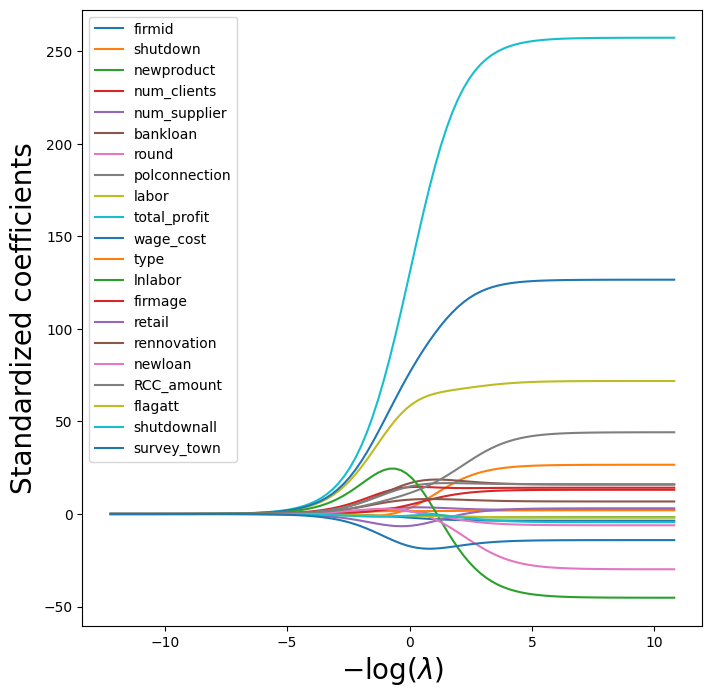

In [ ]:
path_fig, ax = subplots(figsize=(8,8))
soln_path.plot(ax=ax, legend=False)
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)
ax.legend(loc='upper left');

In [ ]:
path_fig.savefig('ridge_plot.png', bbox_inches='tight')

In [ ]:
beta_hat = soln_path.loc[soln_path.index[39]]
lambdas[39], beta_hat

(23.134587076897162,
 firmid           -0.182107
 shutdown         -0.526137
 newproduct        0.873858
 num_clients       3.093139
 num_supplier      0.661356
 bankloan          2.365858
 round             0.741792
 polconnection     2.409640
 labor            10.044903
 total_profit     13.316278
 wage_cost        11.019170
 type              0.521937
 lnlabor           6.881277
 firmage           0.304562
 retail           -1.480539
 rennovation       1.578075
 newloan           0.991465
 RCC_amount        1.662409
 flagatt          -0.274479
 shutdownall      -0.583311
 survey_town      -2.537642
 Name: -3.141328773783735, dtype: float64)

In [ ]:
np.linalg.norm(beta_hat)

22.038129259173374

In [ ]:
beta_hat = soln_path.loc[soln_path.index[59]]
lambdas[59], np.linalg.norm(beta_hat)

(0.22083084389761015, 247.10605048797467)

In [ ]:
ridge = skl.ElasticNet(alpha=lambdas[59], l1_ratio=0)
scaler = StandardScaler(with_mean=True,  with_std=True)
pipe = Pipeline(steps=[('scaler', scaler), ('ridge', ridge)])
pipe.fit(X, Y)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.397e+08, tolerance: 2.127e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', ElasticNet(alpha=0.22083084389761015, l1_ratio=0))])

In [ ]:
np.linalg.norm(ridge.coef_)

247.10605048797478

In [ ]:
validation = skm.ShuffleSplit(n_splits=1,
                              test_size=0.5,
                              random_state=0)
ridge.alpha = 0.01
results = skm.cross_validate(ridge,
                             X,
                             Y,
                             scoring='neg_mean_squared_error',
                             cv=validation)
-results['test_score']


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.230e+08, tolerance: 1.022e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


array([116548.26829111])

In [ ]:
ridge.alpha = 1e10
results = skm.cross_validate(ridge,
                             X,
                             Y,
                             scoring='neg_mean_squared_error',
                             cv=validation)
-results['test_score']


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.110e+08, tolerance: 1.022e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


array([256643.25194353])

In [ ]:
param_grid = {'ridge__alpha': lambdas}
grid = skm.GridSearchCV(pipe,
                        param_grid,
                        cv=validation,
                        scoring='neg_mean_squared_error')
grid.fit(X, Y)
grid.best_params_['ridge__alpha']
grid.best_estimator_


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.110e+08, tolerance: 1.022e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.110e+08, tolerance: 1.022e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', ElasticNet(alpha=0.04334999233537056, l1_ratio=0))])

In [ ]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

In [ ]:
grid = skm.GridSearchCV(pipe,
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
grid.fit(X, Y)
grid.best_params_['ridge__alpha']
grid.best_estimator_


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.758e+08, tolerance: 1.752e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.435e+08, tolerance: 1.687e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', ElasticNet(alpha=0.0547014862092466, l1_ratio=0))])

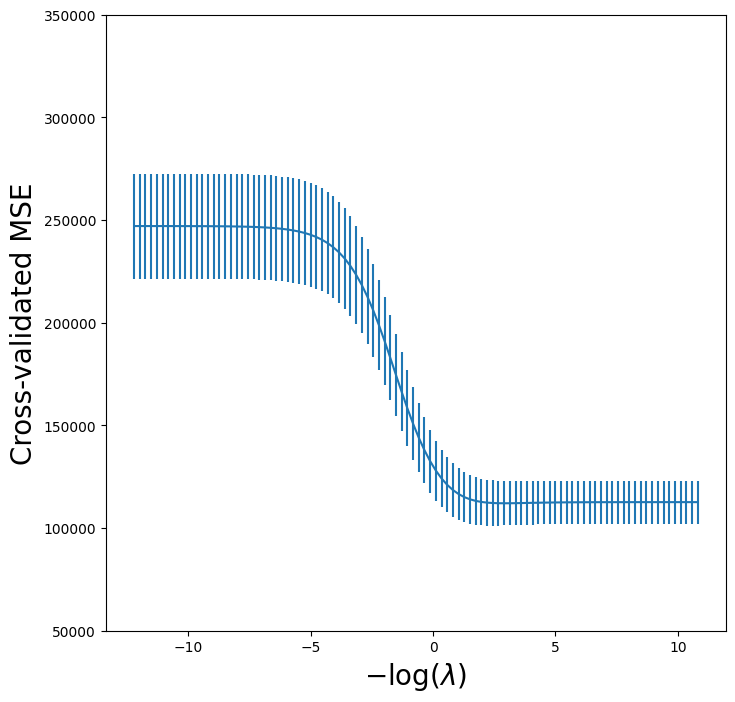

In [ ]:
ridge_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            -grid.cv_results_['mean_test_score'],
            yerr=grid.cv_results_['std_test_score'] / np.sqrt(K))
ax.set_ylim([50000,350000])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);


In [ ]:
grid_r2 = skm.GridSearchCV(pipe,
                           param_grid,
                           cv=kfold)
grid_r2.fit(X, Y)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.758e+08, tolerance: 1.752e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.435e+08, tolerance: 1.687e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('ridge',
                                        ElasticNet(alpha=10000000000.0,
                                                   l1_ratio=0))]),
             param_grid={'ridge__alpha': array([2.01212840e+05, 1.59457735e+05, 1.26367528e+05, 1.00144105e+05,
       7.93624904e+04, 6.28934164e+04, 4.98419569e+04, 3.94988985e+04,
       3.13022016e+04, 2.48064594...
       4.23533742e-03, 3.35643247e-03, 2.65991533e-03, 2.10793741e-03,
       1.67050435e-03, 1.32384613e-03, 1.04912542e-03, 8.31413951e-04,
       6.58881338e-04, 5.22152192e-04, 4.13796683e-04, 3.27926795e-04,
       2.59876377e-04, 2.05947584e-04, 1.63209938e-04, 1.29341085e-04,
       1.02500598e-04, 8.12299709e-05, 6.43733628e-05, 5.10147891e-05,
       4.04283479e-05, 3.20387744e-05, 2.53901808e-05, 2.01212840e-05])})

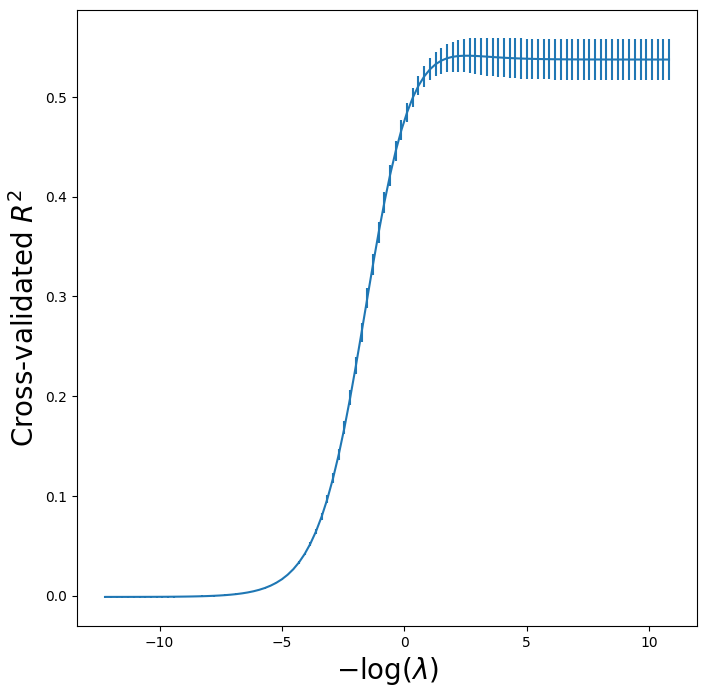

In [ ]:
r2_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            grid_r2.cv_results_['mean_test_score'],
            yerr=grid_r2.cv_results_['std_test_score'] / np.sqrt(K))
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated $R^2$', fontsize=20);


In [ ]:
ridgeCV = skl.ElasticNetCV(alphas=lambdas,
                           l1_ratio=0,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('ridge', ridgeCV)])
pipeCV.fit(X, Y)


In [ ]:
tuned_ridge = pipeCV.named_steps['ridge']
ridgeCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            tuned_ridge.mse_path_.mean(1),
            yerr=tuned_ridge.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_ridge.alpha_), c='k', ls='--')
ax.set_ylim([50000,275000])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);


In [ ]:
ridgeCV_fig.savefig('RidgeCV_plot.png', bbox_inches='tight')

In [ ]:
np.min(tuned_ridge.mse_path_.mean(1))


In [ ]:
tuned_ridge.coef_


##Lasso

In [ ]:
lassoCV = skl.ElasticNetCV(n_alphas=100,
                           l1_ratio=1,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('lasso', lassoCV)])
pipeCV.fit(X, Y)
tuned_lasso = pipeCV.named_steps['lasso']
tuned_lasso.alpha_


NameError: name 'kfold' is not defined

In [ ]:
lambdas, soln_array = skl.Lasso.path(Xs,
                                    Y,
                                    l1_ratio=1,
                                    n_alphas=100)[:2]
soln_path = pd.DataFrame(soln_array.T,
                         columns=D.columns,
                         index=-np.log(lambdas))


In [ ]:
path_fig, ax = subplots(figsize=(8,8))
soln_path.plot(ax=ax, legend=False)
ax.legend(loc='upper left')
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficiients', fontsize=20);


In [ ]:
np.min(tuned_lasso.mse_path_.mean(1))


In [ ]:
lassoCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(tuned_lasso.alphas_),
            tuned_lasso.mse_path_.mean(1),
            yerr=tuned_lasso.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_lasso.alpha_), c='k', ls='--')
ax.set_ylim([50000,275000])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);

In [ ]:
lassoCV_fig.savefig('lassoCV_plot.png', bbox_inches='tight')

In [ ]:
tuned_lasso.coef_


## Regression Trees

In [ ]:
model = MS(df_cleaned2.columns.drop('part5revenue'), intercept=False)
D = model.fit_transform(df_cleaned2)
feature_names = list(D.columns)
X = np.asarray(D) #array of all X's, keep all feature names


In [ ]:
(X_train,
 X_test,
 y_train,
 y_test) = skm.train_test_split(X,
                                df_cleaned2['part5revenue'],
                                test_size=0.3,
                                random_state=0)


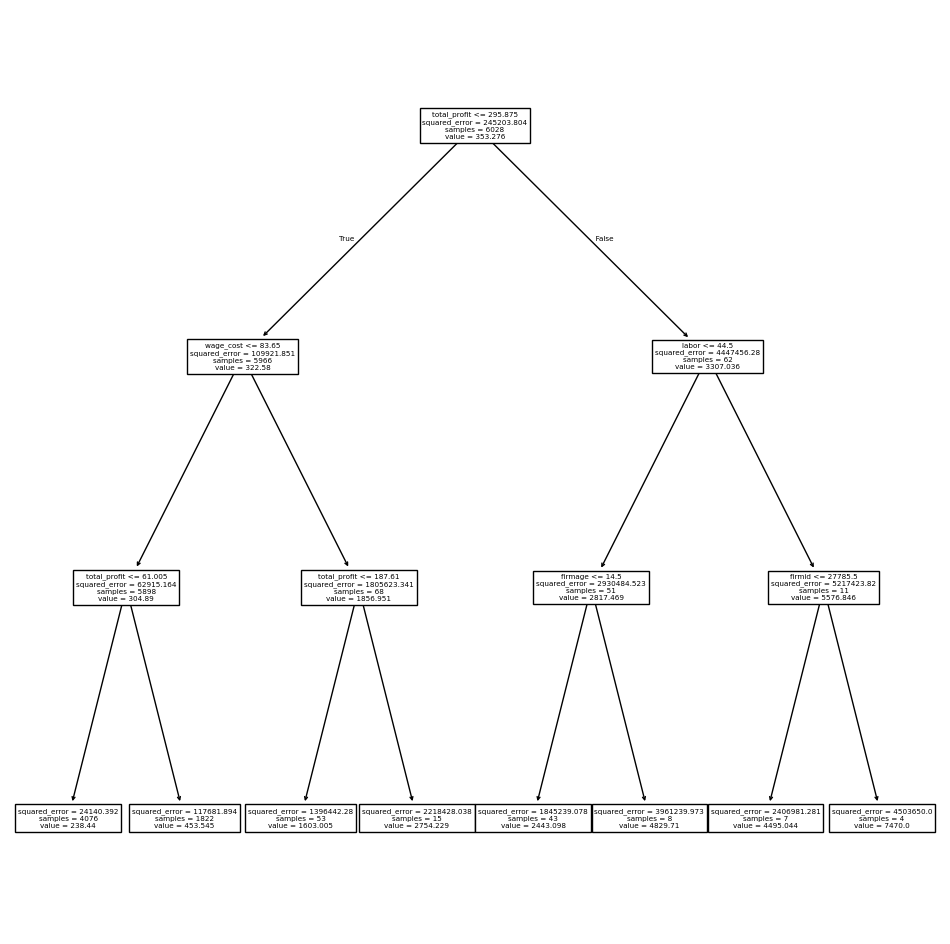

In [ ]:
reg = DTR(max_depth=3)
reg.fit(X_train, y_train)
ax = subplots(figsize=(12,12))[1]
plot_tree(reg,
          feature_names=feature_names,
          ax=ax);


Cross Validation & Pruning

In [ ]:
ccp_path = reg.cost_complexity_pruning_path(X_train, y_train)
kfold = skm.KFold(5,
                  shuffle=True,
                  random_state=10)
grid = skm.GridSearchCV(reg,
                        {'ccp_alpha': ccp_path.ccp_alphas},
                        refit=True,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
G = grid.fit(X_train, y_train)


In [ ]:
best_ = grid.best_estimator_
RTreeMSE= np.mean((y_test - best_.predict(X_test))**2)
RTreeMSE


128609.32346806521

In [ ]:
(np.mean((y_test - best_.predict(X_test))**2))**0.5

358.6214208159702

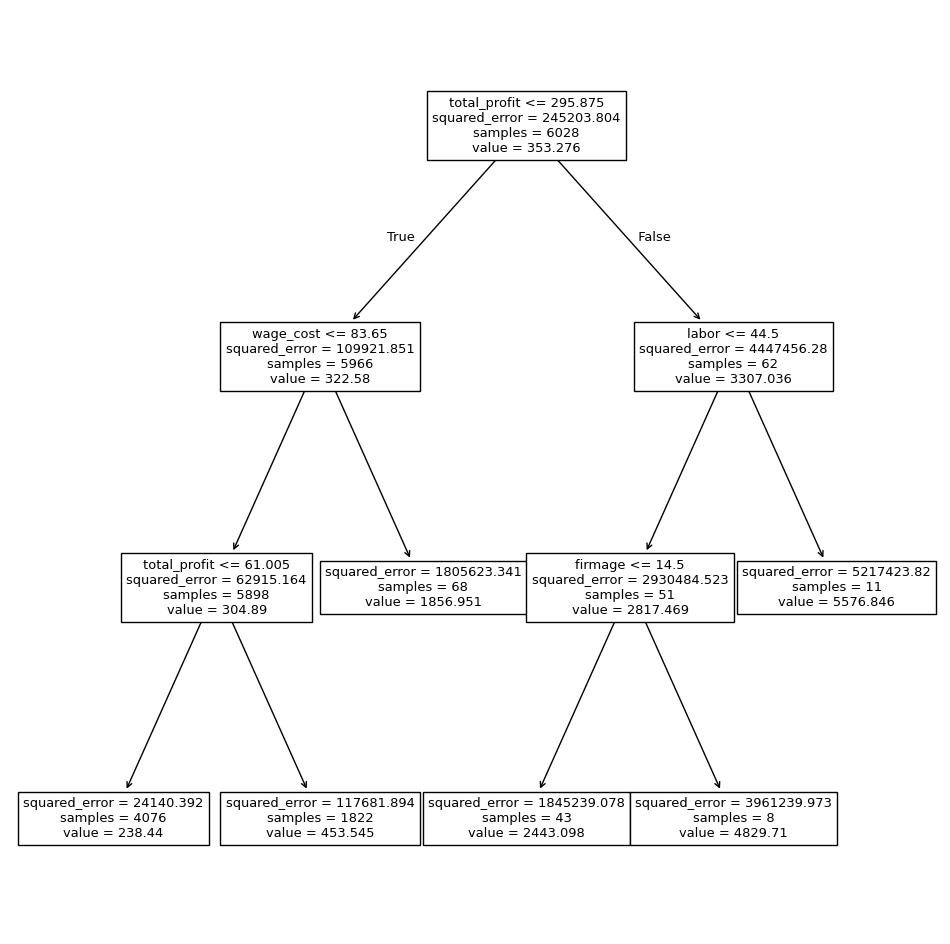

In [ ]:
ax = subplots(figsize=(12,12))[1]
plot_tree(G.best_estimator_,
          feature_names=feature_names,
          ax=ax);


In [ ]:
fig = ax.get_figure()
fig.savefig('tree_plot.png', format='png', dpi=300)

##Bagging + RF's

In [ ]:
bag_ch = RF(max_features=X_train.shape[1], random_state=0)
bag_ch.fit(X_train, y_train)
#using all features and X's; RF uses subset

RandomForestRegressor(max_features=21, random_state=0)

87388.69887350652

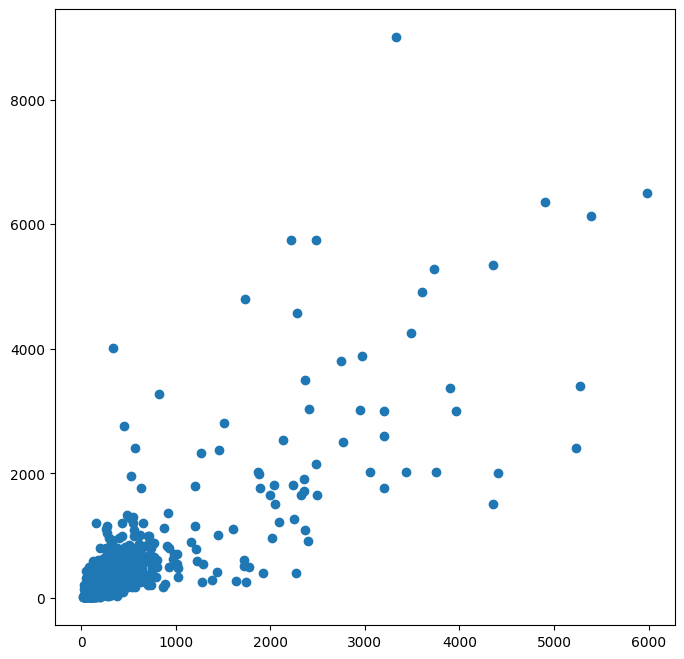

In [ ]:
ax = subplots(figsize=(8,8))[1]
y_hat_bag = bag_ch.predict(X_test)
ax.scatter(y_hat_bag, y_test)
np.mean((y_test - y_hat_bag)**2)


In [ ]:
bag_ch = RF(max_features=X_train.shape[1],
                n_estimators=500, #default is 100
                random_state=0).fit(X_train, y_train)
y_hat_bag = bag_ch.predict(X_test)
np.mean((y_test - y_hat_bag)**2)

87332.51500117862

In [ ]:
RF_ch = RF(max_features=6, #random forest as only choose 6 - subset
               random_state=0).fit(X_train, y_train)
y_hat_RF = RF_ch.predict(X_test)
np.mean((y_test - y_hat_RF)**2)


78286.62513985792

In [ ]:
feature_imp = pd.DataFrame(
    {'importance':RF_ch.feature_importances_}, #include in rep
    index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

,importance
total_profit,0.315622
wage_cost,0.162220
lnlabor,0.126378
labor,0.106248
num_clients,0.047275
firmage,0.039560
firmid,0.038520
survey_town,0.036449
RCC_amount,0.032333
num_supplier,0.027330


In [ ]:
feature_imp.sort_values(by='importance', ascending=False).to_latex(caption='Feature Importances of Random Forest', label='tab:feature_importances', float_format="%.6f")


'\\begin{table}\n\\caption{Feature Importances of Random Forest}\n\\label{tab:feature_importances}\n\\begin{tabular}{lr}\n\\toprule\n & importance \\\\\n\\midrule\ntotal_profit & 0.315622 \\\\\nwage_cost & 0.162220 \\\\\nlnlabor & 0.126378 \\\\\nlabor & 0.106248 \\\\\nnum_clients & 0.047275 \\\\\nfirmage & 0.039560 \\\\\nfirmid & 0.038520 \\\\\nsurvey_town & 0.036449 \\\\\nRCC_amount & 0.032333 \\\\\nnum_supplier & 0.027330 \\\\\nround & 0.013633 \\\\\npolconnection & 0.009560 \\\\\nretail & 0.008824 \\\\\ntype & 0.007768 \\\\\nrennovation & 0.006946 \\\\\nbankloan & 0.006918 \\\\\nnewproduct & 0.004805 \\\\\nnewloan & 0.004761 \\\\\nshutdownall & 0.003358 \\\\\nflagatt & 0.000783 \\\\\nshutdown & 0.000711 \\\\\n\\bottomrule\n\\end{tabular}\n\\end{table}\n'

## Boosting

In [ ]:
boost_china = GBR(n_estimators=5000, #use GBE, specifying learning rate that minimizes error, error is MSE
                   learning_rate=0.001,
                   max_depth=3,
                   random_state=0)
boost_china.fit(X_train, y_train)


GradientBoostingRegressor(learning_rate=0.001, n_estimators=5000,
                          random_state=0)

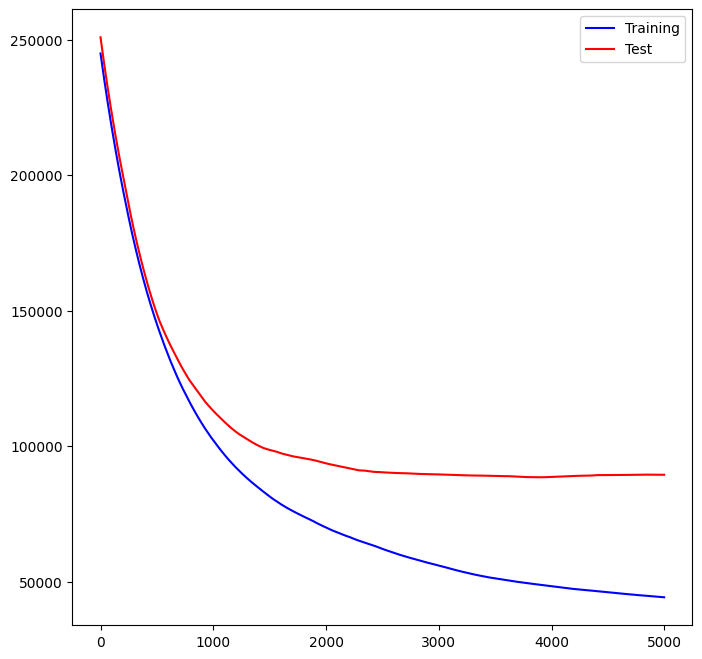

In [ ]:
test_error = np.zeros_like(boost_china.train_score_)
for idx, y_ in enumerate(boost_china.staged_predict(X_test)):
   test_error[idx] = np.mean((y_test - y_)**2)

plot_idx = np.arange(boost_china.train_score_.shape[0])
ax = subplots(figsize=(8,8))[1]
ax.plot(plot_idx,
        boost_china.train_score_,
        'b',
        label='Training')
ax.plot(plot_idx,
        test_error,
        'r',
        label='Test')
ax.legend();


In [ ]:
y_hat_boost = boost_china.predict(X_test);
np.mean((y_test - y_hat_boost)**2)


89443.06468810109

In [ ]:
boost_china = GBR(n_estimators=5000,
                   learning_rate=0.2,
                   max_depth=3,
                   random_state=0)
boost_china.fit(X_train,
                 y_train)
y_hat_boost = boost_china.predict(X_test);
np.mean((y_test - y_hat_boost)**2)


81934.85992440957

In [ ]:
!pip install -q xgboost

In [ ]:
import xgboost as xgb
from sklearn.model_selection import cross_val_predict

# Convert the data into XGBoost's DMatrix format
dtrain = xgb.DMatrix(X, label=y)

# Define the parameters for the XGBoost model
params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'eta': 0.1,
    'max_depth': 5,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'seed': 42
}

# Train the XGBoost model with the optimal number of boosting rounds
model = xgb.train(params, dtrain, num_boost_round= 10)

# Make predictions
y_pred = model.predict(dtrain)

# Calculate and print the Mean Squared Error (MSE)
mse = mean_squared_error(y, y_pred)
print("Mean Squared Error:", mse)


plt.figure(figsize=(8, 6))
plt.scatter(y, y_pred, c='grey', alpha=0.3)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.xlabel('True Y')
plt.ylabel('Predicted Y')
plt.title('Y vs Predicted Y (Y hat)')
plt.show()

##DAG

In [27]:
df_fe = df.reset_index()
df_fe['loanuse'] = 0
df_fe.loc[(df_fe['type'] == 1) & (df_fe['newloan'] == 1) & (df_fe['round'] > 1), 'loanuse'] = 1
df_fe.loc[(df_fe['type'] == 0) & (df_fe['newloan'] == 1) & (df_fe['survey_town_type'] != 0) & (df_fe['round'] > 2), 'loanuse'] = 1


In [28]:

df_fe['loanusesum'] = df_fe.groupby(['survey_town', 'industry', 'round'])['loanuse'].transform('sum')


df_fe['indsize'] = df_fe.groupby(['survey_town', 'industry', 'round'])['firmid'].transform('count')


df_fe['comploanuse'] = (df_fe['loanusesum'] - df_fe['loanuse']) / (df_fe['indsize'] - 1)

df_fe.loc[df_fe['indsize'] == 1, 'comploanuse'] = 0

df_fe['comploanuse'].fillna(0, inplace=True)

# check the created comploanuse variable
print(df_fe[['firmid', 'loanuse', 'loanusesum', 'comploanuse']].head())

   firmid  loanuse  loanusesum  comploanuse
0   111.0        0         0.0     0.000000
1   111.0        0         7.0     0.200000
2   111.0        0        10.0     0.285714
3   112.0        0         0.0     0.000000
4   112.0        0         1.0     0.200000


A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




In [30]:

!pip install dowhy -q

ERROR: Could not find a version that satisfies the requirement 3.0.10 (from versions: none)
ERROR: No matching distribution found for 3.0.10


In [31]:
from dowhy import CausalModel

In [ ]:
df_fe.head()

,firmid,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,...,marketshare2,herf,invherf,interpost,inter4post,interpost_comp1,interpost_comp2,loanuse,loanusesum,comploanuse
0,111.0,0.0,0.0,1.0,38.0,0.0,34.0,15.0,0.0,1.0,...,0.000384,0.015637,63.951118,0.0,0.000000,0.000000,0.0,0,0.0,0.000000
1,111.0,0.0,0.0,0.0,39.0,0.0,50.0,12.0,0.0,2.0,...,0.000533,0.016157,61.892632,1.0,0.771429,0.771429,0.0,0,7.0,0.200000
2,111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,...,0.000005,0.018490,54.083206,1.0,0.771429,0.771429,0.0,0,10.0,0.285714
3,112.0,0.0,0.0,0.0,22.0,0.0,12.0,3.0,1.0,1.0,...,0.000470,0.160916,6.214418,0.0,0.000000,0.000000,0.0,0,0.0,0.000000
4,112.0,0.0,1.0,0.0,24.0,0.0,12.0,2.0,0.0,2.0,...,0.000473,0.181971,5.495395,1.0,0.800000,0.800000,0.0,0,1.0,0.200000


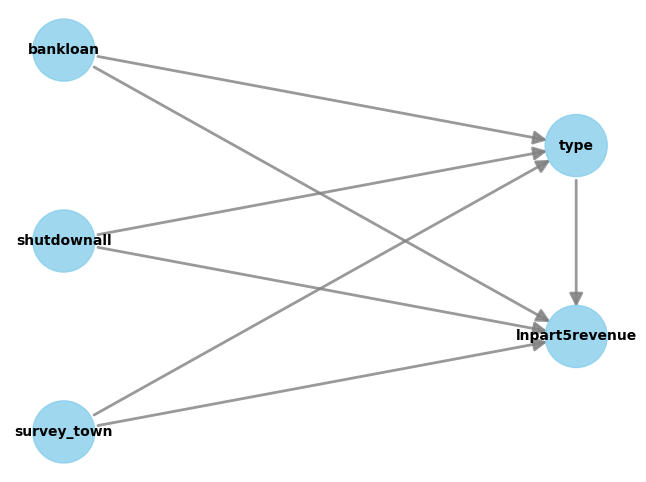

In [ ]:
model = CausalModel(data = df_fe, treatment='type', outcome='lnpart5revenue', common_causes = ['bankloan', 'shutdownall', 'survey_town'], instruments = None, effect_modifiers = None)
model.view_model()

In [29]:
import networkx as nx
import matplotlib.pyplot as plt

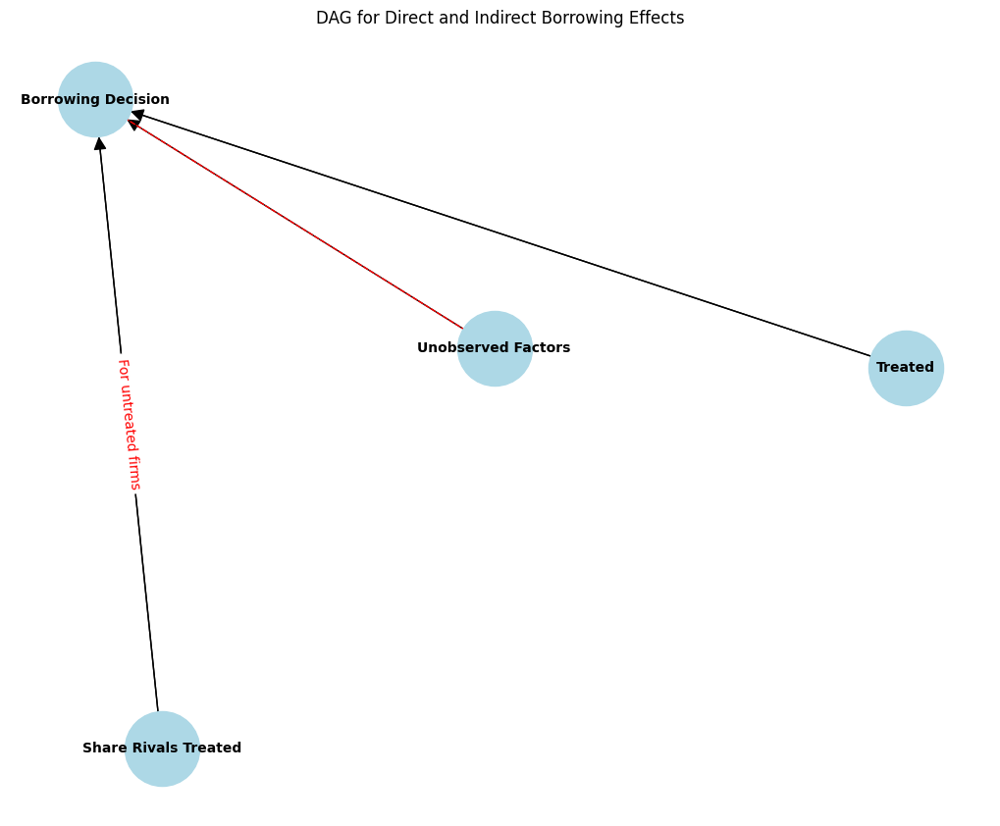

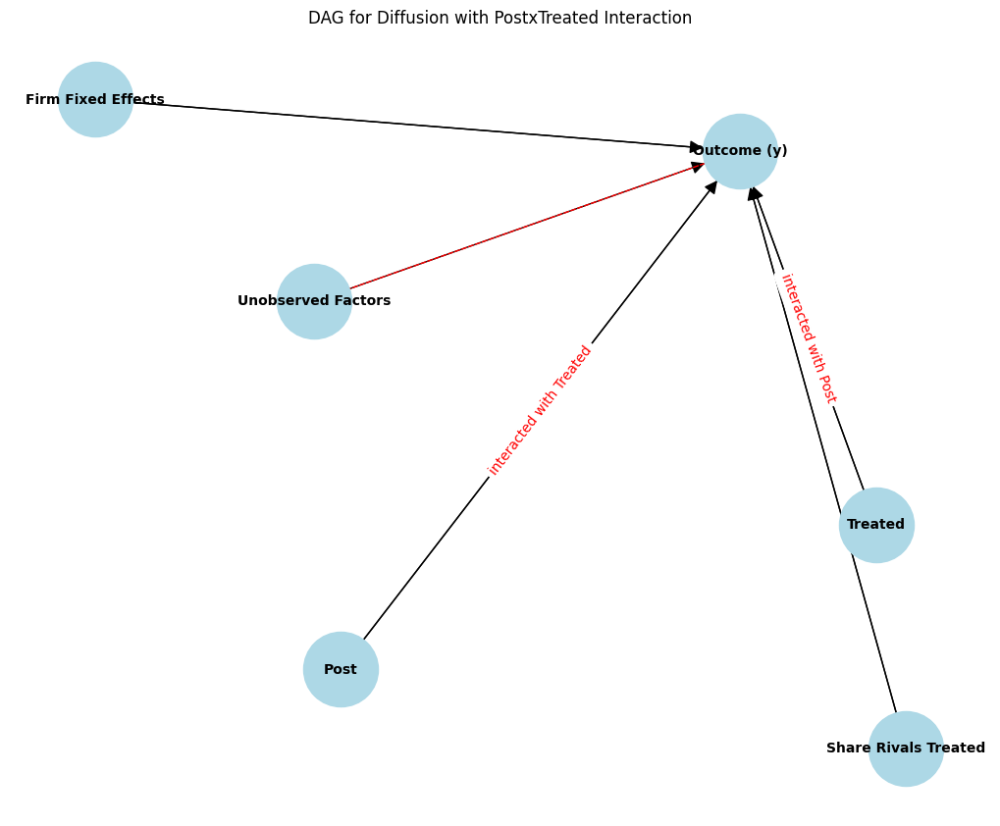

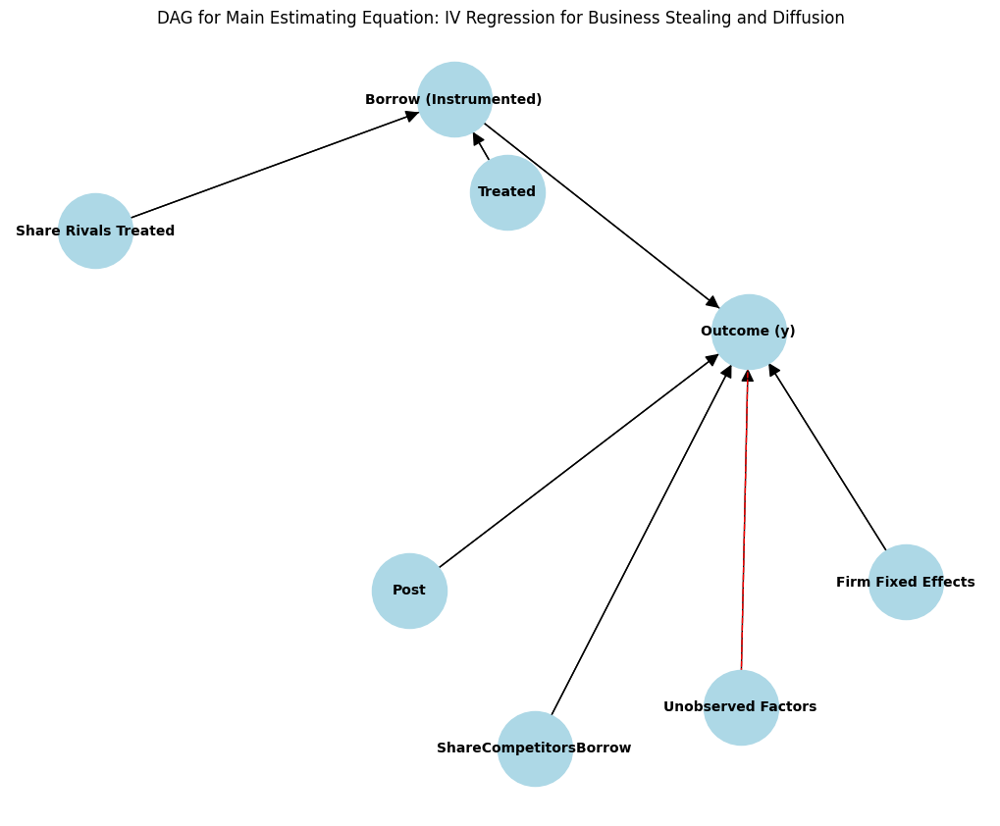

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Function to create a DAG for a given set of nodes and edges
def create_dag(nodes, edges, title, filename):
    G = nx.DiGraph()
    G.add_nodes_from(nodes)

    # Add edges to the graph
    for edge in edges:
        u, v, label, is_dashed = edge
        if label:
            G.add_edge(u, v, label=label, style='dashed' if is_dashed else 'solid')
        else:
            G.add_edge(u, v, style='dashed' if is_dashed else 'solid')

    # Draw the graph
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=3000, font_size=10, font_weight='bold', arrowsize=20)


    dashed_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'dashed']
    nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, style='dashed', edge_color='red')


    solid_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'solid']
    nx.draw_networkx_edges(G, pos, edgelist=solid_edges, style='solid', edge_color='black')


    edge_labels = {(u, v): G[u][v].get('label', '') for u, v in G.edges if G[u][v].get('label', '')}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')

    plt.title(title)

    # Save the plot as a PNG file
    plt.savefig(f"{filename}.png", format='png')
    plt.show()

# DAG for Equation (7)
nodes_eq7 = ['Treated', 'Share Rivals Treated', 'Borrowing Decision', 'Unobserved Factors']
edges_eq7 = [('Treated', 'Borrowing Decision', None, False),
             ('Share Rivals Treated', 'Borrowing Decision', 'For untreated firms', False),
             ('Unobserved Factors', 'Borrowing Decision', None, True)]  # Dashed arrow for unobserved factors
create_dag(nodes_eq7, edges_eq7, 'DAG for Direct and Indirect Borrowing Effects', 'dag_equation_7')

# DAG for Equation (8)
nodes_eq8 = ['Treated', 'Post', 'Share Rivals Treated', 'Firm Fixed Effects', 'Outcome (y)', 'Unobserved Factors']
edges_eq8 = [('Treated', 'Outcome (y)', 'interacted with Post', False),
             ('Post', 'Outcome (y)', 'interacted with Treated', False),
             ('Share Rivals Treated', 'Outcome (y)', None, False),
             ('Firm Fixed Effects', 'Outcome (y)', None, False),
             ('Unobserved Factors', 'Outcome (y)', None, True)]  # Dashed arrow for unobserved factors
create_dag(nodes_eq8, edges_eq8, 'DAG for Diffusion with PostxTreated Interaction', 'dag_equation_8')

# DAG for Equation (9)
nodes_eq9 = ['Share Rivals Treated', 'Treated', 'Borrow (Instrumented)', 'ShareCompetitorsBorrow', 'Post', 'Firm Fixed Effects', 'Outcome (y)', 'Unobserved Factors']
edges_eq9 = [('Share Rivals Treated', 'Borrow (Instrumented)', None, False),
             ('Treated', 'Borrow (Instrumented)', None, False),
             ('Borrow (Instrumented)', 'Outcome (y)', None, False),
             ('ShareCompetitorsBorrow', 'Outcome (y)', None, False),
             ('Post', 'Outcome (y)', None, False),
             ('Firm Fixed Effects', 'Outcome (y)', None, False),
             ('Unobserved Factors', 'Outcome (y)', None, True)]  # Dashed arrow for unobserved factors
create_dag(nodes_eq9, edges_eq9, 'DAG for Main Estimating Equation: IV Regression for Business Stealing and Diffusion', 'dag_equation_9')


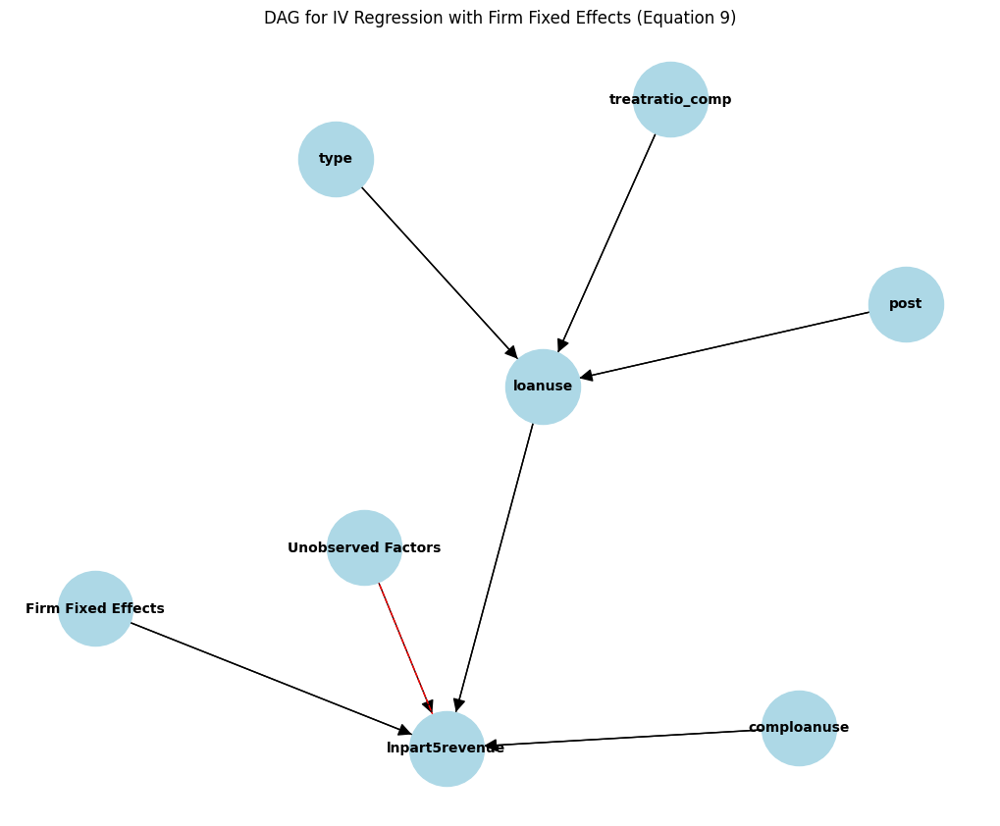

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Function to create and save a DAG in .dot format
def create_dag(nodes, edges, title, filename):
    G = nx.DiGraph()
    G.add_nodes_from(nodes)

    # Add edges to the graph
    for edge in edges:
        u, v, label, is_dashed = edge
        if label:
            G.add_edge(u, v, label=label, style='dashed' if is_dashed else 'solid')
        else:
            G.add_edge(u, v, style='dashed' if is_dashed else 'solid')

    # Draw the graph
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=3000, font_size=10, font_weight='bold', arrowsize=20)

    # Draw dashed edges separately
    dashed_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'dashed']
    nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, style='dashed', edge_color='red')

    # Draw solid edges separately
    solid_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'solid']
    nx.draw_networkx_edges(G, pos, edgelist=solid_edges, style='solid', edge_color='black')

    # Draw edge labels if they exist
    edge_labels = {(u, v): G[u][v].get('label', '') for u, v in G.edges if G[u][v].get('label', '')}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')

    plt.title(title)

    # Save the plot as a PNG file for visualization
    plt.savefig(f"{filename}.png", format='png')
    plt.show()

    # Save the DAG as a .dot file for causal inference
    nx.drawing.nx_pydot.write_dot(G, f"{filename}.dot")

# DAG for Equation (9) with correct variable names and Firm Fixed Effects
nodes_eq9 = ['type', 'post', 'treatratio_comp', 'loanuse', 'comploanuse', 'lnpart5revenue', 'Firm Fixed Effects', 'Unobserved Factors']
edges_eq9 = [
    ('type', 'loanuse', None, False),
    ('post', 'loanuse', None, False),
    ('treatratio_comp', 'loanuse', None, False),
    ('loanuse', 'lnpart5revenue', None, False),
    ('comploanuse', 'lnpart5revenue', None, False),
    ('Firm Fixed Effects', 'lnpart5revenue', None, False),  # Include Firm Fixed Effects
    ('Unobserved Factors', 'lnpart5revenue', None, True)  # Dashed arrow for unobserved factors
]

create_dag(nodes_eq9, edges_eq9, 'DAG for IV Regression with Firm Fixed Effects (Equation 9)', 'dag_equation_9_with_firm_fe')


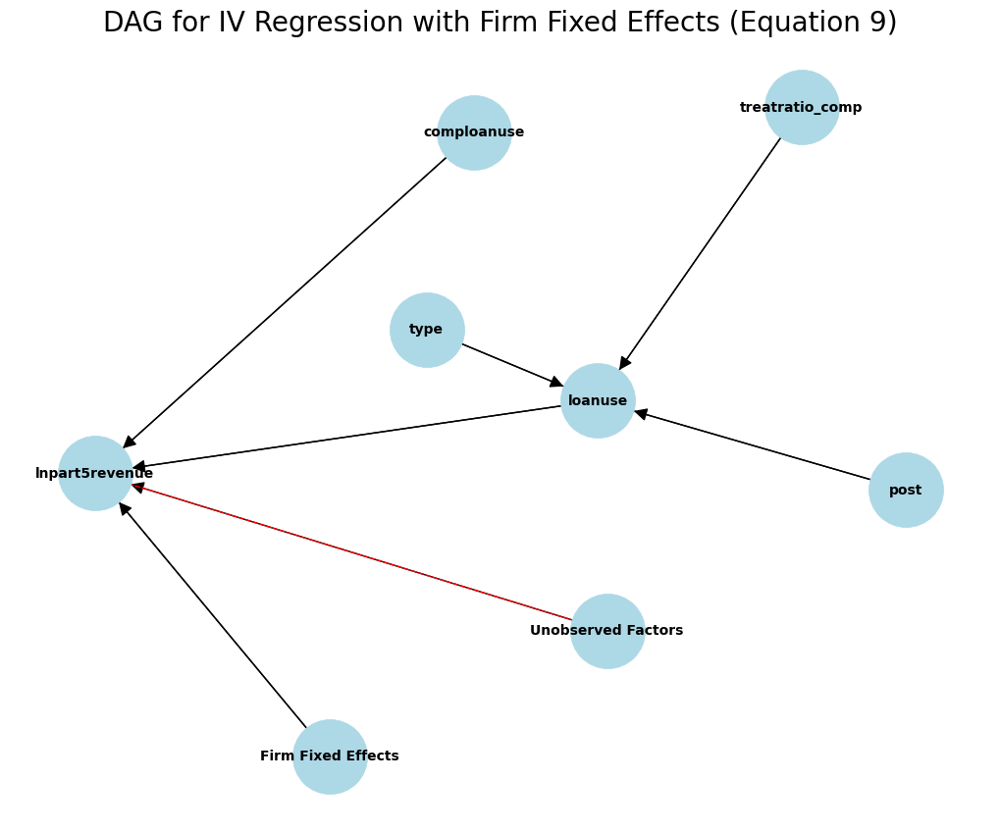

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Function to create and save a DAG in .dot format
def create_dag(nodes, edges, title, filename):
    G = nx.DiGraph()
    G.add_nodes_from(nodes)

    # Add edges to the graph
    for edge in edges:
        u, v, label, is_dashed = edge
        if label:
            G.add_edge(u, v, label=label, style='dashed' if is_dashed else 'solid')
        else:
            G.add_edge(u, v, style='dashed' if is_dashed else 'solid')

    # Draw the graph
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=3000, font_size=10, font_weight='bold', arrowsize=20)

    # Draw dashed edges separately
    dashed_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'dashed']
    nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, style='dashed', edge_color='red')

    # Draw solid edges separately
    solid_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'solid']
    nx.draw_networkx_edges(G, pos, edgelist=solid_edges, style='solid', edge_color='black')

    # Draw edge labels if they exist
    edge_labels = {(u, v): G[u][v].get('label', '') for u, v in G.edges if G[u][v].get('label', '')}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')

    plt.title(title)

    # Save the plot as a PNG file for visualization
    plt.savefig(f"{filename}.png", format='png')
    plt.show()

    # Save the DAG as a .dot file for causal inference
    nx.drawing.nx_pydot.write_dot(G, f"{filename}.dot")

# DAG for Equation (9) with correct variable names and Firm Fixed Effects
nodes_eq9 = ['type', 'post', 'treatratio_comp', 'loanuse', 'comploanuse', 'lnpart5revenue', 'Firm Fixed Effects', 'Unobserved Factors']
edges_eq9 = [
    ('type', 'loanuse', None, False),
    ('post', 'loanuse', None, False),
    ('treatratio_comp', 'loanuse', None, False),
    ('loanuse', 'lnpart5revenue', None, False),
    ('comploanuse', 'lnpart5revenue', None, False),
    ('Firm Fixed Effects', 'lnpart5revenue', None, False),  # Include Firm Fixed Effects
    ('Unobserved Factors', 'lnpart5revenue', None, True)  # Dashed arrow for unobserved factors
]

create_dag(nodes_eq9, edges_eq9, 'DAG for IV Regression with Firm Fixed Effects (Equation 9)', 'dag_equation_9_with_firm_fe')


In [ ]:
model = CausalModel(
    data=df_fe,  # Use your cleaned dataset
    treatment='loanuse',  # Treatment variable (taking a loan)
    outcome='lnpart5revenue',  # Outcome variable (log revenue)
    graph='dag_equation_9_with_firm_fe.dot'  # The updated DAG file
)

# Step 2: Identify the Estimand(s)
estimand = model.identify_effect()

# Step 3: Obtain Estimates
estimate = model.estimate_effect(
    identified_estimand=estimand,
    method_name='iv.instrumental_variable',
    control_value=0,
    treatment_value=1
)

ERROR:dowhy.causal_graph:Pygraphviz cannot be loaded. No module named 'pygraphviz'
Trying pydot...


In [ ]:
refute = model.refute_estimate(
    estimand=estimand,
    estimate=estimate,
    method_name='random_common_cause'
)

In [ ]:
print(estimand)
print(estimate)
print(refute)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
    d                        
──────────(E[lnpart5revenue])
d[loanuse]                   
Estimand assumption 1, Unconfoundedness: If U→{loanuse} and U→lnpart5revenue then P(lnpart5revenue|loanuse,,U) = P(lnpart5revenue|loanuse,)

### Estimand : 2
Estimand name: iv
Estimand expression:
 ⎡                                                                                          -1⎤
 ⎢              d                                ⎛              d                          ⎞  ⎥
E⎢──────────────────────────────(lnpart5revenue)⋅⎜──────────────────────────────([loanuse])⎟  ⎥
 ⎣d[post  treatratio_comp  type]                 ⎝d[post  treatratio_comp  type]           ⎠  ⎦
Estimand assumption 1, As-if-random: If U→→lnpart5revenue then ¬(U →→{post,treatratio_comp,type})
Estimand assumption 2, Exclusion: If we remove {post,treatratio_comp,type}→{loanuse}, then ¬({post,treatratio_comp,type}→l

##IV

In [32]:

df_fe['baseline'] = 0
df_fe['baseline'] = df_fe['baseline'].mask(df_fe['round'] == 1, 1)  # Sets midline to 1 if round is 2

df_fe['midline'] = 0
df_fe['midline'] = df_fe['midline'].mask(df_fe['round'] == 2, 1)  # Sets midline to 1 if round is 2

df_fe['endline'] = 0
df_fe['endline'] = df_fe['endline'].mask(df_fe['round'] == 3, 1)  # Sets endline to 1 if round is 3__fe

In [ ]:
df_fe.head()

,firmid,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,...,interpost,inter4post,interpost_comp1,interpost_comp2,loanuse,loanusesum,comploanuse,baseline,midline,endline
0,111.0,0.0,0.0,1.0,38.0,0.0,34.0,15.0,0.0,1.0,...,0.0,0.000000,0.000000,0.0,0,0.0,0.000000,1,0,0
1,111.0,0.0,0.0,0.0,39.0,0.0,50.0,12.0,0.0,2.0,...,1.0,0.771429,0.771429,0.0,0,7.0,0.200000,0,1,0
2,111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,...,1.0,0.771429,0.771429,0.0,0,10.0,0.285714,0,0,1
3,112.0,0.0,0.0,0.0,22.0,0.0,12.0,3.0,1.0,1.0,...,0.0,0.000000,0.000000,0.0,0,0.0,0.000000,1,0,0
4,112.0,0.0,1.0,0.0,24.0,0.0,12.0,2.0,0.0,2.0,...,1.0,0.800000,0.800000,0.0,0,1.0,0.200000,0,1,0


In [ ]:
df_fe['retail'].isna().sum()

784

In [ ]:
# First-stage regression for loanuse
X_first_stage_loanuse = df_fe[['interpost', 'inter4post', 'midline', 'endline']]
X_first_stage_loanuse = sm.add_constant(X_first_stage_loanuse)
y_first_stage_loanuse = df_fe['loanuse']
model_first_stage_loanuse = sm.OLS(y_first_stage_loanuse, X_first_stage_loanuse).fit(cov_type='cluster', cov_kwds={'groups': df_fe['survey_town']})

# First-stage regression for comploanuse
X_first_stage_comploanuse = df_fe[['interpost', 'inter4post', 'midline', 'endline']]
X_first_stage_comploanuse = sm.add_constant(X_first_stage_comploanuse)
y_first_stage_comploanuse = df_fe['comploanuse']
model_first_stage_comploanuse = sm.OLS(y_first_stage_comploanuse, X_first_stage_comploanuse).fit(cov_type='cluster', cov_kwds={'groups': df_fe['survey_town']})

# Print the results
print("First-Stage Regression for Loan Use:")
print(model_first_stage_loanuse.summary())
print("\nFirst-Stage Regression for Competitors Loan Use:")
print(model_first_stage_comploanuse.summary())


First-Stage Regression for Loan Use:
                            OLS Regression Results                            
Dep. Variable:                loanuse   R-squared:                       0.242
Model:                            OLS   Adj. R-squared:                  0.242
Method:                 Least Squares   F-statistic:                     31.99
Date:                Sun, 03 Nov 2024   Prob (F-statistic):           1.07e-15
Time:                        21:12:04   Log-Likelihood:                -1231.8
No. Observations:                9519   AIC:                             2474.
Df Residuals:                    9514   BIC:                             2509.
Df Model:                           4                                         
Covariance Type:              cluster                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.3

In [ ]:
import linearmodels.panel as plm
df_fe = df_fe.set_index(['firmid', 'round'])  # Replace 'firm_id' and 'round' with your actual entity and time variables

# First-stage for loanuse
X_first_stage_loanuse = df_fe[['interpost', 'inter4post', 'midline', 'endline']]
y_first_stage_loanuse = df_fe['loanuse']
first_stage_loanuse = plm.PanelOLS(
    y_first_stage_loanuse,
    sm.add_constant(X_first_stage_loanuse),
    entity_effects=True  # Firm fixed effects
).fit(cov_type='clustered', cluster_entity=True)

# First-stage for comploanuse
X_first_stage_comploanuse = df_fe[['interpost', 'inter4post', 'midline', 'endline']]
y_first_stage_comploanuse = df_fe['comploanuse']
first_stage_comploanuse = plm.PanelOLS(
    y_first_stage_comploanuse,
    sm.add_constant(X_first_stage_comploanuse),
    entity_effects=True  # Firm fixed effects
).fit(cov_type='clustered', cluster_entity=True)


In [ ]:
# Demean data by firm_id to account for firm fixed effects
df_fe['total_profit_demeaned'] = df_fe['total_profit'] - df_fe.groupby('firmid')['total_profit'].transform('mean')
df_fe['lnpart5revenue_demeaned'] = df_fe['lnpart5revenue'] - df_fe.groupby('firmid')['lnpart5revenue'].transform('mean')
df_fe['loanuse_demeaned'] = df_fe['loanuse'] - df_fe.groupby('firmid')['loanuse'].transform('mean')
df_fe['comploanuse_demeaned'] = df_fe['comploanuse'] - df_fe.groupby('firmid')['comploanuse'].transform('mean')
df_fe['interpost_demeaned'] = df_fe['interpost'] - df_fe.groupby('firmid')['interpost'].transform('mean')
df_fe['inter4post_demeaned'] = df_fe['inter4post'] - df_fe.groupby('firmid')['inter4post'].transform('mean')
df_fe['midline_demeaned'] = df_fe['midline'] - df_fe.groupby('firmid')['midline'].transform('mean')
df_fe['endline_demeaned'] = df_fe['endline'] - df_fe.groupby('firmid')['endline'].transform('mean')


In [ ]:
# Define variables for IV regression
y = df_fe['total_profit_demeaned']  # Outcome variable
X = sm.add_constant(df_fe[['midline_demeaned', 'endline_demeaned']])  # Exogenous variables
endog = df_fe[['loanuse_demeaned', 'comploanuse_demeaned']]  # Endogenous variables
instr = df_fe[['interpost_demeaned', 'inter4post_demeaned']]  # Instruments


In [ ]:
from linearmodels.iv import IV2SLS

iv_model = IV2SLS(dependent=y, exog=X, endog=endog, instruments=instr).fit()

# Print results
print(iv_model.summary)


                            IV-2SLS Estimation Summary                           
Dep. Variable:     total_profit_demeaned   R-squared:                     -0.0123
Estimator:                       IV-2SLS   Adj. R-squared:                -0.0128
No. Observations:                   8612   F-statistic:                    35.879
Date:                   Mon, Dec 02 2024   P-value (F-stat)                0.0000
Time:                           00:17:38   Distribution:                  chi2(4)
Cov. Estimator:                   robust                                         
                                                                                 
                                  Parameter Estimates                                   
                      Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
----------------------------------------------------------------------------------------
const                    0.0966     0.4891     0.1975     0.8434     -0.8621 


Inputs contain missing values. Dropping rows with missing observations.


In [ ]:
# Extract F-statistics for interpost and inter4post
f_stat_loanuse = model_first_stage_loanuse.fvalue
f_stat_comploanuse = model_first_stage_comploanuse.fvalue

print(f"F-statistic for loanuse: {f_stat_loanuse}")
print(f"F-statistic for comploanuse: {f_stat_comploanuse}")


F-statistic for loanuse: 31.989088417415903
F-statistic for comploanuse: 32.66159362332833


In [ ]:
from linearmodels.iv import IV2SLS
outcome_variables = ['lnpart5revenue', 'total_profit', 'lnlabor']

# Iterate over each outcome variable and perform the IV regression
for outcome_var in outcome_variables:
# Define dependent, exogenous, endogenous, and instrumental variables
  y_second_stage = df_fe[outcome_var]  # Dependent variable
  X_exog = df_fe[['midline', 'endline']]    # Exogenous variables for second stage
  Z_instruments = df_fe[['interpost', 'inter4post']]  # Instruments for endogenous variables
  endog = df_fe[['loanuse', 'comploanuse']]  # Endogenous variables

# Add a constant to the exogenous variables
  X_exog = sm.add_constant(X_exog)

# Perform IV regression
  iv_model = IV2SLS(dependent=y_second_stage, exog=X_exog, endog=endog, instruments=Z_instruments).fit()

# Print the results
  print("Second-Stage IV Regression Results for lnpart5revenue:")
  print(iv_model.summary)


/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(
/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


Second-Stage IV Regression Results for lnpart5revenue:
                          IV-2SLS Estimation Summary                          
Dep. Variable:         lnpart5revenue   R-squared:                     -0.0068
Estimator:                    IV-2SLS   Adj. R-squared:                -0.0073
No. Observations:                8612   F-statistic:                    17.801
Date:                Sun, Oct 20 2024   P-value (F-stat)                0.0013
Time:                        23:23:39   Distribution:                  chi2(4)
Cov. Estimator:                robust                                         
                                                                              
                              Parameter Estimates                              
             Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------
const           5.4580     0.0147     370.34     0.0000      5.4291      

/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import linearmodels.iv.model as lm

In [ ]:
print(iv_model.wu_hausman())

Wu-Hausman test of exogeneity
H0: All endogenous variables are exogenous
Statistic: 3.9677
P-value: 0.0190
Distributed: F(2,8605)


In [ ]:
ols_model = sm.OLS.from_formula('lnpart5revenue ~ loanuse + comploanuse', data=df_fe).fit()


In [ ]:
df_fe_clean.head()

,loanuse,comploanuse,interpost,inter4post,lnpart5revenue,post,treatratio_comp,type
0,0,0.000000,0.0,0.000000,6.111467,0.0,0.771429,1.0
1,0,0.200000,1.0,0.771429,6.427952,1.0,0.771429,1.0
2,0,0.285714,1.0,0.771429,4.010129,1.0,0.771429,1.0
3,0,0.000000,0.0,0.000000,4.382027,0.0,0.800000,1.0
4,0,0.200000,1.0,0.800000,4.342662,1.0,0.800000,1.0


## Robustness check

In [ ]:
df_fe['lnlabor'].isna().sum()
df_fe['retail'].describe()

,retail
count,8735.000000
mean,0.686205
std,0.464064
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


In [ ]:
median_employees = df_fe['lnlabor'].median()
small_firms = df_fe[df_fe['lnlabor'] <= median_employees]
large_firms = df_fe[df_fe['lnlabor'] > median_employees]

retail_firms = df_fe[df_fe['retail'] == 1]
non_retail_firms = df_fe[df_fe['retail'] == 0]

retail_firms['lnpart5revenue'].describe()

,lnpart5revenue
count,5920.000000
mean,5.506883
std,0.801786
min,2.302585
25%,5.208922
50%,5.667746
75%,5.989394
max,9.159047


In [ ]:
from linearmodels.iv import IV2SLS
outcome_variables = ['lnpart5revenue', 'total_profit', 'lnlabor']

for outcome_var in outcome_variables:
# Define dependent, exogenous, endogenous, and instrumental variables
  y_second_stage = small_firms[outcome_var]  # Dependent variable
  X_exog = small_firms[['midline', 'endline']]    # Exogenous variables for second stage
  Z_instruments = small_firms[['interpost', 'inter4post']]  # Instruments for endogenous variables
  endog = small_firms[['loanuse', 'comploanuse']]  # Endogenous variables

# Add a constant to the exogenous variables
  X_exog = sm.add_constant(X_exog)

# Perform IV regression
  iv_modelsmall = IV2SLS(dependent=y_second_stage, exog=X_exog, endog=endog, instruments=Z_instruments).fit()

  print(iv_modelsmall.summary)

                          IV-2SLS Estimation Summary                          
Dep. Variable:         lnpart5revenue   R-squared:                      0.0014
Estimator:                    IV-2SLS   Adj. R-squared:                 0.0005
No. Observations:                4412   F-statistic:                    12.751
Date:                Mon, Nov 18 2024   P-value (F-stat)                0.0126
Time:                        04:10:12   Distribution:                  chi2(4)
Cov. Estimator:                robust                                         
                                                                              
                              Parameter Estimates                              
             Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------
const           5.1133     0.0210     243.37     0.0000      5.0721      5.1544
midline        -0.0078     0.0356    -0.2188    

In [ ]:
for outcome_var in outcome_variables:
# Define dependent, exogenous, endogenous, and instrumental variables
  y_second_stage = large_firms[outcome_var]  # Dependent variable
  X_exog = large_firms[['midline', 'endline']]    # Exogenous variables for second stage
  Z_instruments = large_firms[['interpost', 'inter4post']]  # Instruments for endogenous variables
  endog = large_firms[['loanuse', 'comploanuse']]  # Endogenous variables

# Add a constant to the exogenous variables
  X_exog = sm.add_constant(X_exog)

# Perform IV regression
  iv_modelsmall = IV2SLS(dependent=y_second_stage, exog=X_exog, endog=endog, instruments=Z_instruments).fit()

  print(iv_modelsmall.summary)

                          IV-2SLS Estimation Summary                          
Dep. Variable:         lnpart5revenue   R-squared:                     -0.0164
Estimator:                    IV-2SLS   Adj. R-squared:                -0.0174
No. Observations:                4200   F-statistic:                    20.329
Date:                Mon, Oct 21 2024   P-value (F-stat)                0.0004
Time:                        00:39:09   Distribution:                  chi2(4)
Cov. Estimator:                robust                                         
                                                                              
                              Parameter Estimates                              
             Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------
const           5.8386     0.0155     376.57     0.0000      5.8082      5.8690
midline         0.0804     0.0301     2.6698    

In [ ]:
for outcome_var in outcome_variables:
# Define dependent, exogenous, endogenous, and instrumental variables
  y_second_stage = df_fe[df_fe['retail'] == 1.0][outcome_var]  # Dependent variable
  X_exog = df_fe[df_fe['retail'] == 1.0][['midline', 'endline']]    # Exogenous variables for second stage
  Z_instruments = df_fe[df_fe['retail'] == 1.0][['interpost', 'inter4post']]  # Instruments for endogenous variables
  endog = df_fe[df_fe['retail'] == 1.0][['loanuse', 'comploanuse']]  # Endogenous variables

# Add a constant to the exogenous variables
  X_exog = sm.add_constant(X_exog)

# Perform IV regression
  iv_modelsmall = IV2SLS(dependent=y_second_stage, exog=X_exog, endog=endog, instruments=Z_instruments).fit()

  print(iv_modelsmall.summary)

/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


                          IV-2SLS Estimation Summary                          
Dep. Variable:         lnpart5revenue   R-squared:                     -0.0057
Estimator:                    IV-2SLS   Adj. R-squared:                -0.0063
No. Observations:                5920   F-statistic:                    9.2565
Date:                Mon, Oct 21 2024   P-value (F-stat)                0.0550
Time:                        01:10:36   Distribution:                  chi2(4)
Cov. Estimator:                robust                                         
                                                                              
                              Parameter Estimates                              
             Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------
const           5.4838     0.0153     357.47     0.0000      5.4537      5.5139
midline         0.0125     0.0276     0.4533    

/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


                          IV-2SLS Estimation Summary                          
Dep. Variable:           total_profit   R-squared:                     -0.0223
Estimator:                    IV-2SLS   Adj. R-squared:                -0.0230
No. Observations:                5920   F-statistic:                    29.993
Date:                Mon, Oct 21 2024   P-value (F-stat)                0.0000
Time:                        01:10:36   Distribution:                  chi2(4)
Cov. Estimator:                robust                                         
                                                                              
                              Parameter Estimates                              
             Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------
const           46.959     0.9247     50.784     0.0000      45.146      48.771
midline         4.8716     1.7382     2.8027    

/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


In [ ]:
for outcome_var in outcome_variables:
# Define dependent, exogenous, endogenous, and instrumental variables
  y_second_stage = df_fe[df_fe['retail'] == 0][outcome_var]  # Dependent variable
  X_exog = df_fe[df_fe['retail'] == 0][['midline', 'endline']]    # Exogenous variables for second stage
  Z_instruments = df_fe[df_fe['retail'] == 0][['interpost', 'inter4post']]  # Instruments for endogenous variables
  endog = df_fe[df_fe['retail'] == 0][['loanuse', 'comploanuse']]  # Endogenous variables

# Add a constant to the exogenous variables
  X_exog = sm.add_constant(X_exog)

# Perform IV regression
  iv_modelsmall = IV2SLS(dependent=y_second_stage, exog=X_exog, endog=endog, instruments=Z_instruments).fit()

  print(iv_modelsmall.summary)

                          IV-2SLS Estimation Summary                          
Dep. Variable:         lnpart5revenue   R-squared:                     -0.0095
Estimator:                    IV-2SLS   Adj. R-squared:                -0.0110
No. Observations:                2692   F-statistic:                    19.298
Date:                Mon, Oct 21 2024   P-value (F-stat)                0.0007
Time:                        01:10:57   Distribution:                  chi2(4)
Cov. Estimator:                robust                                         
                                                                              
                              Parameter Estimates                              
             Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------
const           5.4018     0.0327     164.98     0.0000      5.3376      5.4660
midline         0.1247     0.0564     2.2113    

/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(
/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(
/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:557: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


## more DAG

In [ ]:
# Updated DAG for IV Regression
from graphviz import Digraph

dot = Digraph()

# Adding nodes (variables)
dot.node('Treated', 'type')
dot.node('Share Rivals Treated', 'treatratio_comp')
dot.node('Post', 'post')
dot.node('Borrow (loanuse)', 'loanuse')
dot.node('ShareCompetitorsBorrow', 'comploanuse')
dot.node('Outcome (lnpart5revenue, total_profit, lnlabor)', 'outcome')
dot.node('Firm Fixed Effects', 'Firm Fixed Effects')
dot.node('Unobserved Factors', 'Unobserved Factors')

# Adding edges (causal relationships)
dot.edge('Treated', 'loanuse')
dot.edge('Share Rivals Treated', 'loanuse')
dot.edge('Post', 'loanuse')
dot.edge('loanuse', 'outcome')
dot.edge('ShareCompetitorsBorrow', 'outcome')
dot.edge('Post', 'outcome')
dot.edge('Firm Fixed Effects', 'outcome')
dot.edge('Unobserved Factors', 'outcome', style='dashed')  # Dashed line for unobserved factors

# Save the DAG
dot.render('dag_iv_regression', format='png')


'dag_iv_regression.png'

In [ ]:
!apt-get install -y graphviz-dev
!pip install pygraphviz

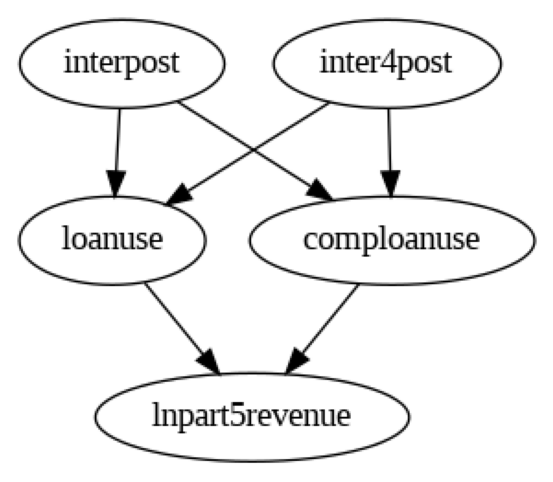

In [ ]:
from dowhy import CausalModel
import pandas as pd

# Use the dataset 'df_fe' which contains the variables you need
data = df_fe[['lnpart5revenue', 'loanuse', 'comploanuse', 'interpost', 'inter4post', 'treatratio_comp', 'type', 'post']]

# Step 1: Model the causal graph
# Create a CausalModel instance with the relevant variables
model = CausalModel(
    data=data,
    treatment=['loanuse', 'comploanuse'],
    outcome='lnpart5revenue',
    instruments=['interpost', 'inter4post']
)

# View the model structure (you may need to have graphviz installed to display the graph)
model.view_model()


In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                              
───────────────────────(E[lnpart5revenue])
d[loanuse  comploanuse]                   
Estimand assumption 1, Unconfoundedness: If U→{loanuse,comploanuse} and U→lnpart5revenue then P(lnpart5revenue|loanuse,comploanuse,,U) = P(lnpart5revenue|loanuse,comploanuse,)

### Estimand : 2
Estimand name: iv
Estimand expression:
 ⎡                                                                                           -1⎤
 ⎢           d                             ⎛           ∂                                    ⎞  ⎥
E⎢────────────────────────(lnpart5revenue)⋅⎜────────────────────────([loanuse  comploanuse])⎟  ⎥
 ⎣d[inter4post  interpost]                 ⎝∂[inter4post  interpost]                        ⎠  ⎦
Estimand assumption 1, As-if-random: If U→→lnpart5revenue then ¬(U →→{inter4post,interpost})
Estimand assumption 2, Exclusion: If we remove {

In [ ]:
# Check for missing data in key variables
missing_data = df_fe[['loanuse', 'comploanuse', 'interpost', 'inter4post', 'lnpart5revenue', 'post', 'treatratio_comp', 'type']].isnull().sum()
print(missing_data)
# Drop rows with missing values in key variables
df_fe_clean = df_fe[['loanuse', 'comploanuse', 'interpost', 'inter4post', 'lnpart5revenue', 'post', 'treatratio_comp', 'type']].dropna()
df_fe_clean.head()

loanuse              0
comploanuse          0
interpost            0
inter4post           0
lnpart5revenue     907
post                 0
treatratio_comp      0
type                 0
dtype: int64


,loanuse,comploanuse,interpost,inter4post,lnpart5revenue,post,treatratio_comp,type
0,0,0.000000,0.0,0.000000,6.111467,0.0,0.771429,1.0
1,0,0.200000,1.0,0.771429,6.427952,1.0,0.771429,1.0
2,0,0.285714,1.0,0.771429,4.010129,1.0,0.771429,1.0
3,0,0.000000,0.0,0.000000,4.382027,0.0,0.800000,1.0
4,0,0.200000,1.0,0.800000,4.342662,1.0,0.800000,1.0


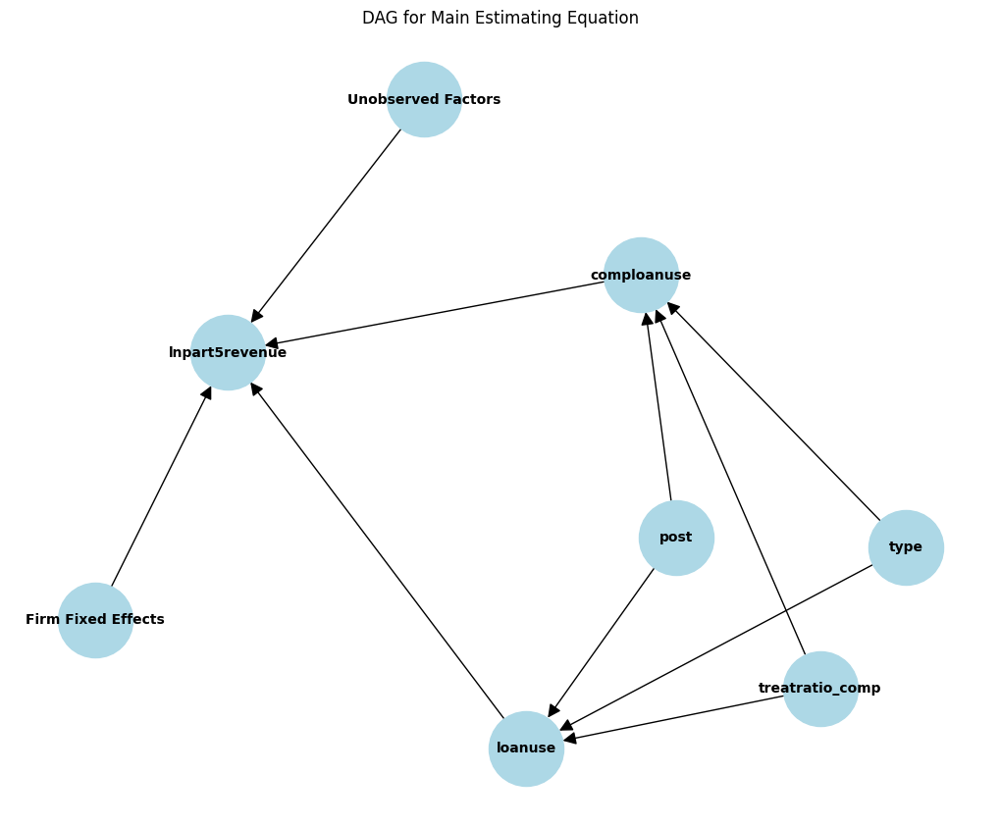

In [ ]:
import networkx as nx
from dowhy import CausalModel
import matplotlib.pyplot as plt

# Step 1: Create a DAG using networkx
G = nx.DiGraph()

# Add nodes (variables in the model)
nodes = [
    "post", "treatratio_comp", "type", "loanuse", "comploanuse",
    "lnpart5revenue", "Firm Fixed Effects", "Unobserved Factors"
]
G.add_nodes_from(nodes)

# Add directed edges (causal relationships)
edges = [
    ("post", "loanuse"),
    ("post", "comploanuse"),
    ("treatratio_comp", "loanuse"),
    ("treatratio_comp", "comploanuse"),
    ("type", "loanuse"),
    ("type", "comploanuse"),
    ("loanuse", "lnpart5revenue"),
    ("comploanuse", "lnpart5revenue"),
    ("Unobserved Factors", "lnpart5revenue"),  # Dotted line (Unobserved)
    ("Firm Fixed Effects", "lnpart5revenue")
]
G.add_edges_from(edges)

# Visualize the DAG (optional)
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=3000, font_size=10, font_weight='bold', arrowsize=20)
plt.title("DAG for Main Estimating Equation")
plt.show()

In [ ]:
model = CausalModel(
    data=df_fe_clean,
    treatment=['loanuse', 'comploanuse'],
    outcome='lnpart5revenue',
    graph=G
)

/usr/local/lib/python3.10/dist-packages/dowhy/causal_model.py:582: UserWarning: 2 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
  warnings.warn(


In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                              
───────────────────────(E[lnpart5revenue])
d[loanuse  comploanuse]                   
Estimand assumption 1, Unconfoundedness: If U→{loanuse,comploanuse} and U→lnpart5revenue then P(lnpart5revenue|loanuse,comploanuse,,U) = P(lnpart5revenue|loanuse,comploanuse,)

### Estimand : 2
Estimand name: iv
Estimand expression:
 ⎡                                                                                                 ↪
 ⎢              d                                ⎛              ∂                                  ↪
E⎢──────────────────────────────(lnpart5revenue)⋅⎜──────────────────────────────([loanuse  comploa ↪
 ⎣d[post  treatratio_comp  type]                 ⎝∂[post  treatratio_comp  type]                   ↪

↪        -1⎤
↪       ⎞  ⎥
↪ nuse])⎟  ⎥
↪       ⎠  ⎦
Estimand assumption 1, As-if-random: If U→→lnpart5revenue then ¬(U →→{po

In [ ]:
estimate = model.estimate_effect(
    identified_estimand=identified_estimand,
    method_name="iv.instrumental_variable"
)
print(estimate)

# Step 5: Refutation test (optional)
refutation = model.refute_estimate(
    identified_estimand, estimate, method_name="random_common_cause"
)
print(refutation)

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: iv
Estimand expression:
 ⎡                                                                                                 ↪
 ⎢              d                                ⎛              ∂                                  ↪
E⎢──────────────────────────────(lnpart5revenue)⋅⎜──────────────────────────────([loanuse  comploa ↪
 ⎣d[post  treatratio_comp  type]                 ⎝∂[post  treatratio_comp  type]                   ↪

↪        -1⎤
↪       ⎞  ⎥
↪ nuse])⎟  ⎥
↪       ⎠  ⎦
Estimand assumption 1, As-if-random: If U→→lnpart5revenue then ¬(U →→{post,treatratio_comp,type})
Estimand assumption 2, Exclusion: If we remove {post,treatratio_comp,type}→{loanuse,comploanuse}, then ¬({post,treatratio_comp,type}→lnpart5revenue)

## Realized estimand
Realized estimand: Wald Estimator
Realized estimand type: EstimandType.NONPARAMETRIC_ATE
Estimand expression:
   ⎡         

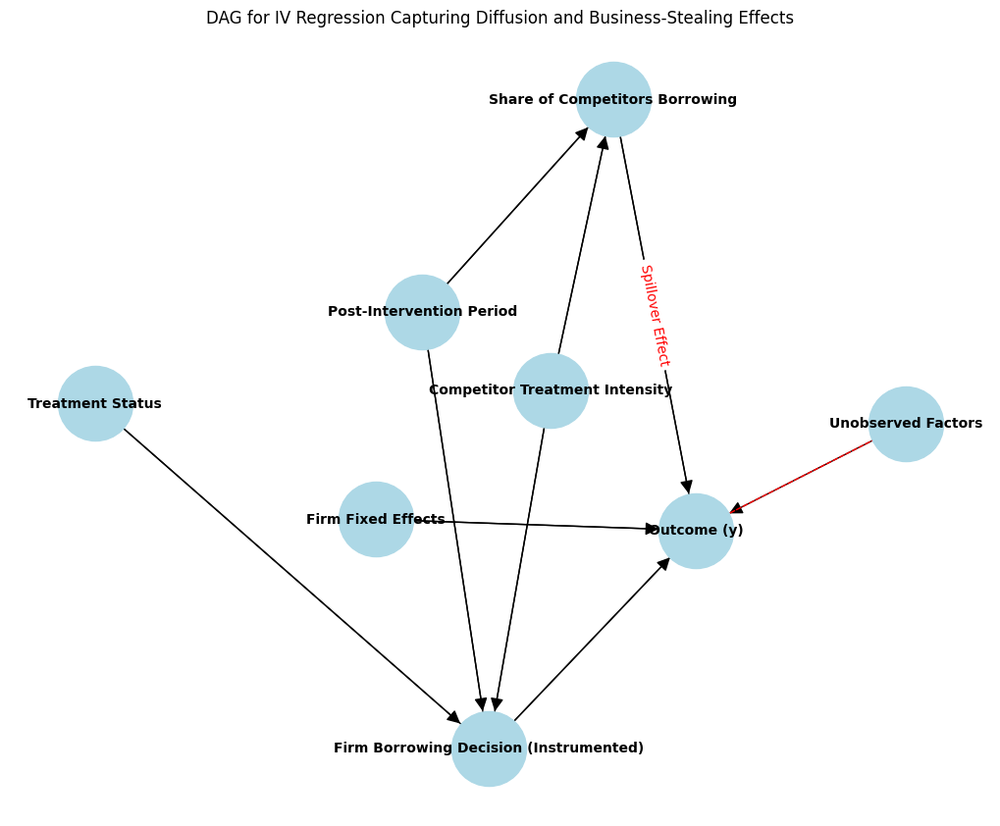

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Function to create a DAG for a given set of nodes and edges, allowing for dashed arrows
def create_dag(nodes, edges, title, filename):
    G = nx.DiGraph()
    G.add_nodes_from(nodes)

    # Add edges to the graph
    for edge in edges:
        u, v, label, is_dashed = edge
        if label:
            G.add_edge(u, v, label=label, style='dashed' if is_dashed else 'solid')
        else:
            G.add_edge(u, v, style='dashed' if is_dashed else 'solid')

    # Draw the graph
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=3000, font_size=10, font_weight='bold', arrowsize=20)

    # Draw dashed edges separately
    dashed_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'dashed']
    nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, style='dashed', edge_color='red')

    # Draw solid edges separately
    solid_edges = [(u, v) for u, v, d in G.edges(data=True) if d['style'] == 'solid']
    nx.draw_networkx_edges(G, pos, edgelist=solid_edges, style='solid', edge_color='black')

    # Draw edge labels if they exist
    edge_labels = {(u, v): G[u][v].get('label', '') for u, v in G.edges if G[u][v].get('label', '')}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')

    plt.title(title)

    # Save the plot as a PNG file
    plt.savefig(f"{filename}.png", format='png')
    plt.show()

# Updated DAG for IV Model Capturing Both Diffusion and Business-Stealing Effects
nodes_eq9 = ['Firm Borrowing Decision (Instrumented)', 'Share of Competitors Borrowing', 'Competitor Treatment Intensity',
             'Post-Intervention Period', 'Firm Fixed Effects', 'Outcome (y)', 'Unobserved Factors', 'Treatment Status']
edges_eq9 = [
    ('Competitor Treatment Intensity', 'Firm Borrowing Decision (Instrumented)', None, False),
    ('Post-Intervention Period', 'Firm Borrowing Decision (Instrumented)', None, False),
    ('Treatment Status', 'Firm Borrowing Decision (Instrumented)', None, False),
    ('Firm Borrowing Decision (Instrumented)', 'Outcome (y)', None, False),  # Business-stealing effect
    ('Share of Competitors Borrowing', 'Outcome (y)', 'Spillover Effect', False),  # Diffusion effect
    ('Competitor Treatment Intensity', 'Share of Competitors Borrowing', None, False),  # Instrument affects Share Competitors Borrowing
    ('Post-Intervention Period', 'Share of Competitors Borrowing', None, False),  # Instrument affects Share Competitors Borrowing
    ('Firm Fixed Effects', 'Outcome (y)', None, False),  # Firm fixed effect controls
    ('Unobserved Factors', 'Outcome (y)', None, True)  # Dashed arrow for unobserved factors
]
create_dag(nodes_eq9, edges_eq9, 'DAG for IV Regression Capturing Diffusion and Business-Stealing Effects', 'dag_iv_diffusion_business_stealing')


## Ridge (again?)

In [ ]:
df_fe_clean2 = df_fe_clean.copy()
df_fe_clean2.head()

,loanuse,comploanuse,interpost,inter4post,lnpart5revenue,post,treatratio_comp,type
0,0,0.000000,0.0,0.000000,6.111467,0.0,0.771429,1.0
1,0,0.200000,1.0,0.771429,6.427952,1.0,0.771429,1.0
2,0,0.285714,1.0,0.771429,4.010129,1.0,0.771429,1.0
3,0,0.000000,0.0,0.000000,4.382027,0.0,0.800000,1.0
4,0,0.200000,1.0,0.800000,4.342662,1.0,0.800000,1.0


In [ ]:
design = MS(df_fe_clean2.columns.drop('lnpart5revenue')).fit(df_fe_clean2)
Y = np.array(df_fe_clean2['lnpart5revenue'])

In [ ]:
D = design.fit_transform(df_fe_clean2)
D = D.drop('intercept', axis=1)
X = np.asarray(D)

In [ ]:
Xs = X - X.mean(0)[None,:]
X_scale = X.std(0)
Xs = Xs / X_scale[None,:]

lambdas = 10**np.linspace(8, -2, 100) / Y.std()
soln_array = skl.ElasticNet.path(Xs,
                                 Y,
                                 l1_ratio=0.,
                                 alphas=lambdas)[1]
soln_array.shape
#alpha means lamba in package


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133430.35686754237, tolerance: 26.686071373527597
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent 

(7, 100)

In [ ]:
soln_path = pd.DataFrame(soln_array.T,
                         columns=D.columns,
                         index=-np.log(lambdas))
soln_path.index.name = 'negative log(lambda)'
soln_path



,loanuse,comploanuse,interpost,inter4post,post,treatratio_comp,type
negative log(lambda),,,,,,,
-18.541618,1.489451e-10,6.812540e-12,2.745493e-10,1.361573e-10,2.547240e-10,-1.909435e-11,1.238516e-10
-18.309033,1.879474e-10,8.596449e-12,3.464419e-10,1.718110e-10,3.214252e-10,-2.409434e-11,1.562830e-10
-18.076449,2.371627e-10,1.084749e-11,4.371601e-10,2.168008e-10,4.055926e-10,-3.040360e-11,1.972067e-10
-17.843865,2.992654e-10,1.368797e-11,5.516335e-10,2.735716e-10,5.117998e-10,-3.836500e-11,2.488466e-10
-17.611280,3.776301e-10,1.727225e-11,6.960825e-10,3.452082e-10,6.458181e-10,-4.841114e-11,3.140089e-10
...,...,...,...,...,...,...,...
3.553896,6.297905e-03,-2.985038e-02,4.074925e-02,-7.427157e-03,2.432697e-02,-5.411343e-03,1.535383e-03
3.786480,6.276951e-03,-3.024629e-02,4.206902e-02,-8.405818e-03,2.457271e-02,-4.714568e-03,7.550318e-04
4.019065,6.255171e-03,-3.055705e-02,4.324910e-02,-9.321881e-03,2.478474e-02,-4.056856e-03,2.950921e-05


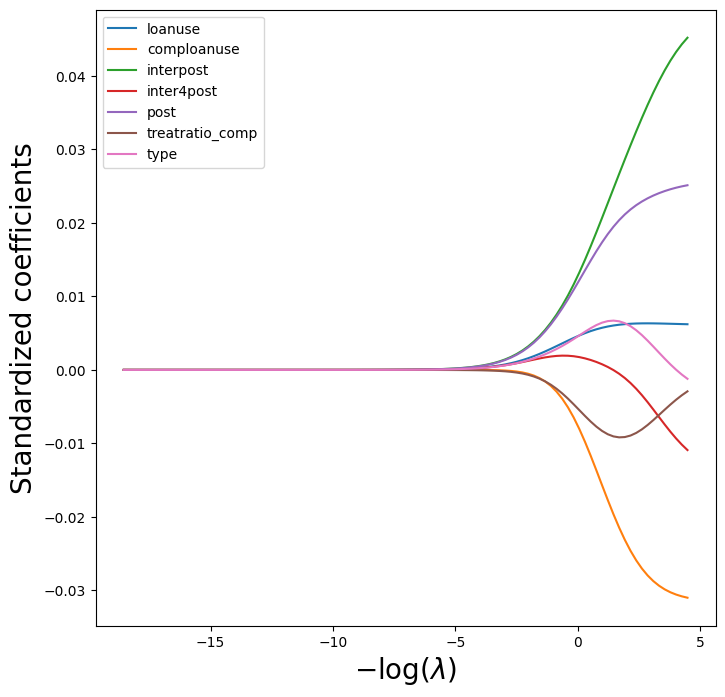

In [ ]:
path_fig, ax = subplots(figsize=(8,8))
soln_path.plot(ax=ax, legend=False)
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)
ax.legend(loc='upper left');

In [ ]:
path_fig.savefig('ridge_plotIV.png', bbox_inches='tight')

In [ ]:
beta_hat = soln_path.loc[soln_path.index[39]]
lambdas[39], beta_hat

(12975.624348635654,
 loanuse            1.295131e-06
 comploanuse        5.891369e-08
 interpost          2.387444e-06
 inter4post         1.183812e-06
 post               2.215116e-06
 treatratio_comp   -1.663022e-07
 type               1.076915e-06
 Name: -9.470827826231739, dtype: float64)

In [ ]:
np.linalg.norm(beta_hat)

3.856977506653789e-06

In [ ]:
beta_hat = soln_path.loc[soln_path.index[59]]
lambdas[59], np.linalg.norm(beta_hat)

(123.85862196213888, 0.0003958411400431686)

In [ ]:
ridge = skl.ElasticNet(alpha=lambdas[59], l1_ratio=0)
scaler = StandardScaler(with_mean=True,  with_std=True)
pipe = Pipeline(steps=[('scaler', scaler), ('ridge', ridge)])
pipe.fit(X, Y)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.381e+03, tolerance: 6.762e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', ElasticNet(alpha=123.85862196213888, l1_ratio=0))])

In [ ]:
np.linalg.norm(ridge.coef_)

0.00039584114004317266

In [ ]:
validation = skm.ShuffleSplit(n_splits=1,
                              test_size=0.5,
                              random_state=0)
ridge.alpha = 0.01
results = skm.cross_validate(ridge,
                             X,
                             Y,
                             scoring='neg_mean_squared_error',
                             cv=validation)
-results['test_score']


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.654e+03, tolerance: 3.319e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


array([0.79947557])

In [ ]:
ridge.alpha = 1e10
results = skm.cross_validate(ridge,
                             X,
                             Y,
                             scoring='neg_mean_squared_error',
                             cv=validation)
-results['test_score']


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.660e+03, tolerance: 3.319e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


array([0.79941])

In [ ]:
param_grid = {'ridge__alpha': lambdas}
grid = skm.GridSearchCV(pipe,
                        param_grid,
                        cv=validation,
                        scoring='neg_mean_squared_error')
grid.fit(X, Y)
grid.best_params_['ridge__alpha']
grid.best_estimator_


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.660e+03, tolerance: 3.319e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.660e+03, tolerance: 3.319e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', ElasticNet(alpha=0.36955043560263323, l1_ratio=0))])

In [ ]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

In [ ]:
grid = skm.GridSearchCV(pipe,
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
grid.fit(X, Y)
grid.best_params_['ridge__alpha']
grid.best_estimator_


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.705e+03, tolerance: 5.409e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.707e+03, tolerance: 5.413e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', ElasticNet(alpha=0.2928624002943267, l1_ratio=0))])

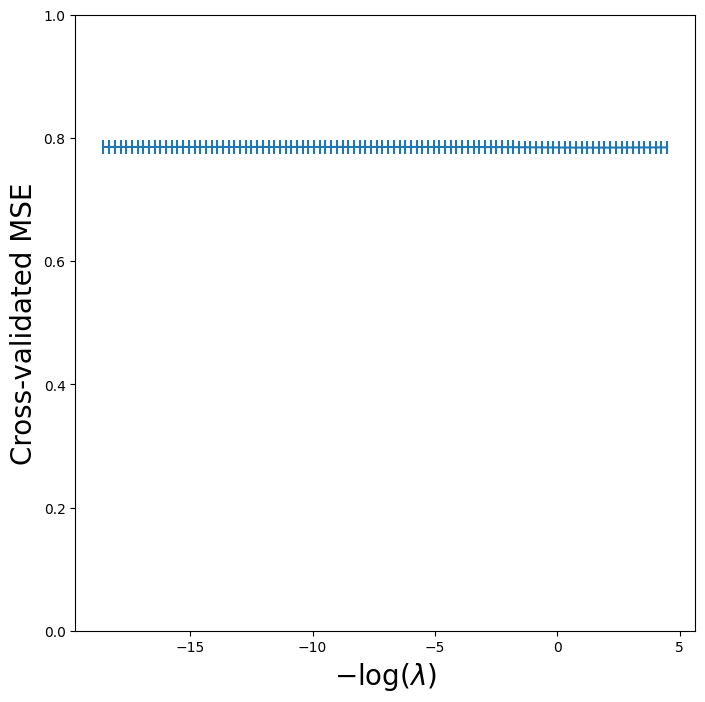

In [ ]:
ridge_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            -grid.cv_results_['mean_test_score'],
            yerr=grid.cv_results_['std_test_score'] / np.sqrt(K))
ax.set_ylim([0,1])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);


In [ ]:
grid_r2 = skm.GridSearchCV(pipe,
                           param_grid,
                           cv=kfold)
grid_r2.fit(X, Y)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.705e+03, tolerance: 5.409e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.707e+03, tolerance: 5.413e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('ridge',
                                        ElasticNet(alpha=10000000000.0,
                                                   l1_ratio=0))]),
             param_grid={'ridge__alpha': array([1.12855363e+08, 8.94359454e+07, 7.08764573e+07, 5.61683803e+07,
       4.45124808e+07, 3.52753798e+07, 2.79551352e+07, 2.21539666e+07,
       1.75566396e+07, 1.39133367...
       2.37549722e+00, 1.88254092e+00, 1.49188149e+00, 1.18229056e+00,
       9.36945053e-01, 7.42512931e-01, 5.88428800e-01, 4.66319761e-01,
       3.69550436e-01, 2.92862400e-01, 2.32088444e-01, 1.83926123e-01,
       1.45758307e-01, 1.15510965e-01, 9.15404646e-02, 7.25442527e-02,
       5.74900797e-02, 4.55599050e-02, 3.61054455e-02, 2.86129481e-02,
       2.26752721e-02, 1.79697653e-02, 1.42407317e-02, 1.12855363e-02])})

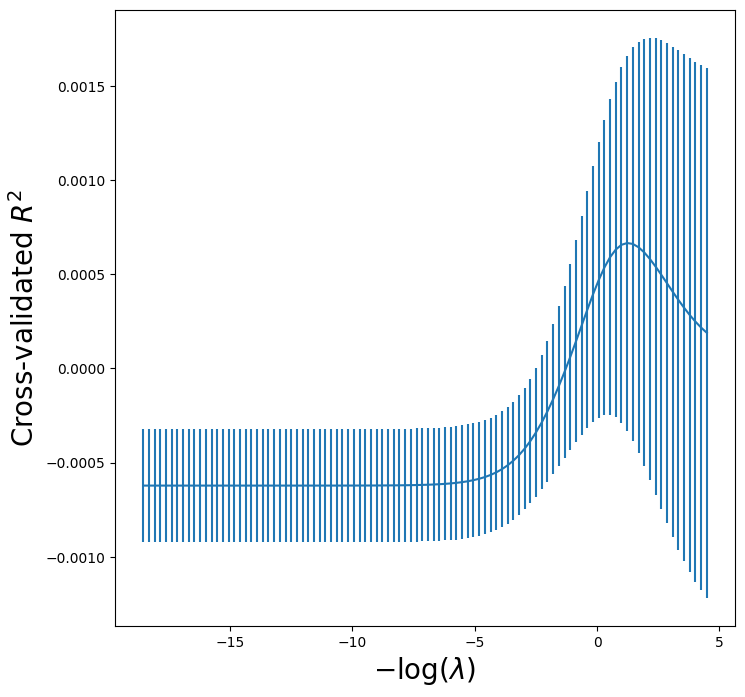

In [ ]:
r2_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            grid_r2.cv_results_['mean_test_score'],
            yerr=grid_r2.cv_results_['std_test_score'] / np.sqrt(K))
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated $R^2$', fontsize=20);


In [ ]:
ridgeCV = skl.ElasticNetCV(alphas=lambdas,
                           l1_ratio=0,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('ridge', ridgeCV)])
pipeCV.fit(X, Y)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2704.517829756761, tolerance: 0.5409035659764707
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge',
                 ElasticNetCV(alphas=array([1.12855363e+08, 8.94359454e+07, 7.08764573e+07, 5.61683803e+07,
       4.45124808e+07, 3.52753798e+07, 2.79551352e+07, 2.21539666e+07,
       1.75566396e+07, 1.39133367e+07, 1.10260814e+07, 8.73798092e+06,
       6.92470045e+06, 5.48770668e+06, 4.34891370e+06, 3.44643973e+06,
       2.73124455e+06, 2.16446459e+06,...
       9.36945053e-01, 7.42512931e-01, 5.88428800e-01, 4.66319761e-01,
       3.69550436e-01, 2.92862400e-01, 2.32088444e-01, 1.83926123e-01,
       1.45758307e-01, 1.15510965e-01, 9.15404646e-02, 7.25442527e-02,
       5.74900797e-02, 4.55599050e-02, 3.61054455e-02, 2.86129481e-02,
       2.26752721e-02, 1.79697653e-02, 1.42407317e-02, 1.12855363e-02]),
                              cv=KFold(n_splits=5, random_state=0, shuffle=True),
                              l1_ratio=0))])

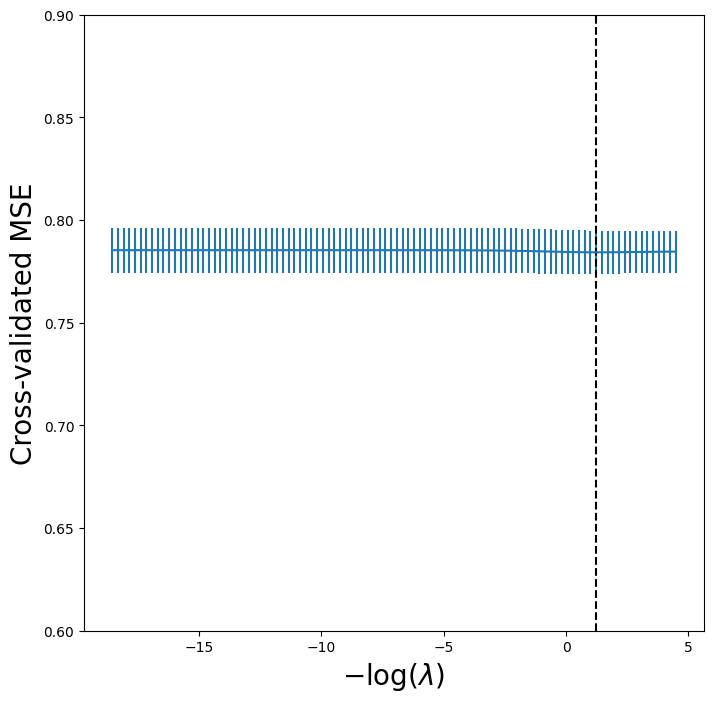

In [ ]:
tuned_ridge = pipeCV.named_steps['ridge']
ridgeCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            tuned_ridge.mse_path_.mean(1),
            yerr=tuned_ridge.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_ridge.alpha_), c='k', ls='--')
ax.set_ylim([0.6,0.9])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);


In [ ]:
ridgeCV_fig.savefig('RidgeCV_plot.png', bbox_inches='tight')

In [ ]:
np.min(tuned_ridge.mse_path_.mean(1))


In [ ]:
tuned_ridge.coef_


array([ 0.00590481, -0.01769435,  0.02267528,  0.00040344,  0.01847179,
       -0.00875001,  0.00663988])

##Lasso again

In [ ]:
lassoCV = skl.ElasticNetCV(n_alphas=100,
                           l1_ratio=1,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('lasso', lassoCV)])
pipeCV.fit(X, Y)
tuned_lasso = pipeCV.named_steps['lasso']
tuned_lasso.alpha_


0.0035624487093022564

In [ ]:
lambdas, soln_array = skl.Lasso.path(Xs,
                                    Y,
                                    l1_ratio=1,
                                    n_alphas=100)[:2]
soln_path = pd.DataFrame(soln_array.T,
                         columns=D.columns,
                         index=-np.log(lambdas))


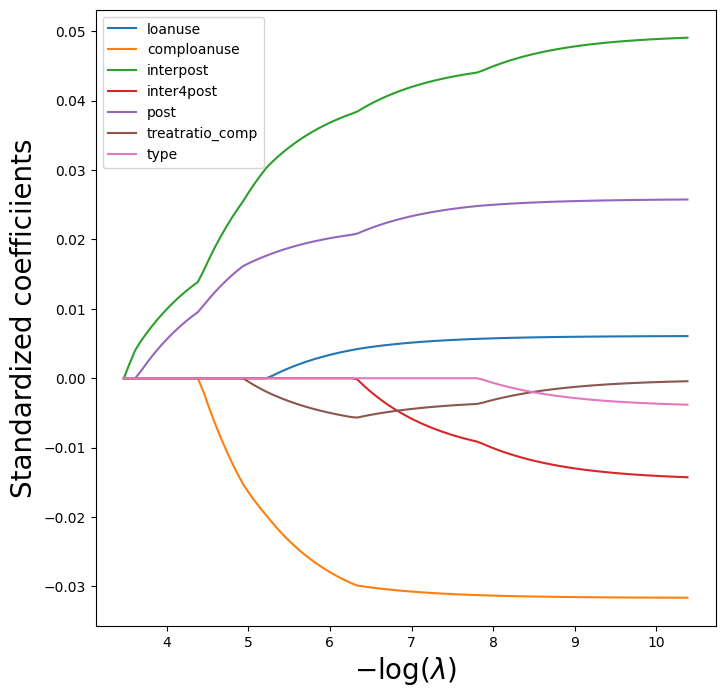

In [ ]:
path_fig, ax = subplots(figsize=(8,8))
soln_path.plot(ax=ax, legend=False)
ax.legend(loc='upper left')
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficiients', fontsize=20);


In [ ]:
path_fig.savefig('lassoCV_IVplot.png', bbox_inches='tight')

In [ ]:
np.min(tuned_lasso.mse_path_.mean(1))


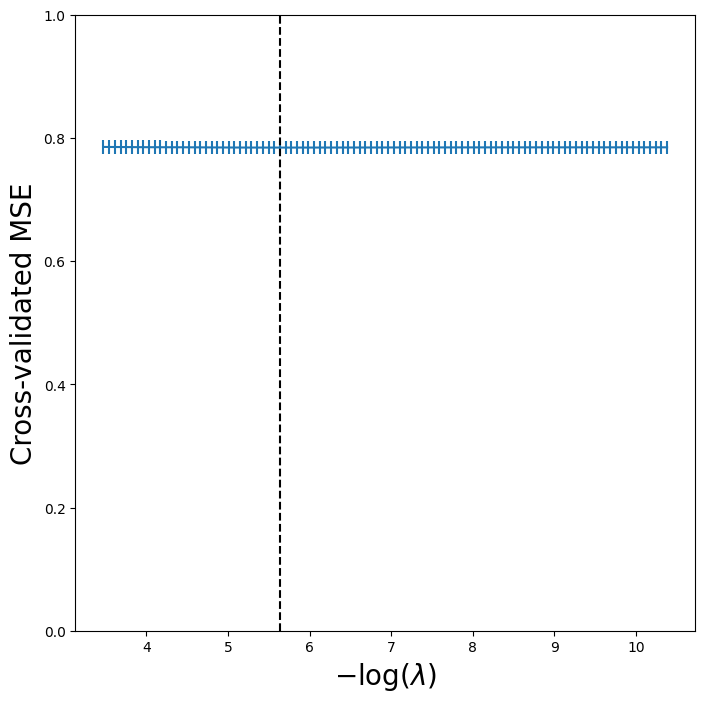

In [ ]:
lassoCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(tuned_lasso.alphas_),
            tuned_lasso.mse_path_.mean(1),
            yerr=tuned_lasso.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_lasso.alpha_), c='k', ls='--')
ax.set_ylim([0,1])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);

In [ ]:
lassoCV_fig.savefig('lassoCVIV_plot.png', bbox_inches='tight')

In [ ]:
tuned_lasso.coef_


## Regression Trees

In [ ]:
model = MS(df_fe_clean2.columns.drop('lnpart5revenue'), intercept=False)
D = model.fit_transform(df_fe_clean2)
feature_names = list(D.columns)
X = np.asarray(D) #array of all X's, keep all feature names


In [ ]:
(X_train,
 X_test,
 y_train,
 y_test) = skm.train_test_split(X,
                                df_fe_clean2['lnpart5revenue'],
                                test_size=0.3,
                                random_state=0)


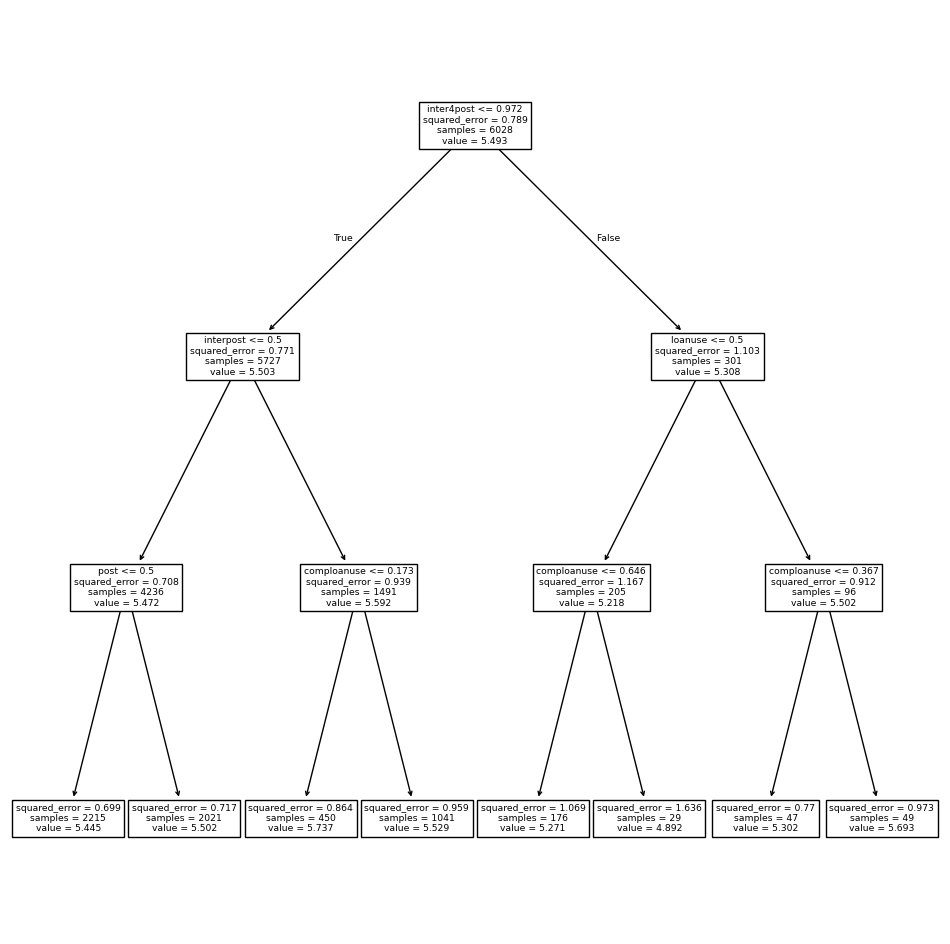

In [ ]:
reg = DTR(max_depth=3)
reg.fit(X_train, y_train)
ax = subplots(figsize=(12,12))[1]
plot_tree(reg,
          feature_names=feature_names,
          ax=ax);
#inter4post is share of competitors treated
#post is indicator for post treatment period
#comploanuse is the share of competitiors who are loaning
#loanuse is the treated firm's borrowing decision, which we use in second stage 2sls

Cross Validation & Pruning

In [ ]:
ccp_path = reg.cost_complexity_pruning_path(X_train, y_train)
kfold = skm.KFold(5,
                  shuffle=True,
                  random_state=10)
grid = skm.GridSearchCV(reg,
                        {'ccp_alpha': ccp_path.ccp_alphas},
                        refit=True,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
G = grid.fit(X_train, y_train)


In [ ]:
best_ = grid.best_estimator_
RTreeMSE= np.mean((y_test - best_.predict(X_test))**2)
RTreeMSE


0.7802888448753289

In [ ]:
(np.mean((y_test - best_.predict(X_test))**2))**0.5

0.8833395977059609

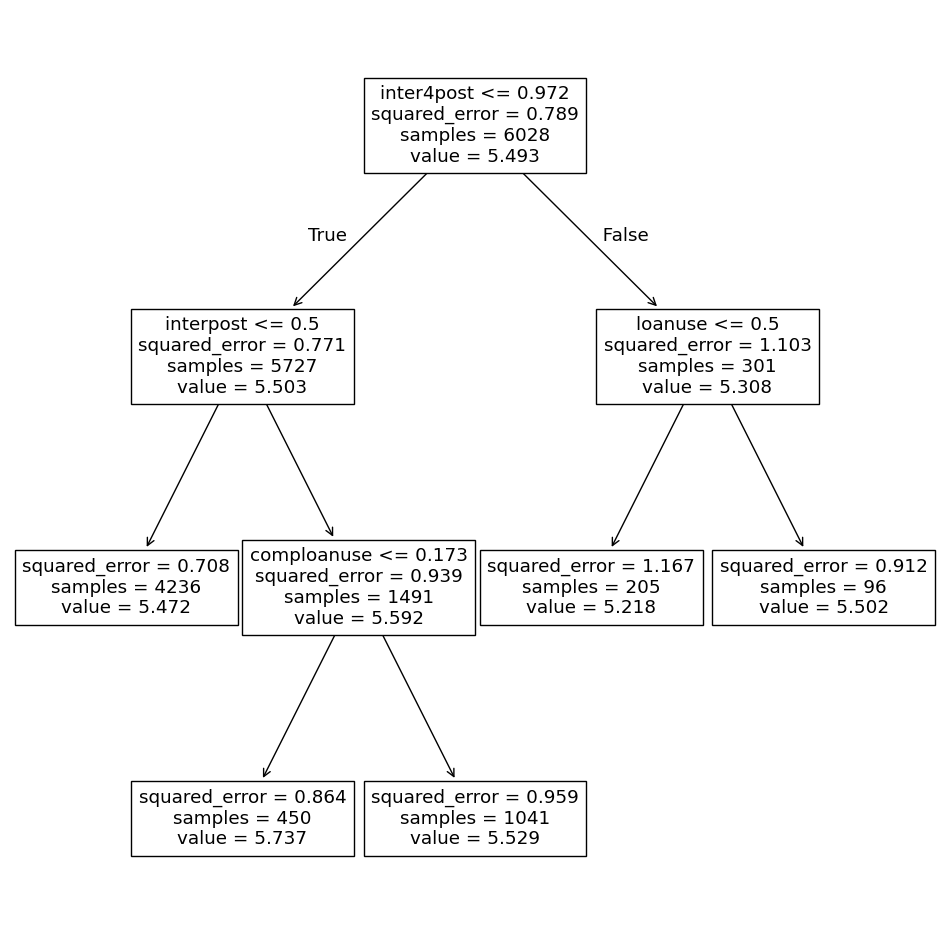

In [ ]:
ax = subplots(figsize=(12,12))[1]
plot_tree(G.best_estimator_,
          feature_names=feature_names,
          ax=ax);


In [ ]:
fig = ax.get_figure()
fig.savefig('tree_plotIV.png', format='png', dpi=300)

##Bagging + RF's

In [ ]:
bag_chIV = RF(max_features=X_train.shape[1], random_state=0)
bag_chIV.fit(X_train, y_train)
#using all features and X's; RF uses subset

RandomForestRegressor(max_features=7, random_state=0)

0.7825181970341009

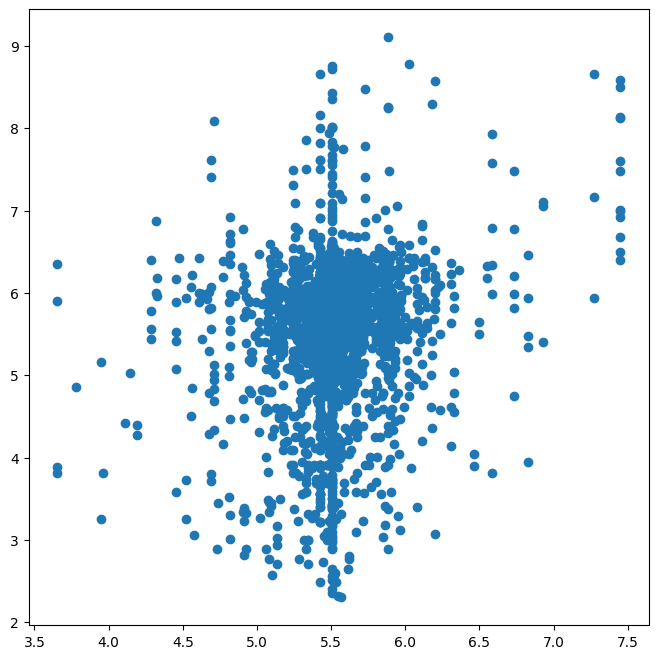

In [ ]:
ax = subplots(figsize=(8,8))[1]
y_hat_bag = bag_chIV.predict(X_test)
ax.scatter(y_hat_bag, y_test)
np.mean((y_test - y_hat_bag)**2)


In [ ]:
fig = ax.get_figure()
fig.savefig('baggingIV.png', format='png', dpi=300)

In [ ]:
bag_chIV = RF(max_features=X_train.shape[1],
                n_estimators=500, #default is 100
                random_state=0).fit(X_train, y_train)
y_hat_bag = bag_chIV.predict(X_test)
np.mean((y_test - y_hat_bag)**2)

0.782011157031227

In [ ]:
RF_IVch = RF(max_features=6, #random forest as only choose 6 - subset
               random_state=0).fit(X_train, y_train)
y_hat_RFIV = RF_IVch.predict(X_test)
np.mean((y_test - y_hat_RFIV)**2)


0.7820924534648436

In [ ]:
feature_imp = pd.DataFrame(
    {'importance':RF_IVch.feature_importances_}, #include in rep
    index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

,importance
treatratio_comp,0.345891
comploanuse,0.343329
inter4post,0.174980
loanuse,0.078379
interpost,0.025766
type,0.024648
post,0.007007


In [ ]:
feature_imp.sort_values(by='importance', ascending=False).to_latex(caption='Feature Importances of IV Random Forest', label='tab:feature_importances', float_format="%.6f")


'\\begin{table}\n\\caption{Feature Importances of IV Random Forest}\n\\label{tab:feature_importances}\n\\begin{tabular}{lr}\n\\toprule\n & importance \\\\\n\\midrule\ntreatratio_comp & 0.345891 \\\\\ncomploanuse & 0.343329 \\\\\ninter4post & 0.174980 \\\\\nloanuse & 0.078379 \\\\\ninterpost & 0.025766 \\\\\ntype & 0.024648 \\\\\npost & 0.007007 \\\\\n\\bottomrule\n\\end{tabular}\n\\end{table}\n'

## IPW + Prop Score

In [33]:
from copy import deepcopy

import numpy as np
import pandas as pd
from scipy import stats

from sklearn.metrics import mean_absolute_percentage_error
!pip install dowhy -q
import dowhy
from dowhy import CausalModel

from sklearn.linear_model import LinearRegression, LogisticRegression, LassoCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

from lightgbm import LGBMRegressor, LGBMClassifier

import networkx as nx

from tqdm import tqdm

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import graphviz


Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.



In [35]:
nodes = ['interpost', 'inter4post', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'marketcategory', 'survey_town']
edges = [
    # Treatment effects
    ('interpost', 'lnpart5revenue'),  # Access to finance affects revenue
    ('interpost', 'total_profit'),    # Access to finance affects total profit
    ('interpost', 'lnwage_cost'),     # Access to finance affects wage cost
    ('interpost', 'lnlabor'),         # Access to finance affects labor

    # Competitor influence
    ('inter4post', 'interpost'),      # Share of competitors treated affects access to finance
    ('inter4post', 'lnpart5revenue'), # Share of competitors treated affects revenue
    ('inter4post', 'total_profit'),   # Share of competitors treated affects profit

    # Firm characteristics
    ('firmage', 'interpost'),         # Firm age affects access to finance

    # Interactions between labor and outcomes
    ('lnwage_cost', 'lnpart5revenue'), # Wage cost impacts revenue
    ('lnwage_cost', 'total_profit'),   # Wage cost impacts profit

    ('lnlabor', 'lnpart5revenue'),     # Labor impacts revenue
    ('lnlabor', 'total_profit')        # Labor impacts profit
]

In [237]:
df_fe['baseline_firmage'] = df_fe['firmage'] * df_fe['baseline']
df_fe['baseline_lnwage_cost'] = df_fe['lnwage_cost'] * df_fe['baseline']
df_fe['baseline_lnlabor'] = df_fe['lnlabor']* df_fe['baseline']
df_fe['baseline_total_profit'] = df_fe['total_profit'] * df_fe['baseline']
df_fe['baseline_lnpart5revenue'] = df_fe['lnpart5revenue'] * df_fe['baseline']

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [61]:
df_fe['baseline_firmage'].head()

,baseline_firmage
0,5.0
1,NaN
2,NaN
3,6.0
4,NaN


In [36]:
nodes = ['interpost', 'inter4post', 'lnpart5revenue','baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'baseline_lnlabor', 'comploanuse','loanuse', 'lcompnum', 'basecounty', 'marketcategory', 'survey_town']
edges = [
    # Treatment effects
    ('interpost', 'lnpart5revenue'),  # Access to finance affects revenue - DiD
    ('loanuse', 'lnpart5revenue'),  # Loan use affects revenue IV


    # Competitor influence
    ('interpost', 'inter4post'),
    ('interpost', 'loanuse'),

    ('inter4post', 'comploanuse'),
    ('comploanuse', 'lnpart5revenue'),
    # Firm characteristics
    ('baseline_lnpart5revenue', 'loanuse'),
    ('baseline_total_profit', 'loanuse'),
    ('baseline_lnwage_cost', 'loanuse'),
    ('baseline_lnlabor', 'loanuse'),

    ('baseline_lnpart5revenue', 'lnpart5revenue'),
    ('baseline_total_profit', 'lnpart5revenue'),
    ('baseline_lnwage_cost', 'lnpart5revenue'),
    ('baseline_lnlabor', 'lnpart5revenue'),

    # market characteristics
    ('lcompnum', 'lnpart5revenue'),
    ('marketcategory', 'lnpart5revenue'),
    ('survey_town', 'lnpart5revenue'),

    ('lcompnum', 'comploanuse'),
    ('marketcategory', 'comploanuse'),
    ('survey_town', 'comploanuse'),

    ('lcompnum', 'inter4post'),
    ('marketcategory', 'inter4post'),
    ('survey_town', 'inter4post'),


]

In [37]:
gml_string_drug = 'graph [directed 1\n'

for node in nodes:
    gml_string_drug += f'\tnode [id "{node}" label "{node}"]\n'

for edge in edges:
    gml_string_drug += f'\tedge [source "{edge[0]}" target "{edge[1]}"]\n'

gml_string_drug += ']'

# Instantiate the CausalModel
model_drug = CausalModel(
    data=df_fe,
    treatment='interpost',
    outcome='lnpart5revenue',
    graph=gml_string_drug
)


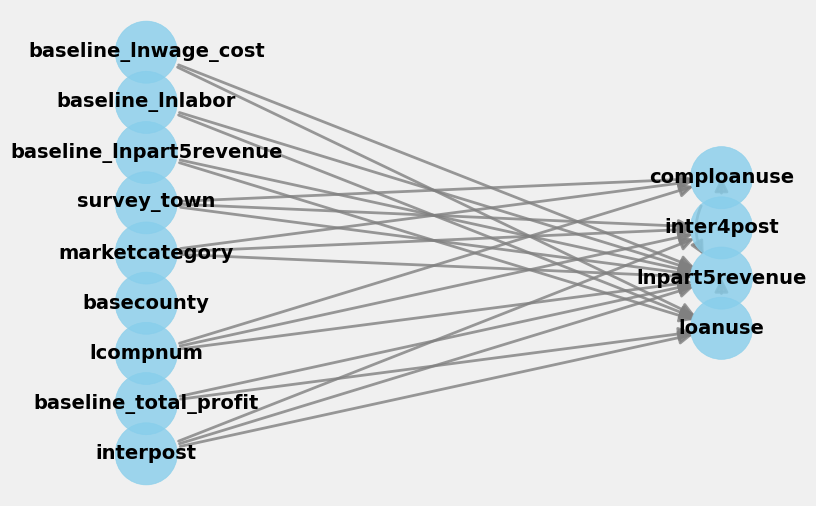

In [ ]:
model_drug.view_model()

In [ ]:
df_fe['firmage'].isna().sum()

6346

In [ ]:
df_fe['interpost']

,interpost
0,0.0
1,1.0
2,1.0
3,0.0
4,1.0
...,...
9514,0.0
9515,0.0
9516,0.0
9517,1.0


In [39]:
estimand_drug = model_drug.identify_effect()

In [40]:
# Get estimate (IPW weighting)
estimate_drug = model_drug.estimate_effect(
    identified_estimand=estimand_drug,
    method_name='backdoor.propensity_score_weighting',
    target_units='ate'
)

print(estimate_drug.value)

ERROR:dowhy.causal_estimator:No common causes/confounders present. Propensity score based methods are not applicable


Exception: No common causes/confounders present. Propensity score based methods are not applicable

In [ ]:
df_fe['']

In [ ]:
# Get estimate (IPW weighting)
estimate = model_drug.estimate_effect(
    identified_estimand=estimand_drug,
    method_name='backdoor.propensity_score_weighting',
    target_units='ate'
)

ERROR:dowhy.causal_estimator:No common causes/confounders present. Propensity score based methods are not applicable


Exception: No common causes/confounders present. Propensity score based methods are not applicable

In [ ]:
estimate.value

0.011443131458474198

In [ ]:
df_fe['share']

,firmid,shutdown,newproduct,gender,age,education_college,num_clients,num_supplier,bankloan,round,...,interpost,inter4post,interpost_comp1,interpost_comp2,loanuse,loanusesum,comploanuse,baseline,midline,endline
0,111.0,0.0,0.0,1.0,38.0,0.0,34.0,15.0,0.0,1.0,...,0.0,0.000000,0.000000,0.0,0,0.0,0.000000,1,0,0
1,111.0,0.0,0.0,0.0,39.0,0.0,50.0,12.0,0.0,2.0,...,1.0,0.771429,0.771429,0.0,0,7.0,0.200000,0,1,0
2,111.0,0.0,0.0,0.0,41.0,0.0,17.0,13.0,0.0,3.0,...,1.0,0.771429,0.771429,0.0,0,10.0,0.285714,0,0,1
3,112.0,0.0,0.0,0.0,22.0,0.0,12.0,3.0,1.0,1.0,...,0.0,0.000000,0.000000,0.0,0,0.0,0.000000,1,0,0
4,112.0,0.0,1.0,0.0,24.0,0.0,12.0,2.0,0.0,2.0,...,1.0,0.800000,0.800000,0.0,0,1.0,0.200000,0,1,0


In [238]:

df_fe2 = df_fe.dropna(subset=['lnwage_cost'])
#df_fe2["share_comp_scaled"] = (df_fe2["treatratio_comp"] - df_fe2["treatratio_comp"].mean()) / df_fe2["treatratio_comp"].std()
#df_fe2["interaction_share_comp"] = df_fe2["type"] * df_fe2["share_comp_scaled"]

df_feprop = df_fe2[df_fe2['round'] < 2]
#df_feprop = df_feprop[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town', 'round', 'firmid']]
df_feprop = df_feprop[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'round', 'firmid', 'basecounty']]
df_feprop = df_feprop.dropna(subset=['basecounty'])

#df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town', 'round', 'firmid']]
df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'round', 'firmid', 'basecounty']]
df_fe2 = df_fe2.dropna(subset=['basecounty'])

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [ ]:
#df_fe2 = df_fe.dropna(subset=['lnwage_cost'])

In [ ]:
#df_fe2 = df_fe2[df_fe2['round'] < 2]

In [215]:
#df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor']]

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [ ]:
#df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town']]

In [ ]:
#df_fe2 = df_fe2.dropna(subset=['basecounty'])

KeyError: ['basecounty']

In [ ]:
#df_fe2 = df_fe2[['type', 'treatratio_comp', 'lnpart5revenue','baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'baseline_lnlabor', 'comploanuse','loanuse', 'lcompnum', 'basecounty', 'retail', 'survey_town']]

In [ ]:
#df_fe2 = df_fe2[['type', 'treatratio_comp', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor']]

In [ ]:
# Fit the logistic regression model
#logit_model = LogisticRegression(max_iter=1000)
#logit_model.fit(X, D)

# Predict propensity scores
#df_fe2['propensity_score'] = logit_model.predict_proba(X)[:, 1]

# Step 2: Calculate IPTW weights
##df_fe2['iptw_weight'] = df_fe2.apply(lambda row: row[treatment] / row['propensity_score'] +
                          #       (1 - row[treatment]) / (1 - row['propensity_score']), axis=1)
#
# Step 3: Fit a weighted regression model to estimate the treatment effect
#y = df_fe2[outcome]
#X_reg = sm.add_constant(df_fe2[[treatment] + covariates])  # Add a constant and covariates

# Fit the weighted regression model
#wls_model = sm.WLS(y, X_reg, weights=df_fe2['iptw_weight'])
#results = wls_model.fit()

# Print summary of the weighted regression results
#print(results.summary())

                            WLS Regression Results                            
Dep. Variable:         lnpart5revenue   R-squared:                       0.162
Model:                            WLS   Adj. R-squared:                  0.161
Method:                 Least Squares   F-statistic:                     128.0
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          4.61e-100
Time:                        02:01:12   Log-Likelihood:                -3619.3
No. Observations:                2656   AIC:                             7249.
Df Residuals:                    2651   BIC:                             7278.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               4.3905      0.068     

In [248]:
from sklearn.linear_model import LogisticRegression

# Specify treatment and outcome variables
T = 'type'  # Replace with your actual treatment variable
Y = 'lnpart5revenue'  # Replace with your actual outcome variable
X = df_feprop.columns.drop([T, Y, 'round','firmid', 'basecounty'])  # Replace 'firmid' with any ID variable you have

# Fit logistic regression to estimate propensity scores
ps_model = LogisticRegression(C=1e6, max_iter=1000).fit(df_feprop[X], df_feprop[T])

# Add propensity scores to the data
data_ps = df_feprop.assign(propensity_score=ps_model.predict_proba(df_feprop[X])[:, 1])

data_ps.describe()


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. 

,type,lnpart5revenue,total_profit,firmage,lnwage_cost,lnlabor,round,firmid,basecounty,propensity_score
count,2779.000000,2779.000000,2779.000000,2779.000000,2779.000000,2779.000000,2779.0,2.779000e+03,2779.000000,2779.000000
mean,0.451961,5.470998,51.603374,6.504858,2.683430,1.962875,1.0,1.101679e+09,4.103994,0.452042
std,0.497778,0.827362,69.374321,4.277384,0.809428,0.736659,0.0,1.032658e+10,2.647890,0.012098
min,0.000000,2.302585,-152.000000,1.000000,-0.693147,0.000000,1.0,1.110000e+02,1.000000,0.343527
25%,0.000000,5.280633,19.225000,4.000000,2.261763,1.609438,1.0,2.141900e+04,2.000000,0.447204
50%,0.000000,5.634789,39.259998,5.000000,2.821379,2.079442,1.0,3.291900e+04,3.000000,0.454739
75%,1.000000,5.913503,66.599998,8.000000,3.178054,2.484907,1.0,3.307080e+06,6.000000,0.459755
max,1.000000,9.104980,1407.000000,44.000000,5.470589,3.912023,1.0,9.993302e+10,11.000000,0.482189


In [ ]:
#from sklearn.linear_model import LogisticRegression

# Specify treatment and outcome variables
#T = 'type'  # Replace with your actual treatment variable
#Y = 'lnpart5revenue'  # Replace with your actual outcome variable
#X = df_fe2.columns.drop([T, Y])  # Replace 'firmid' with any ID variable you have

# Fit logistic regression to estimate propensity scores
#ps_model = LogisticRegression(C=1e6, max_iter=1000).fit(df_fe2[X], df_fe2[T])

# Add propensity scores to the data
#data_ps = df_fe2.assign(propensity_score=ps_model.predict_proba(df_fe2[X])[:, 1])

#data_ps[[T, Y, "propensity_score"]].head()


,type,lnpart5revenue,propensity_score
0,1.0,6.111467,0.453603
3,1.0,4.382027,0.454821
6,1.0,5.298317,0.453206
9,1.0,5.634789,0.453992
12,0.0,5.393628,0.454100


In [249]:
weight_t = 1 / data_ps.query("type == 1")["propensity_score"]
weight_nt = 1 / (1 - data_ps.query("type == 0")["propensity_score"])

print("Original Sample Size", df_feprop.shape[0])
print("Treated Population Sample Size", sum(weight_t))
print("Untreated Population Sample Size", sum(weight_nt))


Original Sample Size 2779
Treated Population Sample Size 2778.6225909689706
Untreated Population Sample Size 2779.40461644423


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



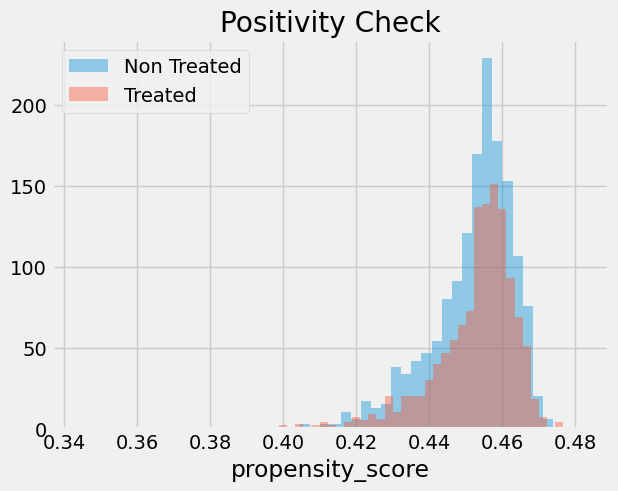

In [250]:

import seaborn as sns
sns.distplot(data_ps.query("type==0")["propensity_score"], kde=False, label="Non Treated")
sns.distplot(data_ps.query("type==1")["propensity_score"], kde=False, label="Treated")
plt.title("Positivity Check")
plt.legend();


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



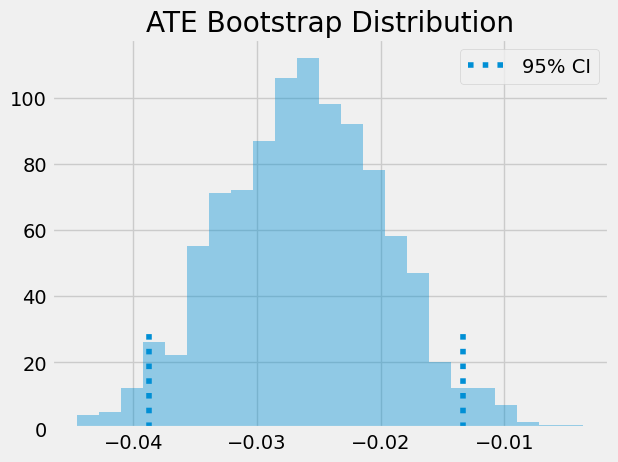

In [234]:
sns.distplot(ates, kde=False)
plt.vlines(np.percentile(ates, 2.5), 0, 30, linestyles="dotted")
plt.vlines(np.percentile(ates, 97.5), 0, 30, linestyles="dotted", label="95% CI")
plt.title("ATE Bootstrap Distribution")
plt.legend();

In [253]:
data_ps

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


,type,lnpart5revenue,total_profit,firmage,lnwage_cost,lnlabor,round,firmid,basecounty,propensity_score
0,1.0,6.111467,87.660004,5.0,3.126760,2.484907,1.0,1.110000e+02,7.0,0.456951
3,1.0,4.382027,27.150000,6.0,2.839078,2.197225,1.0,1.120000e+02,7.0,0.457319
6,1.0,5.298317,42.959999,6.0,2.379546,1.791759,1.0,1.130000e+02,7.0,0.453916
9,1.0,5.634789,78.959999,5.0,3.015535,2.484907,1.0,1.140000e+02,7.0,0.458572
12,0.0,5.393628,55.000000,5.0,2.208274,1.945910,1.0,1.150000e+02,7.0,0.459196
...,...,...,...,...,...,...,...,...,...,...
9504,0.0,5.966147,50.090000,5.0,2.610070,2.079442,1.0,9.993302e+10,2.0,0.458156
9507,0.0,6.016157,48.619999,3.0,2.803360,2.397895,1.0,9.993302e+10,4.0,0.466285
9510,1.0,5.831882,66.040001,5.0,2.944439,2.302585,1.0,9.993302e+10,4.0,0.457431
9513,0.0,6.016157,89.580002,3.0,2.867899,2.397895,1.0,9.993302e+10,4.0,0.462562


In [ ]:
# Merge propensity scores from baseline into the full dataset
df_fe2 = df_fe2.merge(data_ps[['firmid', 'propensity_score']], on='firmid', how='left')


In [ ]:
# Merge propensity scores from baseline into the full dataset
df_fe2 = df_fe2.merge(data_ps[['firmid', 'propensity_score']], on='firmid', how='left')

# Create weights for treated and untreated populations across rounds
df_fe2['weight_t'] = df_fe2.query("type == 1")['propensity_score'].apply(lambda x: 1 / x)
df_fe2['weight_nt'] = df_fe2.query("type == 0")['propensity_score'].apply(lambda x: 1 / (1 - x))


In [ ]:
# List of post-treatment rounds
post_treatment_rounds = [2, 3]

# Loop through each post-treatment round
for round_num in post_treatment_rounds:
    # Filter data for the current round
    round_data = df_fe2[df_fe2["round"] == round_num]

    # Calculate weighted means for treated and untreated groups
    Y1 = (round_data.query("type == 1")["lnpart5revenue"] * round_data.query("type == 1")["weight_t"]).sum() / round_data["weight_t"].sum()
    Y0 = (round_data.query("type == 0")["lnpart5revenue"] * round_data.query("type == 0")["weight_nt"]).sum() / round_data["weight_nt"].sum()

    # Calculate Average Treatment Effect (ATE)
    ATE = Y1 - Y0

    # Print the results for the current round
    print(f"Round {round_num}:")
    print(f"  Y1 (Outcome if Treated): {Y1}")
    print(f"  Y0 (Outcome if Untreated): {Y0}")
    print(f"  Average Treatment Effect (ATE): {ATE}\n")


Round 2:
  Y1 (Outcome if Treated): 5.542008187408988
  Y0 (Outcome if Untreated): 5.480484910310428
  Average Treatment Effect (ATE): 0.061523277098560314

Round 3:
  Y1 (Outcome if Treated): 5.55284734418563
  Y0 (Outcome if Untreated): 5.507565238570576
  Average Treatment Effect (ATE): 0.04528210561505386



In [ ]:

df_fe2 = df_fe.dropna(subset=['lnwage_cost'])
#df_fe2["share_comp_scaled"] = (df_fe2["treatratio_comp"] - df_fe2["treatratio_comp"].mean()) / df_fe2["treatratio_comp"].std()
#df_fe2["interaction_share_comp"] = df_fe2["type"] * df_fe2["share_comp_scaled"]

df_feprop = df_fe2[df_fe2['round'] < 2]
#df_feprop = df_feprop[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town', 'round', 'firmid']]
df_feprop = df_feprop[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'round', 'firmid', 'basecounty']]
df_feprop = df_feprop.dropna(subset=['basecounty'])

#df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town', 'round', 'firmid']]
df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'round', 'firmid', 'basecounty']]
df_fe2 = df_fe2.dropna(subset=['basecounty'])
# Define the list of outcome variables to analyze
outcomes = ["lnpart5revenue", "total_profit", "lnlabor"]

# Initialize an empty dictionary to store results for each outcome and round
results = {}

# Create a backup of the original df_fe2 to prevent overwriting
df_fe2_backup = df_fe2.copy()

# Loop over each outcome variable
for Y in outcomes:
    print(f"Running analysis for outcome: {Y}\n")

    # Restore df_fe2 to its original state before merging propensity scores
    df_fe2 = df_fe2_backup.copy()

    # Define covariates, excluding the current outcome variable
    X = df_feprop.columns.drop(['type', 'round', 'firmid', Y])  # Exclude treatment, round, firmid, and current outcome

    # Fit logistic regression to estimate propensity scores
    ps_model = LogisticRegression(C=1e6, max_iter=1000).fit(df_feprop[X], df_feprop['type'])

    # Add propensity scores to the dataset
    data_ps = df_feprop.assign(propensity_score=ps_model.predict_proba(df_feprop[X])[:, 1])

    # Merge propensity scores back into the full dataset
    df_fe2 = df_fe2.merge(data_ps[['firmid', 'propensity_score']], on='firmid', how='left')

    # Create weights for treated and untreated populations across rounds
    df_fe2['weight_t'] = df_fe2.query("type == 1")['propensity_score'].apply(lambda x: 1 / x)
    df_fe2['weight_nt'] = df_fe2.query("type == 0")['propensity_score'].apply(lambda x: 1 / (1 - x))

    # Initialize a dictionary to store results for the current outcome
    outcome_results = {}

    # List of post-treatment rounds
    post_treatment_rounds = [2, 3]

    # Loop through each post-treatment round
    for round_num in post_treatment_rounds:
        # Filter data for the current round
        round_data = df_fe2[df_fe2["round"] == round_num]

        # Calculate weighted means for treated and untreated groups
        Y1 = (round_data.query("type == 1")[Y] * round_data.query("type == 1")['weight_t']).sum() / round_data["weight_t"].sum()
        Y0 = (round_data.query("type == 0")[Y] * round_data.query("type == 0")['weight_nt']).sum() / round_data["weight_nt"].sum()

        # Calculate Average Treatment Effect (ATE)
        ATE = Y1 - Y0

        # Store the results for the current round
        outcome_results[round_num] = {"Y1": Y1, "Y0": Y0, "ATE": ATE}

        # Print the results for the current round
        print(f"Round {round_num}:")
        print(f"  Y1 (Outcome if Treated): {Y1}")
        print(f"  Y0 (Outcome if Untreated): {Y0}")
        print(f"  Average Treatment Effect (ATE): {ATE}\n")

    # Store results for the current outcome
    results[Y] = outcome_results

# Final Results Summary
print("Final Results Summary:")
for outcome, rounds in results.items():
    print(f"Outcome: {outcome}")
    for round_num, metrics in rounds.items():
        print(f"  Round {round_num}: Y1={metrics['Y1']}, Y0={metrics['Y0']}, ATE={metrics['ATE']}")


Running analysis for outcome: lnpart5revenue

Round 2:
  Y1 (Outcome if Treated): 5.542008187408988
  Y0 (Outcome if Untreated): 5.480484910310428
  Average Treatment Effect (ATE): 0.061523277098560314

Round 3:
  Y1 (Outcome if Treated): 5.55284734418563
  Y0 (Outcome if Untreated): 5.507565238570576
  Average Treatment Effect (ATE): 0.04528210561505386

Running analysis for outcome: total_profit

Round 2:
  Y1 (Outcome if Treated): 60.691155915131326
  Y0 (Outcome if Untreated): 54.31668332023974
  Average Treatment Effect (ATE): 6.374472594891586

Round 3:
  Y1 (Outcome if Treated): 59.42030161754311
  Y0 (Outcome if Untreated): 55.91681638571316
  Average Treatment Effect (ATE): 3.5034852318299485

Running analysis for outcome: lnlabor

Round 2:
  Y1 (Outcome if Treated): 2.0254828290061253
  Y0 (Outcome if Untreated): 1.988683587650455
  Average Treatment Effect (ATE): 0.036799241355670365

Round 3:
  Y1 (Outcome if Treated): 2.036025298837035
  Y0 (Outcome if Untreated): 1.996078

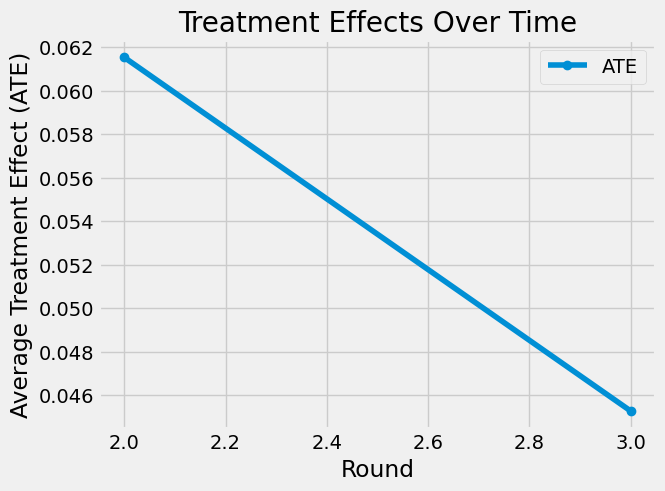

In [ ]:
import pandas as pd

# Store results for visualization
results = []
for round_num in post_treatment_rounds:
    round_data = df_fe2[df_fe2["round"] == round_num]
    Y1 = (round_data.query("type == 1")["lnpart5revenue"] * round_data.query("type == 1")["weight_t"]).sum() / round_data["weight_t"].sum()
    Y0 = (round_data.query("type == 0")["lnpart5revenue"] * round_data.query("type == 0")["weight_nt"]).sum() / round_data["weight_nt"].sum()
    ATE = Y1 - Y0
    results.append({"Round": round_num, "Treated": Y1, "Untreated": Y0, "ATE": ATE})

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Plot ATE over rounds
plt.plot(results_df["Round"], results_df["ATE"], marker="o", label="ATE")
plt.xlabel("Round")
plt.ylabel("Average Treatment Effect (ATE)")
plt.title("Treatment Effects Over Time")
plt.legend()
plt.show()


In [ ]:
data_ps.value_counts()

interpost  inter4post  lnpart5revenue  propensity_score
0.0        0.0         5.703783        0.024991            184
                       5.298317        0.024991            144
                       5.991465        0.024991            131
                       5.480639        0.024991            113
                       5.886104        0.024991            104
                                                          ... 
                       6.244943        0.024991              1
                       6.244866        0.024991              1
                       6.243546        0.024991              1
                       6.242048        0.024991              1
1.0        1.0         8.090403        0.933007              1
Name: count, Length: 5548, dtype: int64

In [ ]:
from joblib import Parallel, delayed # for parallel processing

# define function that computes the IPTW estimator
def run_ps(df, X, T, y):
    # estimate the propensity score
    ps = LogisticRegression(C=1e6, max_iter=1000).fit(df[X], df[T]).predict_proba(df[X])[:, 1]

    weight = (df[T]-ps) / (ps*(1-ps)) # define the weights
    return np.mean(weight * df[y]) # compute the ATE

np.random.seed(88)
# run 1000 bootstrap samples
bootstrap_sample = 1000
# run 1000 bootstrap samples
ates = Parallel(n_jobs=4)(delayed(run_ps)(df_fe2.sample(frac=1, replace=True), X, T, Y)
                          for _ in range(bootstrap_sample))
ates = np.array(ates)

In [ ]:
import statsmodels.formula.api as smf
smf.ols("lnpart5revenue ~ type + propensity_score", data=data_ps).fit().summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,5.6052,0.116,48.286,0.000,5.378,5.833
type,0.0083,0.032,0.260,0.795,-0.054,0.071
propensity_score,-0.3052,0.256,-1.190,0.234,-0.808,0.198


In [ ]:
!pip install causalinference

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.1/51.1 kB 2.1 MB/s eta 0:00:00


In [ ]:
from causalinference import CausalModel

In [ ]:
cm = CausalModel(
    Y=data_ps["lnpart5revenue"].values,
    D=data_ps["type"].values,
    X=data_ps[["propensity_score"]].values
)

cm.est_via_matching(matches=1, bias_adj=True)

print(cm.estimates)

/usr/local/lib/python3.10/dist-packages/causalinference/estimators/matching.py:100: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  return np.linalg.lstsq(X, Y)[0][1:]  # don't need intercept coef



Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE     -0.017      0.048     -0.345      0.730     -0.111      0.077
           ATC     -0.035      0.054     -0.643      0.520     -0.140      0.071
           ATT      0.005      0.055      0.098      0.922     -0.102      0.113



## S, T, X Learners

In [51]:
#!pip install scikit-learn -q

In [41]:
from copy import deepcopy

import numpy as np
import pandas as pd
from scipy import stats

from sklearn.metrics import mean_absolute_percentage_error
!pip install dowhy -q
import dowhy
from dowhy import CausalModel

from sklearn.linear_model import LinearRegression, LogisticRegression, LassoCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

from lightgbm import LGBMRegressor, LGBMClassifier

import networkx as nx

from tqdm import tqdm

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import graphviz

In [85]:
data = df_fe.reset_index().copy()

In [43]:
nodes = ['interpost', 'inter4post', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor']
edges = [
    # Treatment effects
    ('interpost', 'lnpart5revenue'),  # Access to finance affects revenue
    ('interpost', 'total_profit'),    # Access to finance affects total profit
    ('interpost', 'lnwage_cost'),     # Access to finance affects wage cost
    ('interpost', 'lnlabor'),         # Access to finance affects labor

    # Competitor influence
    ('inter4post', 'interpost'),      # Share of competitors treated affects access to finance
    ('inter4post', 'lnpart5revenue'), # Share of competitors treated affects revenue
    ('inter4post', 'total_profit'),   # Share of competitors treated affects profit

    # Firm characteristics
    ('firmage', 'interpost'),         # Firm age affects access to finance

    # Interactions between labor and outcomes
    ('lnwage_cost', 'lnpart5revenue'), # Wage cost impacts revenue
    ('lnwage_cost', 'total_profit'),   # Wage cost impacts profit

    ('lnlabor', 'lnpart5revenue'),     # Labor impacts revenue
    ('lnlabor', 'total_profit')        # Labor impacts profit
]


gml_string = 'graph [directed 1\n'

for node in nodes:
    gml_string += f'\tnode [id "{node}" label "{node}"]\n'

for edge in edges:
    gml_string += f'\tedge [source "{edge[0]}" target "{edge[1]}"]\n'

gml_string += ']'

In [44]:
import pandas as pd
from sklearn.impute import SimpleImputer


imputer = SimpleImputer(strategy='mean')
data['lnpart5revenue'] = imputer.fit_transform(data[['lnpart5revenue']])


model = CausalModel(
    data=data,
    treatment='interpost',
    outcome='lnpart5revenue',
    effect_modifiers='inter4post',
    graph=gml_string
)



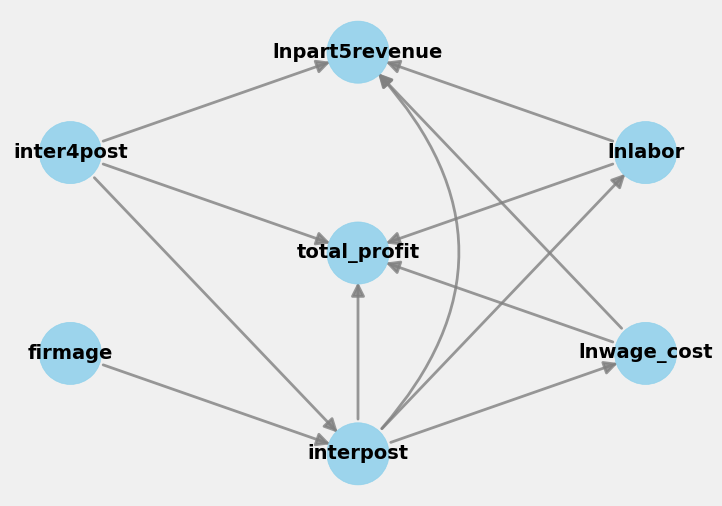

In [ ]:
model.view_model()

In [45]:
# Get the estimand
estimand = model.identify_effect()

print(estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                                    
────────────(E[lnpart5revenue|inter4post])
d[interpost]                              
Estimand assumption 1, Unconfoundedness: If U→{interpost} and U→lnpart5revenue then P(lnpart5revenue|interpost,inter4post,U) = P(lnpart5revenue|interpost,inter4post)

### Estimand : 2
Estimand name: iv
Estimand expression:
 ⎡                                                    -1⎤
 ⎢    d                      ⎛    d                  ⎞  ⎥
E⎢──────────(lnpart5revenue)⋅⎜──────────([interpost])⎟  ⎥
 ⎣d[firmage]                 ⎝d[firmage]             ⎠  ⎦
Estimand assumption 1, As-if-random: If U→→lnpart5revenue then ¬(U →→{firmage})
Estimand assumption 2, Exclusion: If we remove {firmage}→{interpost}, then ¬({firmage}→lnpart5revenue)

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [46]:
estimate = model.estimate_effect(
    identified_estimand=estimand,
    method_name='backdoor.econml.metalearners.SLearner',
    target_units='ate',
    method_params={
        'init_params': {
            'overall_model': LGBMRegressor(n_estimators=500, max_depth=10)
        },
        'fit_params': {}
    })

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 3
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [47]:
estimate.cate_estimates.mean()

0.3377939227435154

In [ ]:
refutation = model.refute_estimate(
    estimand=estimand,
    estimate=estimate,
    method_name='random_common_cause')

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 9519, number of used features: 4
[LightGBM] [Info] Start training from score 5.495628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [ ]:
print(refutation)

Refute: Add a random common cause
Estimated effect:0.3377939227435154
New effect:0.3138421470400252
p value:0.28



In [ ]:
#  predictions
effect_pred = model.causal_estimator.effect(data.drop(['true_effect', 'took_a_course'], axis=1))

#  true effect
effect_true = earnings_interaction_test['true_effect'].values

In [ ]:
# (T-Learner)
estimate = model.estimate_effect(
    identified_estimand=estimand,
    method_name='backdoor.econml.metalearners.TLearner',
    target_units='ate',
    method_params={
        'init_params': {
            'models': [
                LGBMRegressor(n_estimators=200, max_depth=10),
                LGBMRegressor(n_estimators=200, max_depth=10)
            ]
        },
        'fit_params': {}
    })

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 6647, number of used features: 1
[LightGBM] [Info] Start training from score 5.477474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [ ]:
estimate.cate_estimates.mean()

0.32989711636346214

In [48]:
# X-Learner
estimate = model.estimate_effect(
    identified_estimand=estimand,
    method_name='backdoor.econml.metalearners.XLearner',
    target_units='ate',
    method_params={
        'init_params': {
            'models': [
                LGBMRegressor(n_estimators=50, max_depth=10),
                LGBMRegressor(n_estimators=50, max_depth=10)
            ],
            'cate_models': [
                LGBMRegressor(n_estimators=50, max_depth=10),
                LGBMRegressor(n_estimators=50, max_depth=10)
            ]
        },
        'fit_params': {},
    })

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 6647, number of used features: 1
[LightGBM] [Info] Start training from score 5.477474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [ ]:
estimate.cate_estimates.mean()

0.31464566710398356

In [86]:
loanmain_df3['interpost'] = loanmain_df3['type']*loanmain_df3['post']

In [87]:
df_fe2 = loanmain_df3.dropna(subset=['lnwage_cost'])
df_fe2 = df_fe2[['interpost', 'lnpart5revenue', 'total_profit', 'lnwage_cost', 'lnlabor', 'firmid', 'intensity']]
df_fe2.describe()

,interpost,lnpart5revenue,total_profit,lnwage_cost,lnlabor,firmid
count,3167.0,3167.000000,3167.000000,3167.000000,3167.000000,3.167000e+03
mean,0.0,5.460035,51.291916,2.680837,1.965446,9.736776e+08
std,0.0,0.827673,67.823181,0.811549,0.739103,9.679209e+09
min,0.0,2.085672,-152.000000,-0.693147,0.000000,1.110000e+02
25%,0.0,5.192957,19.165000,2.274186,1.609438,2.225750e+04
50%,0.0,5.634789,39.320000,2.785011,2.079442,3.421900e+04
75%,0.0,5.913503,66.825001,3.178054,2.484907,3.301302e+07
max,0.0,9.104980,1407.000000,5.470589,3.912023,9.993302e+10


In [88]:
from sklearn.model_selection import train_test_split
train_ids, test_ids = train_test_split(
    df_fe2['firmid'].unique(),
    test_size=0.2,
    random_state=42,
    stratify=df_fe2[['firmid', 'intensity']].drop_duplicates()['intensity']
)


In [89]:
df_fe2 = df_fe.dropna(subset=['lnwage_cost'])
df_fe2 = df_fe2[['interpost', 'lnpart5revenue', 'total_profit', 'lnwage_cost', 'lnlabor', 'firmid', 'intensity']]
df_fe2 = df_fe2.dropna(subset=['firmid'])

df_fe2['firmid'].unique()


array([1.11000000e+02, 1.12000000e+02, 1.13000000e+02, ...,
       9.99330221e+10, 9.99330221e+10, 9.99330221e+10])

In [90]:
# make train split for cumul gain
train = df_fe2[df_fe2['firmid'].isin(train_ids)]  # Include all periods for training firms
test = df_fe2[df_fe2['firmid'].isin(test_ids)]    # Include all periods for testing firms


print("Train set treatment distribution:")
print(train['intensity'].value_counts(normalize=True))
print("\nTest set treatment distribution:")
print(test['intensity'].value_counts(normalize=True))

Train set treatment distribution:
intensity
T80             0.412435
Pure Control    0.308808
C80             0.119171
C50             0.081865
T50             0.077720
Name: proportion, dtype: float64

Test set treatment distribution:
intensity
Pure Control    0.395455
T80             0.336364
C80             0.150000
C50             0.063636
T50             0.054545
Name: proportion, dtype: float64


In [91]:
from sklearn.linear_model import LogisticRegression


T = 'interpost'  # treatment variable
Y = 'lnpart5revenue'  # outcome variable
X = df_fe2.columns.drop([T, Y])
X2 = df_fe2.columns.drop([Y, 'intensity','firmid'])

In [123]:
combined = X2
print(combined)

Index(['interpost', 'total_profit', 'lnwage_cost', 'lnlabor'], dtype='object')


In [114]:
from lightgbm import LGBMRegressor

np.random.seed(123)
s_learner = LGBMRegressor(max_depth=3, min_child_samples=30)
s_learner.fit(train[X2], train[Y]);

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 6888, number of used features: 4
[LightGBM] [Info] Start training from score 5.492176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [115]:
s_learner_cate_train = (s_learner.predict(train[X2].assign(**{T: 1})) -
                        s_learner.predict(train[X2].assign(**{T: 0})))

s_learner_cate_test = test.assign(
    cate=(s_learner.predict(test[X2].assign(**{T: 1})) - # predict under treatment
          s_learner.predict(test[X2].assign(**{T: 0}))) # predict under control
)

ate_test = s_learner_cate_test['cate'].mean()
print(f"ATE (Test): {ate_test}")



ATE (Test): 0.00774232592492666


In [60]:

from toolz import curry

@curry
def elast(data, y, t):
    return (np.sum((data[t] - data[t].mean())*(data[y] - data[y].mean())) /
            np.sum((data[t] - data[t].mean())**2))

def cumulative_gain(dataset, prediction, y, t, min_periods=30, steps=100):
    size = dataset.shape[0]
    ordered_df = dataset.sort_values(prediction, ascending=False).reset_index(drop=True)
    n_rows = list(range(min_periods, size, size // steps)) + [size]
    return np.array([elast(ordered_df.head(rows), y, t) * (rows/size) for rows in n_rows])

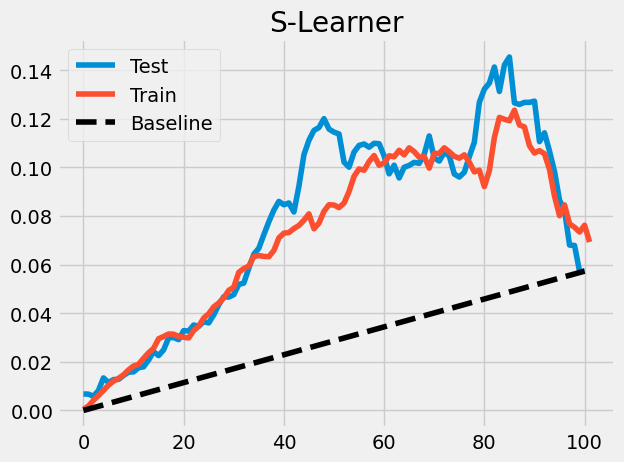

In [118]:

gain_curve_test = cumulative_gain(s_learner_cate_test, "cate", y="lnpart5revenue", t="interpost")
gain_curve_train = cumulative_gain(train.assign(cate=s_learner_cate_train), "cate", y="lnpart5revenue", t="interpost")
plt.plot(gain_curve_test, color="C0", label="Test")
plt.plot(gain_curve_train, color="C1", label="Train")
plt.plot([0, 100], [0, elast(test, "lnpart5revenue", "interpost")], linestyle="--", color="black", label="Baseline")
plt.legend()
plt.title("S-Learner");

In [128]:
np.random.seed(123)

m0 = LGBMRegressor(max_depth=2, min_child_samples=60)
m1 = LGBMRegressor(max_depth=2, min_child_samples=60)

m0.fit(train.query(f"{T}==0")[X2], train.query(f"{T}==0")[Y])
m1.fit(train.query(f"{T}==1")[X2], train.query(f"{T}==1")[Y])

# estimate the CATE
t_learner_cate_train = m1.predict(train[X2]) - m0.predict(train[X2])
t_learner_cate_test = test.assign(cate=m1.predict(test[X2]) - m0.predict(test[X2]))

ate_test = t_learner_cate_test['cate'].mean()
print(f"ATE (Test): {ate_test}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 5.472281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

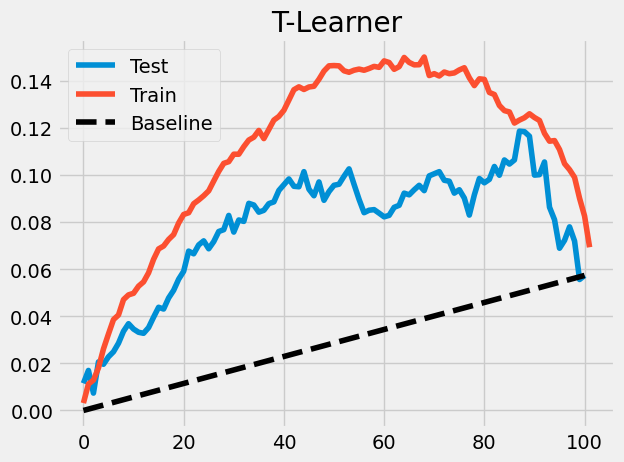

In [130]:
gain_curve_test = cumulative_gain(t_learner_cate_test, "cate", y="lnpart5revenue", t="interpost")
gain_curve_train = cumulative_gain(train.assign(cate=t_learner_cate_train), "cate", y="lnpart5revenue", t="interpost")
plt.plot(gain_curve_test, color="C0", label="Test")
plt.plot(gain_curve_train, color="C1", label="Train")
plt.plot([0, 100], [0, elast(test, "lnpart5revenue", "interpost")], linestyle="--", color="black", label="Baseline")
plt.legend();
plt.title("T-Learner");

In [131]:
from sklearn.linear_model import LogisticRegression

np.random.seed(123)

# first stage models
m0 = LGBMRegressor(max_depth=2, min_child_samples=30)
m1 = LGBMRegressor(max_depth=2, min_child_samples=30)

# propensity score model
g = LogisticRegression(solver="lbfgs", penalty=None)

m0.fit(train.query(f"{T}==0")[X2], train.query(f"{T}==0")[Y])
m1.fit(train.query(f"{T}==1")[X2], train.query(f"{T}==1")[Y])

g.fit(train[X2], train[T]);

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 5.472281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [132]:
d_train = np.where(train[T]==0,
                   m1.predict(train[X2]) - train[Y],
                   train[Y] - m0.predict(train[X2]))

# second stage
mx0 = LGBMRegressor(max_depth=2, min_child_samples=30)
mx1 = LGBMRegressor(max_depth=2, min_child_samples=30)

mx0.fit(train.query(f"{T}==0")[X2], d_train[train[T]==0])
mx1.fit(train.query(f"{T}==1")[X2], d_train[train[T]==1]);

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 0.011560
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [133]:
def ps_predict(df, t):
    return g.predict_proba(df[X2])[:, t]


x_cate_train = (ps_predict(train,1)*mx0.predict(train[X2]) +
                ps_predict(train,0)*mx1.predict(train[X2]))

x_cate_test = test.assign(cate=(ps_predict(test,1)*mx0.predict(test[X2]) +
                                ps_predict(test,0)*mx1.predict(test[X2])))


ate_test = x_cate_test['cate'].mean()
print(f"ATE (Test): {ate_test}")

ATE (Test): 0.0057452869249620874


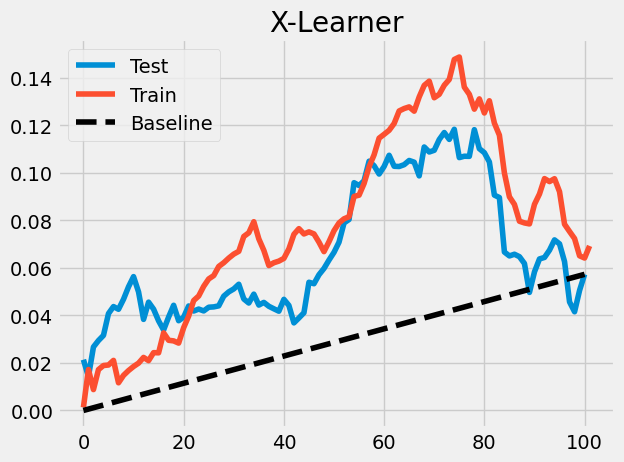

In [134]:
gain_curve_test = cumulative_gain(x_cate_test, "cate", y="lnpart5revenue", t="interpost")
gain_curve_train = cumulative_gain(train.assign(cate=x_cate_train), "cate", y="lnpart5revenue", t="interpost")
plt.plot(gain_curve_test, color="C0", label="Test")
plt.plot(gain_curve_train, color="C1", label="Train")
plt.plot([0, 100], [0, elast(test, "lnpart5revenue", "interpost")], linestyle="--", color="black", label="Baseline")
plt.legend();
plt.title("X-Learner");

Running analysis for outcome: lnpart5revenue

S-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 6888, number of used features: 4
[LightGBM] [Info] Start training from score 5.492176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

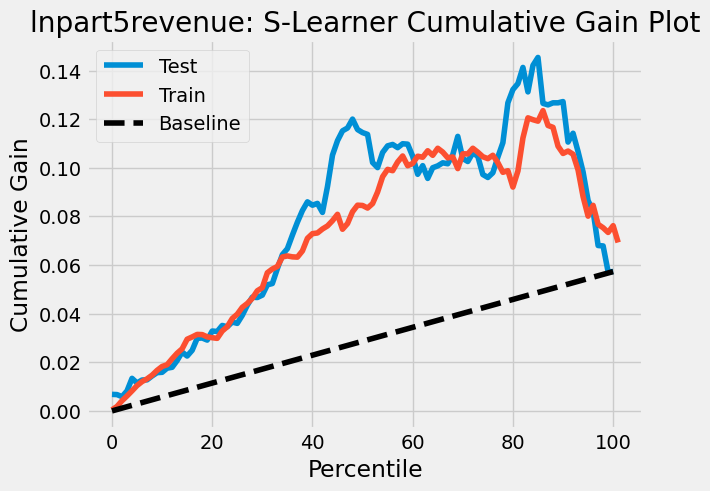


T-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 5.472281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

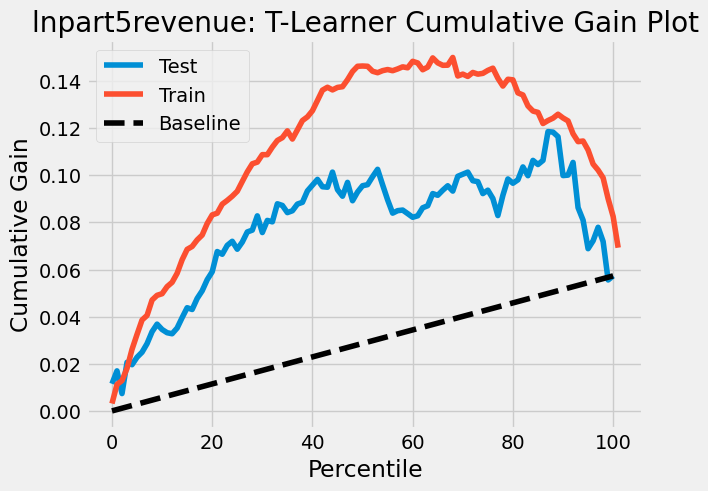


X-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 5.472281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

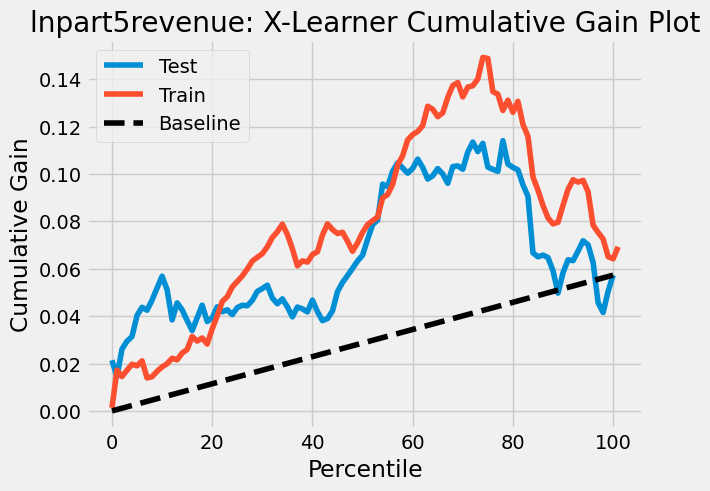

Running analysis for outcome: total_profit

S-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 6888, number of used features: 4
[LightGBM] [Info] Start training from score 55.760054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

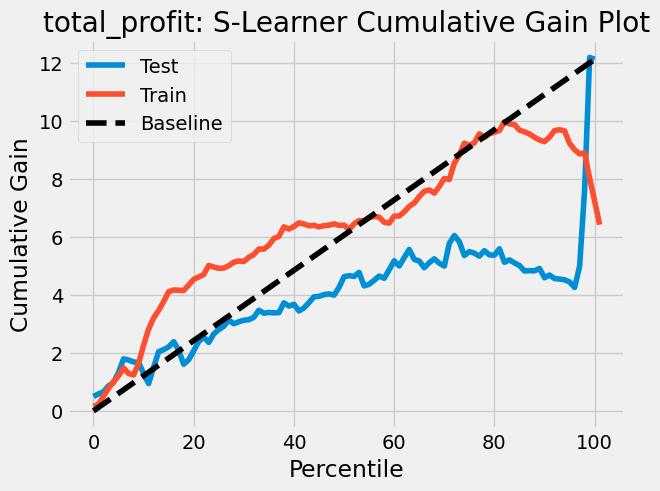


T-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 53.917242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

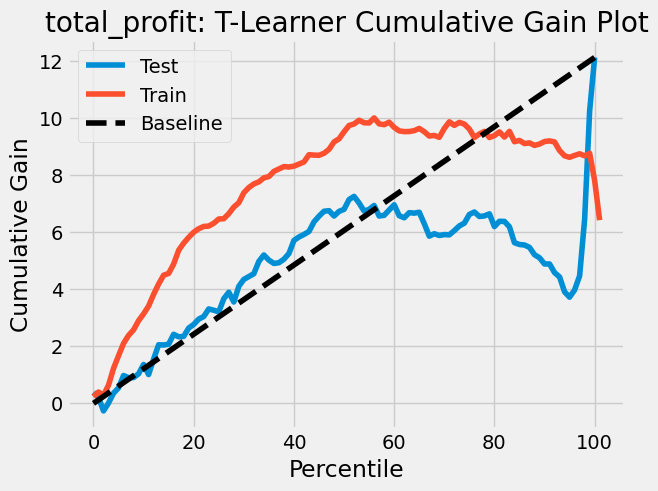


X-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 53.917242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

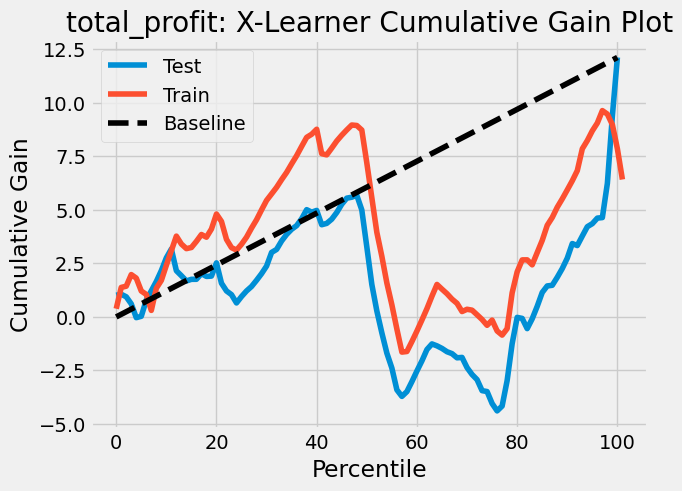

Running analysis for outcome: lnlabor

S-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 767
[LightGBM] [Info] Number of data points in the train set: 6888, number of used features: 4
[LightGBM] [Info] Start training from score 1.994735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

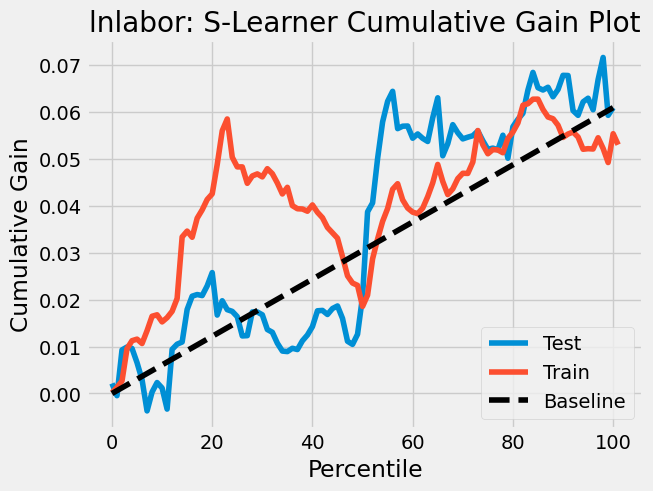


T-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 1.979506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

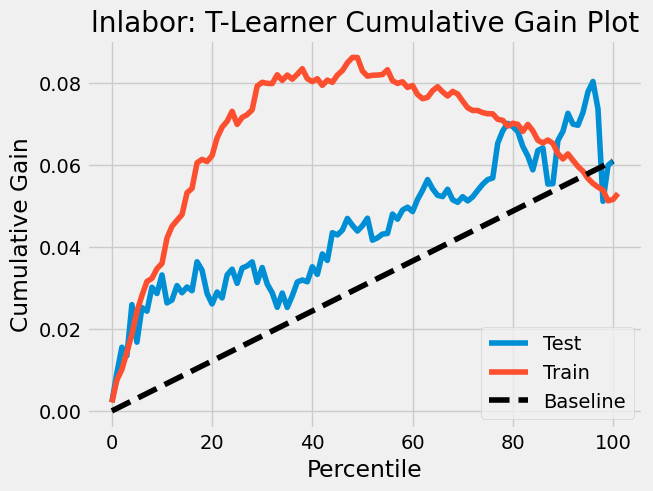


X-Learner...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 4910, number of used features: 3
[LightGBM] [Info] Start training from score 1.979506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

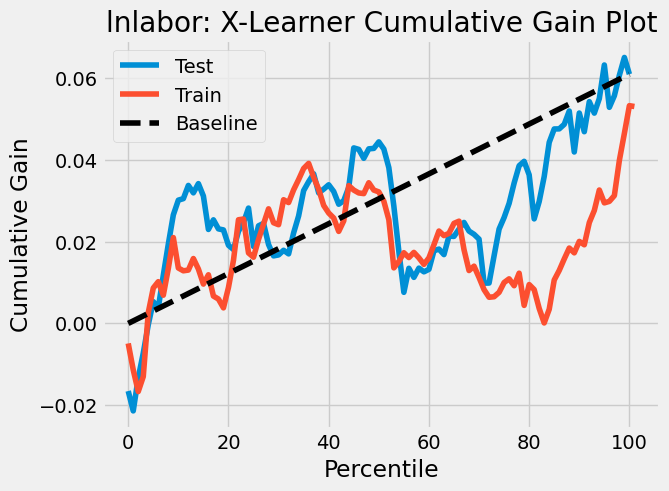


Final Results Summary:

Outcome: lnpart5revenue
  S-Learner ATE: 0.00774232592492666
  T-Learner ATE: 0.00735639923678459
  X-Learner ATE: 0.005656821309487697

Outcome: total_profit
  S-Learner ATE: -0.6121662063601148
  T-Learner ATE: 0.5586778662008115
  X-Learner ATE: 0.43151523934252545

Outcome: lnlabor
  S-Learner ATE: -0.018477764972164808
  T-Learner ATE: -0.020710996499217458
  X-Learner ATE: -0.023417507614904468


In [143]:
#loop for all variables
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMRegressor
import numpy as np
import matplotlib.pyplot as plt


outcomes = ['lnpart5revenue', 'total_profit', 'lnlabor']

results = {}

for Y in outcomes:

    X2 = df_fe2.columns.drop([Y, 'firmid', 'intensity'])

    ## S-Learner
    s_learner = LGBMRegressor(max_depth=3, min_child_samples=30)
    s_learner.fit(train[X2], train[Y])

    s_learner_cate_train = (
        s_learner.predict(train[X2].assign(**{'interpost': 1})) -
        s_learner.predict(train[X2].assign(**{'interpost': 0}))
    )
    s_learner_cate_test = test.assign(
        cate=s_learner.predict(test[X2].assign(**{'interpost': 1})) -
             s_learner.predict(test[X2].assign(**{'interpost': 0}))
    )

    ate_s_test = s_learner_cate_test['cate'].mean()
    print(f"S-Learner ATE (Test): {ate_s_test}")
    results[Y] = {'S-Learner': ate_s_test}

    # Plot for S-Learner
    gain_curve_test = cumulative_gain(s_learner_cate_test, "cate", y=Y, t="interpost")
    gain_curve_train = cumulative_gain(train.assign(cate=s_learner_cate_train), "cate", y=Y, t="interpost")
    plt.figure()
    plt.plot(gain_curve_test, color="C0", label="Test")
    plt.plot(gain_curve_train, color="C1", label="Train")
    plt.plot([0, 100], [0, elast(test, Y, "interpost")], linestyle="--", color="black", label="Baseline")
    plt.legend()
    plt.title(f"{Y}: S-Learner Cumulative Gain Plot")
    plt.xlabel("Percentile")
    plt.ylabel("Cumulative Gain")
    plt.show()

    ## T-Learner

    m0 = LGBMRegressor(max_depth=2, min_child_samples=60)
    m1 = LGBMRegressor(max_depth=2, min_child_samples=60)

    m0.fit(train.query("interpost==0")[X2], train.query("interpost==0")[Y])
    m1.fit(train.query("interpost==1")[X2], train.query("interpost==1")[Y])

    t_learner_cate_train = m1.predict(train[X2]) - m0.predict(train[X2])
    t_learner_cate_test = test.assign(
        cate=m1.predict(test[X2]) - m0.predict(test[X2])
    )

    ate_t_test = t_learner_cate_test['cate'].mean()
    print(f"T-Learner ATE (Test): {ate_t_test}")
    results[Y]['T-Learner'] = ate_t_test

    gain_curve_test = cumulative_gain(t_learner_cate_test, "cate", y=Y, t="interpost")
    gain_curve_train = cumulative_gain(train.assign(cate=t_learner_cate_train), "cate", y=Y, t="interpost")
    plt.figure()
    plt.plot(gain_curve_test, color="C0", label="Test")
    plt.plot(gain_curve_train, color="C1", label="Train")
    plt.plot([0, 100], [0, elast(test, Y, "interpost")], linestyle="--", color="black", label="Baseline")
    plt.legend()
    plt.title(f"{Y}: T-Learner Cumulative Gain Plot")
    plt.xlabel("Percentile")
    plt.ylabel("Cumulative Gain")
    plt.show()

    ## X-Learner
    m0 = LGBMRegressor(max_depth=2, min_child_samples=30)
    m1 = LGBMRegressor(max_depth=2, min_child_samples=30)

    g = LogisticRegression(solver="lbfgs")

    m0.fit(train.query("interpost==0")[X2], train.query("interpost==0")[Y])
    m1.fit(train.query("interpost==1")[X2], train.query("interpost==1")[Y])
    g.fit(train[X2], train['interpost'])

    d_train = np.where(
        train['interpost'] == 0,
        m1.predict(train[X2]) - train[Y],
        train[Y] - m0.predict(train[X2])
    )

    mx0 = LGBMRegressor(max_depth=2, min_child_samples=30)
    mx1 = LGBMRegressor(max_depth=2, min_child_samples=30)

    mx0.fit(train.query("interpost==0")[X2], d_train[train['interpost'] == 0])
    mx1.fit(train.query("interpost==1")[X2], d_train[train['interpost'] == 1])

    def ps_predict(df, t):
        return g.predict_proba(df[X2])[:, t]

    x_cate_train = (
        ps_predict(train, 1) * mx0.predict(train[X2]) +
        ps_predict(train, 0) * mx1.predict(train[X2])
    )
    x_cate_test = test.assign(
        cate=(ps_predict(test, 1) * mx0.predict(test[X2]) +
              ps_predict(test, 0) * mx1.predict(test[X2]))
    )

    ate_x_test = x_cate_test['cate'].mean()
    print(f"X-Learner ATE (Test): {ate_x_test}")
    results[Y]['X-Learner'] = ate_x_test

    # Cumulative Gain Plot for X-Learner
    gain_curve_test = cumulative_gain(x_cate_test, "cate", y=Y, t="interpost")
    gain_curve_train = cumulative_gain(train.assign(cate=x_cate_train), "cate", y=Y, t="interpost")
    plt.figure()
    plt.plot(gain_curve_test, color="C0", label="Test")
    plt.plot(gain_curve_train, color="C1", label="Train")
    plt.plot([0, 100], [0, elast(test, Y, "interpost")], linestyle="--", color="black", label="Baseline")
    plt.legend()
    plt.title(f"{Y}: X-Learner Cumulative Gain Plot")
    plt.xlabel("Percentile")
    plt.ylabel("Cumulative Gain")
    plt.show()

# Final results !!
print("\nFinal Results Summary:")
for outcome, model_results in results.items():
    print(f"\nOutcome: {outcome}")
    for model, ate in model_results.items():
        print(f"  {model} ATE: {ate}")


## Doubly RObust Learners


In [92]:
from sklearn.linear_model import LogisticRegression


T = 'interpost'
Y = 'lnpart5revenue'
X = df_fe2.columns.drop([T, Y, 'intensity','firmid'])
X2 = df_fe2.columns.drop([Y, 'intensity','firmid'])

In [94]:
df_fe2.head()

,interpost,lnpart5revenue,total_profit,lnwage_cost,lnlabor,firmid,intensity
0,0.0,6.111467,87.660004,3.126760,2.484907,111.0,Pure Control
1,1.0,6.427952,128.580002,3.349904,2.708050,111.0,Pure Control
2,1.0,4.010129,16.500000,3.206803,2.564949,111.0,Pure Control
3,0.0,4.382027,27.150000,2.839078,2.197225,112.0,Pure Control
4,1.0,4.342662,29.110001,2.533697,1.945910,112.0,Pure Control


Running DR analysis for outcome: lnpart5revenue
DR ATE: -0.0055688266497391226




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



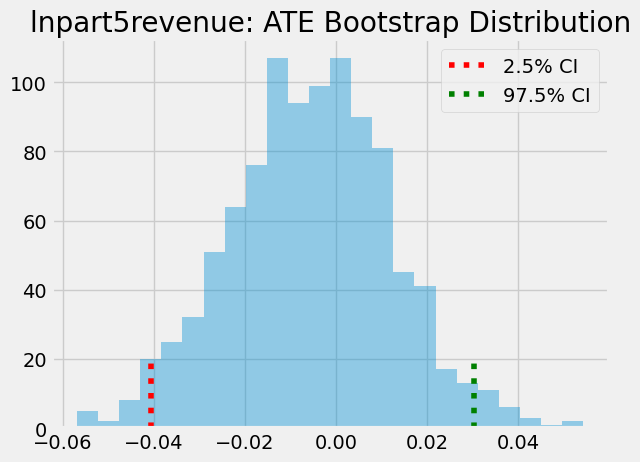

Running DR analysis for outcome: total_profit
DR ATE: 4.09614671119634




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



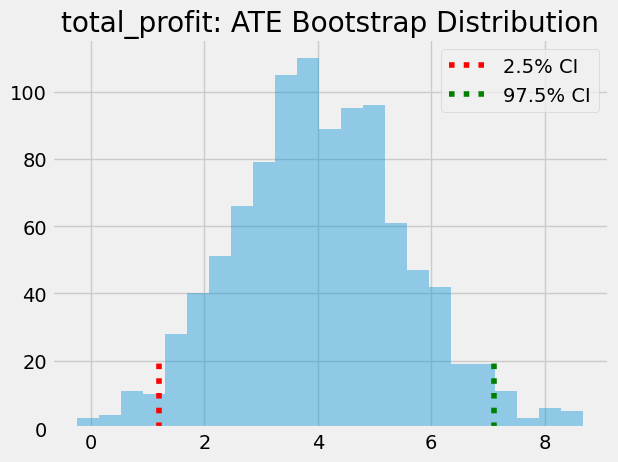

Running DR analysis for outcome: lnlabor
DR ATE: -0.026259921439781175




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



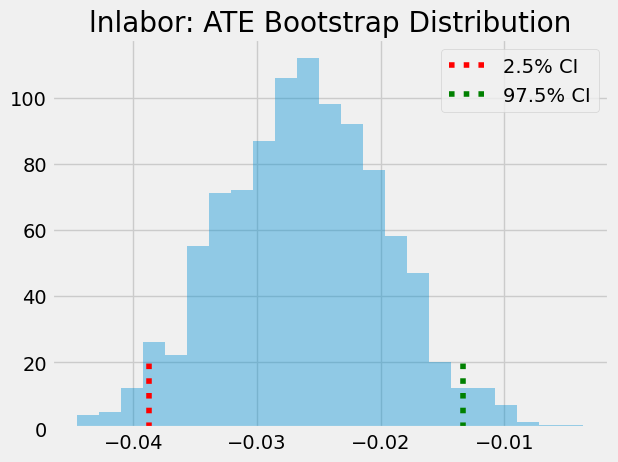


Final DR Results Summary:
Outcome: lnpart5revenue
  ATE: -0.0055688266497391226
  95% CI: (-0.04066326517610921, 0.030236059541444166)
Outcome: total_profit
  ATE: 4.09614671119634
  95% CI: (1.198685590412127, 7.1150766530928315)
Outcome: lnlabor
  ATE: -0.026259921439781175
  95% CI: (-0.03871481673750547, -0.013364688483260183)


In [95]:
from sklearn.linear_model import LogisticRegression, LinearRegression
from joblib import Parallel, delayed
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# doubly robust function
def doubly_robust(df, X, T, Y):
    ps = LogisticRegression(C=1e6, max_iter=1000).fit(df[X], df[T]).predict_proba(df[X])[:, 1]
    mu0 = LinearRegression().fit(df.query(f"{T}==0")[X], df.query(f"{T}==0")[Y]).predict(df[X])
    mu1 = LinearRegression().fit(df.query(f"{T}==1")[X], df.query(f"{T}==1")[Y]).predict(df[X])

    return (
        np.mean(df[T] * (df[Y] - mu1) / ps + mu1) -
        np.mean((1 - df[T]) * (df[Y] - mu0) / (1 - ps) + mu0)
    )

outcomes = ['lnpart5revenue', 'total_profit', 'lnlabor']
T = 'interpost'

# Initialize results storage
results = {}

for Y in outcomes:
    print(f"Running DR analysis for outcome: {Y}")
    X = df_fe2.columns.drop([T, Y, 'firmid', 'intensity'])
    # Calculate ATE
    dr_ate = doubly_robust(df_fe2, X, T, Y)
    print(f"DR ATE: {dr_ate}")

    # Bootstrap for confidence intervals
    np.random.seed(88)
    bootstrap_samples = 1000
    ates = Parallel(n_jobs=4)(
        delayed(doubly_robust)(df_fe2.sample(frac=1, replace=True), X, T, Y)
        for _ in range(bootstrap_samples)
    )
    ci_low, ci_high = np.percentile(ates, [2.5, 97.5])

    # Store results
    results[Y] = {'ATE': dr_ate, 'CI': (ci_low, ci_high)}

    # Plot ATE bootstrap distribution
    sns.distplot(ates, kde=False)
    plt.vlines(ci_low, 0, 20, linestyles="dotted", label="2.5% CI", color="red")
    plt.vlines(ci_high, 0, 20, linestyles="dotted", label="97.5% CI", color="green")
    plt.title(f"{Y}: ATE Bootstrap Distribution")
    plt.legend()
    plt.show()

# final results!
print("\nFinal DR Results Summary:")
for outcome, values in results.items():
    print(f"Outcome: {outcome}")
    print(f"  ATE: {values['ATE']}")
    print(f"  95% CI: {values['CI']}")


In [54]:
# Helper imports
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import pandas as pd

In [55]:
!pip install econml -q

In [164]:
#!pip uninstall scikit-learn -y


Found existing installation: scikit-learn 1.5.0
Uninstalling scikit-learn-1.5.0:
  Successfully uninstalled scikit-learn-1.5.0


In [1]:
#!pip install scikit-learn==1.2.2

Traceback (most recent call last):
  File "/usr/local/bin/pip3", line 5, in <module>
    from pip._internal.cli.main import main
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/main.py", line 11, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/main_parser.py", line 9, in <module>
    from pip._internal.build_env import get_runnable_pip
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/build_env.py", line 19, in <module>
    from pip._internal.cli.spinners import open_spinner
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/spinners.py", line 9, in <module>
    from pip._internal.utils.logging import get_indentation
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/util

In [2]:
!pip install econml


In [1]:
from sklearn.linear_model import LassoCV
from econml.dr import LinearDRLearner
from sklearn.dummy import DummyClassifier

In [75]:
from sklearn.linear_model import LogisticRegression

# Specify treatment and outcome variables
T = 'type'  # Replace with your actual treatment variable
Y = 'lnpart5revenue'  # Replace with your actual outcome variable
X = df_fe2.columns.drop([T, Y])  # Replace 'firmid' with any ID variable you have

# Fit logistic regression to estimate propensity scores
ps_model = LogisticRegression(C=1e6, max_iter=1000).fit(df_fe2[X], df_fe2[T])

# Add propensity scores to the data
data_ps = df_fe2.assign(propensity_score=ps_model.predict_proba(df_fe2[X])[:, 1])

data_ps[[T, Y, "propensity_score"]].head()


,type,lnpart5revenue,propensity_score
0,1.0,6.111467,0.465007
1,1.0,6.427952,0.467727
2,1.0,4.010129,0.465983
3,1.0,4.382027,0.444169
4,1.0,4.342662,0.441133


In [72]:
df_fe2 = df_fe.dropna(subset=['lnwage_cost']).reset_index()

In [74]:
df_fe2 = df_fe2[['type', 'lnpart5revenue', 'retail', 'lnlabor']]

In [76]:
# Calculate the median firm size to split into "Small" and "Large" groups
median_labor = df_fe2['lnlabor'].median()
df_fe2['size_group'] = np.where(df_fe2['lnlabor'] >= median_labor, 'Large', 'Small')

# Define 'industry_group' based on retail indicator
df_fe2['industry_group'] = np.where(df_fe2['retail'] == 1, 'Retail', 'Non-Retail')

# Combine size and industry type into a single 'group' column
df_fe2['group'] = df_fe2['size_group'] + '-' + df_fe2['industry_group']


In [ ]:
# One-hot encode the groups
#df_fe2 = pd.get_dummies(df_fe2, columns=['group'], drop_first=False)  # This creates a separate column for each group

# Extract the list of group dummy variable names
#group_features = [col for col in df_fe2.columns if col.startswith('group_')]


In [77]:
group_dummies = pd.get_dummies(df_fe2['group'], prefix='group')
group_dummies.head()

,group_Large-Non-Retail,group_Large-Retail,group_Small-Non-Retail,group_Small-Retail
0,False,True,False,False
1,False,True,False,False
2,False,True,False,False
3,True,False,False,False
4,False,False,True,False


In [ ]:
df_fe2.head()

,interpost,lnpart5revenue,retail,lnlabor,size_group,industry_group,group
0,0.0,6.111467,1.0,2.484907,Large,Retail,Large-Retail
1,1.0,6.427952,1.0,2.708050,Large,Retail,Large-Retail
2,1.0,4.010129,1.0,2.564949,Large,Retail,Large-Retail
3,0.0,4.382027,0.0,2.197225,Large,Non-Retail,Large-Non-Retail
4,1.0,4.342662,0.0,1.945910,Small,Non-Retail,Small-Non-Retail


In [78]:
# Assuming 'data' is your DataFrame containing the dataset

# Define the outcome variable (Y)
Y = df_fe2['lnpart5revenue'].values  # Replace 'lnpart5revenue' with the actual column name

# Define the treatment variable (T)
T = df_fe2['type'].values  # Replace 'type' with the actual treatment column name

# Define the covariates (X)
# Include only relevant covariates, replace with actual column names in your dataset
X = np.hstack([group_dummies.values, df_fe2[['lnlabor', 'retail']].values])


In [79]:
est = LinearDRLearner(
    model_regression=LassoCV(cv=3),  # Outcome model
    model_propensity=DummyClassifier(strategy='prior')  # Propensity model
)

# Fit the model
est.fit(Y, T, X=X)

# Calculate the Average Treatment Effect (ATE)
ate = est.ate(X)
print("Average Treatment Effect (ATE):", ate)

Model LassoCV(cv=3) has a non-default cv attribute, which will be ignored


Average Treatment Effect (ATE): 0.013328166656979189


Co-variance matrix is underdetermined. Inference will be invalid!


In [80]:
cate = est.effect(X)

# Display the first few CATE estimates
print("CATE estimates for the first few observations:", cate[:5])

CATE estimates for the first few observations: [ 0.04442555  0.04930471  0.04617573 -0.04673586 -0.02445662]


In [81]:
cate_lower, cate_upper = est.effect_interval(X, alpha=0.05)

# Display the first few confidence intervals
print("CATE 95% Confidence Intervals for the first few observations:")
for i in range(5):
    print(f"Observation {i+1}: CATE = {cate[i]}, CI = [{cate_lower[i]}, {cate_upper[i]}]")


CATE 95% Confidence Intervals for the first few observations:
Observation 1: CATE = 0.04442554997569939, CI = [-0.0013397361527940424, 0.09019083610419282]
Observation 2: CATE = 0.049304712831149504, CI = [-0.002155374364444282, 0.10076480002674328]
Observation 3: CATE = 0.04617572754342897, CI = [-0.0008693447327983855, 0.09322079981965631]
Observation 4: CATE = -0.046735863696500984, CI = [-0.12231976625094694, 0.028848038857944944]
Observation 5: CATE = -0.024456619345004225, CI = [-0.14073296976161087, 0.09181973107160238]


In [82]:
# Fit the model with the refined X
# Define feature names for plotting
feat_names = list(group_dummies.columns) + ['lnlabor', 'retail']

# Retrieve and plot coefficients as before
point = est.coef_(T=1)
lower, upper = np.array(est.coef__interval(T=1))

import matplotlib.pyplot as plt
import seaborn as sns

yerr = np.zeros((2, point.shape[0]))
yerr[0, :] = point - lower
yerr[1, :] = upper - point

In [ ]:
point
feat_names

['group_Large-Non-Retail',
 'group_Large-Retail',
 'group_Small-Non-Retail',
 'group_Small-Retail',
 'retail',
 'lnlabor']

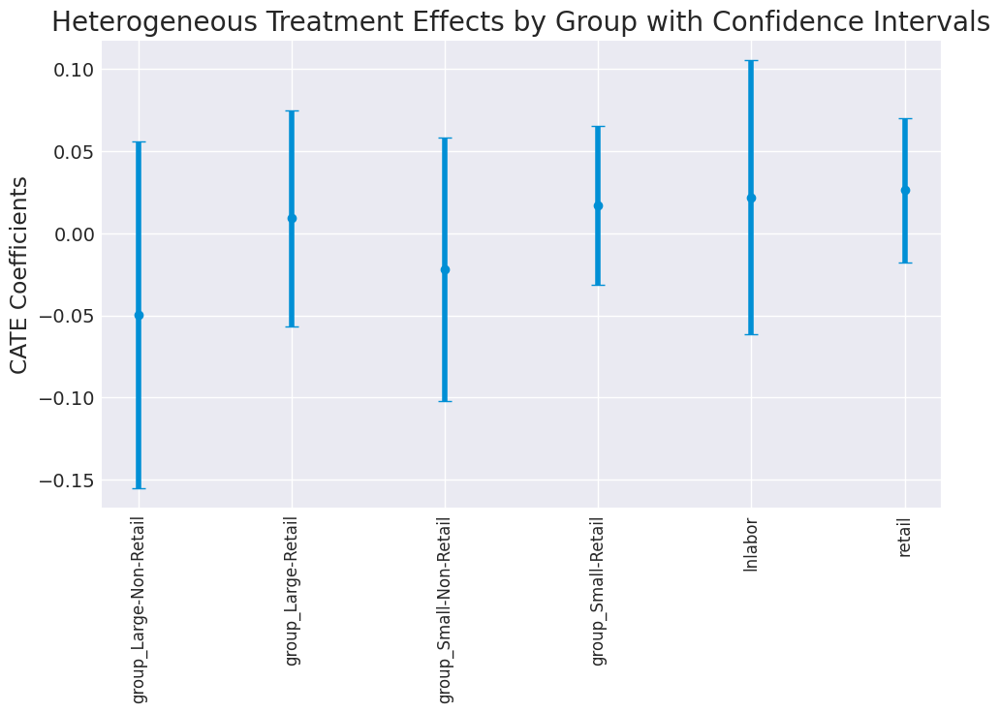

In [83]:
# Plot the coefficients with error bars
with sns.axes_style("darkgrid"):
    fig, ax = plt.subplots(figsize=(10, 6))
    x = np.arange(len(point))
    ax.errorbar(x, point, yerr=yerr, fmt='o', capsize=5)
    ax.set_xticks(x)
    ax.set_xticklabels(feat_names, rotation='vertical', fontsize=12)
    ax.set_ylabel('CATE Coefficients')
    ax.set_title('Heterogeneous Treatment Effects by Group with Confidence Intervals')
    plt.show()

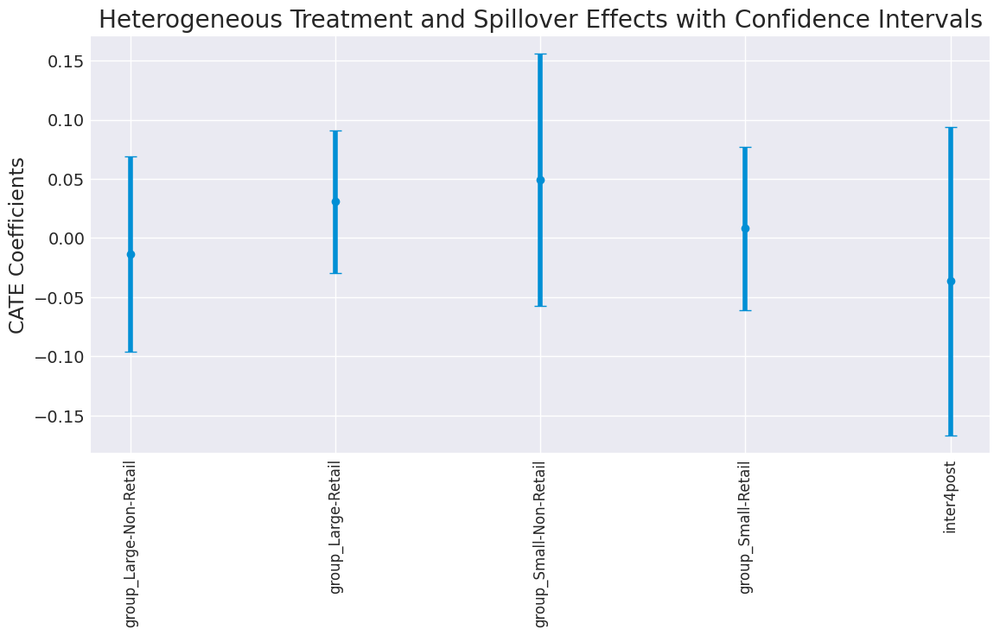

In [ ]:
with sns.axes_style("darkgrid"):
    fig, ax = plt.subplots(figsize=(12, 6))
    x = np.arange(len(point))
    ax.errorbar(x, point, yerr=yerr, fmt='o', capsize=5)
    ax.set_xticks(x)
    ax.set_xticklabels(feat_names, rotation='vertical', fontsize=12)
    ax.set_ylabel('CATE Coefficients')
    ax.set_title('Heterogeneous Treatment and Spillover Effects with Confidence Intervals')
    plt.show()

In [ ]:
# Create the combined 'group' column and generate dummy variables for it
df_fe2['group'] = df_fe2['size_group'] + '-' + df_fe2['industry_group']
group_dummies = pd.get_dummies(df_fe2['group'], prefix='group')

# Create group-specific interaction terms with `inter4post`
for group_col in group_dummies.columns:
    df_fe2[f'{group_col}_inter4post'] = df_fe2['inter4post'] * group_dummies[group_col]

# Define X to include only the interaction terms for each group-specific indirect effect
X = df_fe2[[f'{col}_inter4post' for col in group_dummies.columns]].values


In [ ]:
# Define outcome (Y) and treatment (T)
Y = df_fe2['lnpart5revenue'].values  # Outcome variable
T = df_fe2['interpost'].values       # Treatment variable (handled by the model directly)

# Initialize the DR Learner
est = LinearDRLearner(
    model_regression=LassoCV(cv=3),  # Outcome model
    model_propensity=DummyClassifier(strategy='prior')  # Propensity model
)

# Fit the model with the group-specific indirect effect terms in X
est.fit(Y, T, X=X)


Model LassoCV(cv=3) has a non-default cv attribute, which will be ignored


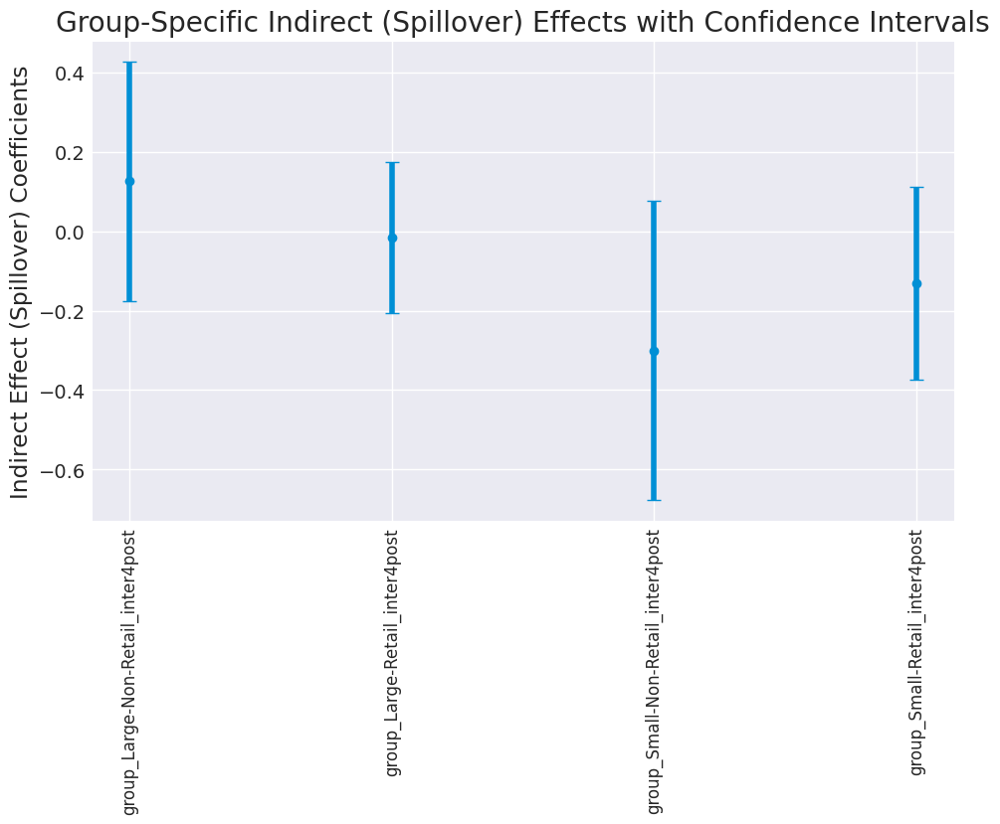

In [ ]:
feat_names = [f'{col}_inter4post' for col in group_dummies.columns]

# Retrieve coefficients and confidence intervals
point = est.coef_(T=1)
lower, upper = np.array(est.coef__interval(T=1))

# Calculate error for error bars
yerr = np.zeros((2, point.shape[0]))
yerr[0, :] = point - lower
yerr[1, :] = upper - point

# Plot with error bars
with sns.axes_style("darkgrid"):
    fig, ax = plt.subplots(figsize=(10, 6))
    x = np.arange(len(point))
    ax.errorbar(x, point, yerr=yerr, fmt='o', capsize=5)
    ax.set_xticks(x)
    ax.set_xticklabels(feat_names, rotation='vertical', fontsize=12)
    ax.set_ylabel('Indirect Effect (Spillover) Coefficients')
    ax.set_title('Group-Specific Indirect (Spillover) Effects with Confidence Intervals')
    plt.show()

In [ ]:
# Create the combined 'group' column and generate dummy variables for it
df_fe2['group'] = df_fe2['size_group'] + '-' + df_fe2['industry_group']
group_dummies = pd.get_dummies(df_fe2['group'], prefix='group')

# Create group-specific interaction terms with `inter4post` for the indirect effect
for group_col in group_dummies.columns:
    df_fe2[f'{group_col}_inter4post'] = df_fe2['inter4post'] * group_dummies[group_col]

# Define X to include both group dummies (for direct effect) and interaction terms (for indirect effect)
X = np.hstack([group_dummies.values, df_fe2[[f'{col}_inter4post' for col in group_dummies.columns]].values])

# Combine feature names for plotting
feat_names_direct = list(group_dummies.columns)  # Names for direct effects
feat_names_indirect = [f'{col}_inter4post' for col in group_dummies.columns]  # Names for indirect effects
feat_names = feat_names_direct + feat_names_indirect


In [ ]:
# Define outcome (Y) and treatment (T)
Y = df_fe2['lnpart5revenue'].values  # Outcome variable
T = df_fe2['interpost'].values       # Treatment variable (handled by the model directly)

# Initialize the DR Learner
est = LinearDRLearner(
    model_regression=LassoCV(cv=3),  # Outcome model
    model_propensity=DummyClassifier(strategy='prior')  # Propensity model
)

# Fit the model with both direct and indirect effect terms in X
est.fit(Y, T, X=X)


Model LassoCV(cv=3) has a non-default cv attribute, which will be ignored
Co-variance matrix is underdetermined. Inference will be invalid!


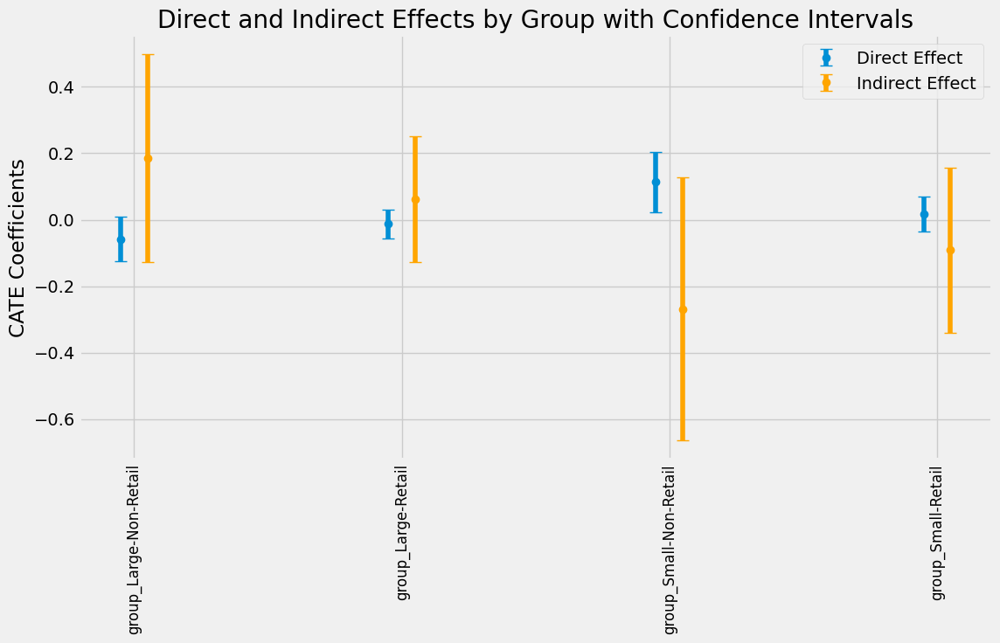

In [ ]:
point = est.coef_(T=1)
lower, upper = np.array(est.coef__interval(T=1))

# Calculate error for error bars
yerr = np.zeros((2, point.shape[0]))
yerr[0, :] = point - lower
yerr[1, :] = upper - point

# Separate direct and indirect effect points for plotting
num_groups = len(feat_names_direct)
point_direct = point[:num_groups]
point_indirect = point[num_groups:]
yerr_direct = yerr[:, :num_groups]
yerr_indirect = yerr[:, num_groups:]

# Plot with error bars for both direct and indirect effects
fig, ax = plt.subplots(figsize=(12, 6))

# Plot direct effects
x_direct = np.arange(len(point_direct))
ax.errorbar(x_direct, point_direct, yerr=yerr_direct, fmt='o', capsize=5, label="Direct Effect")

# Plot indirect effects
x_indirect = x_direct + 0.1  # Offset to avoid overlap
ax.errorbar(x_indirect, point_indirect, yerr=yerr_indirect, fmt='o', capsize=5, color='orange', label="Indirect Effect")

# Set up x-axis labels and title
ax.set_xticks(x_direct + 0.05)  # Center labels between direct and indirect points
ax.set_xticklabels(feat_names_direct, rotation='vertical', fontsize=12)
ax.set_ylabel('CATE Coefficients')
ax.set_title('Direct and Indirect Effects by Group with Confidence Intervals')
ax.legend()

plt.show()

In [ ]:
cate_inference_summary = est.coef__inference(T=1).summary_frame(feature_names=feat_names)

# Display the CATE coefficients summary
print("CATE Coefficients Summary:")
display(cate_inference_summary)

# Get the inference summary for the intercept of the CATE model (for T=1)
intercept_inference_summary = est.intercept__inference(T=1).summary_frame()

# Display the intercept summary
print("\nCATE Intercept Summary:")
display(intercept_inference_summary)

CATE Coefficients Summary:


,point_estimate,stderr,zstat,pvalue,ci_lower,ci_upper
X,,,,,,
group_Large-Non-Retail,-0.024,0.034,-0.720,0.471,-0.091,0.042
group_Large-Retail,0.000,0.022,0.016,0.987,-0.042,0.043
group_Small-Non-Retail,0.088,0.046,1.921,0.055,-0.002,0.178
group_Small-Retail,0.009,0.027,0.344,0.731,-0.043,0.062
group_Large-Non-Retail_inter4post,0.188,0.159,1.181,0.238,-0.124,0.500
group_Large-Retail_inter4post,0.034,0.097,0.349,0.727,-0.156,0.224
group_Small-Non-Retail_inter4post,-0.284,0.201,-1.412,0.158,-0.679,0.110
group_Small-Retail_inter4post,-0.116,0.127,-0.909,0.363,-0.365,0.134



CATE Intercept Summary:


,point_estimate,stderr,zstat,pvalue,ci_lower,ci_upper
X,,,,,,
cate_intercept,0.073,0.015,4.792,0.0,0.043,0.103


In [ ]:
!pip install --upgrade econml

In [ ]:
from econml.dr import LinearDRLearner, ForestDRLearner, SparseLinearDRLearner
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.dummy import DummyClassifier

learners = {
    'LinearDRLearner': LinearDRLearner(model_regression=LassoCV(cv=3), model_propensity=DummyClassifier(strategy='prior')),
    'ForestDRLearner': ForestDRLearner(model_regression=RandomForestRegressor(), model_propensity=DummyClassifier(strategy='prior')),
    'SparseLinearDRLearner': SparseLinearDRLearner(model_regression=LassoCV(cv=3), model_propensity=DummyClassifier(strategy='prior'))
}

results = {}

# Run each learner and store the ATE or CATE results
for name, learner in learners.items():
    # Fit the model
    learner.fit(Y, T, X=X)

    # Calculate the ATE
    ate = learner.ate(X)
    results[name] = ate
    print(f"{name} ATE:", ate)

# Display results for comparison
print("\nATE Results from Different DR Learners:")
for name, ate in results.items():
    print(f"{name}: {ate}")

Model LassoCV(cv=3) has a non-default cv attribute, which will be ignored
Co-variance matrix is underdetermined. Inference will be invalid!


LinearDRLearner ATE: 0.06883606979581781
ForestDRLearner ATE: 0.2904705693203675


Model LassoCV(cv=3) has a non-default cv attribute, which will be ignored


SparseLinearDRLearner ATE: 0.06290302699281501

ATE Results from Different DR Learners:
LinearDRLearner: 0.06883606979581781
ForestDRLearner: 0.2904705693203675
SparseLinearDRLearner: 0.06290302699281501


invalid value encountered in sqrt
invalid value encountered in sqrt


In [ ]:
# Assuming est is your doubly robust model, retrieve the ATE and its confidence intervals
ate = est.ate(X)
ate_lower, ate_upper = est.ate_interval(X)

print("ATE Estimate:", ate)
print("95% Confidence Interval:", (ate_lower, ate_upper))


ATE Estimate: 0.06251586150054073
95% Confidence Interval: (0.02194507839761556, 0.1030866446034659)


##DML

In [127]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd




In [149]:
df_fe2 = df_fe.dropna(subset=['lnwage_cost'])
df_fe2 = df_fe2[['interpost', 'type', 'lnpart5revenue', 'total_profit', 'lnwage_cost', 'lnlabor', 'firmid']]
df_fe2 = df_fe2.dropna(subset=['firmid'])

df_fe2['firmid'].unique()


array([1.11000000e+02, 1.12000000e+02, 1.13000000e+02, ...,
       9.99330221e+10, 9.99330221e+10, 9.99330221e+10])

In [ ]:


# Specify treatment and outcome variables
T = df_fe2['type']  # Replace with your actual treatment variable
Y = df_fe2['lnpart5revenue']  # Replace with your actual outcome variable
X = df_fe2[['total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town']]  # Replace 'firmid' with any ID variable you have

X_train, X_test, Y_train, Y_test, T_train, T_test = train_test_split(
    X, Y, T, test_size=0.3, random_state=42
)


In [ ]:
# Model for outcome (Y)
outcome_model = RandomForestRegressor(n_estimators=100, random_state=42)
outcome_model.fit(X_train, Y_train)

# Model for treatment (T)
treatment_model = RandomForestRegressor(n_estimators=100, random_state=42)
treatment_model.fit(X_train, T_train)


RandomForestRegressor(random_state=42)

In [ ]:
# Predict on the test set
Y_hat = outcome_model.predict(X_test)
T_hat = treatment_model.predict(X_test)

# Compute residuals
Y_residual = Y_test - Y_hat
T_residual = T_test - T_hat


In [ ]:
X_train, X_test, Y_train, Y_test, T_train, T_test = train_test_split(X, Y, T, test_size=0.3, random_state=42)

# Fit outcome and treatment models
outcome_model = LinearRegression()
outcome_model.fit(X_train, Y_train)

treatment_model = LinearRegression()
treatment_model.fit(X_train, T_train)

# Predict residuals
Y_hat = outcome_model.predict(X_test)
T_hat = treatment_model.predict(X_test)

Y_residual = Y_test - Y_hat
T_residual = T_test - T_hat

# Estimate treatment effect
residual_model = LinearRegression()
residual_model.fit(T_residual.values.reshape(-1, 1), Y_residual)

ate_linear = residual_model.coef_[0]
print(f"Linear DML ATE: {ate_linear}")

Linear DML ATE: 0.025109948590397835


In [ ]:
outcome_model_rf = RandomForestRegressor(n_estimators=100, random_state=42)
outcome_model_rf.fit(X_train, Y_train)

treatment_model_rf = RandomForestRegressor(n_estimators=100, random_state=42)
treatment_model_rf.fit(X_train, T_train)

# Predict residuals
Y_hat_rf = outcome_model_rf.predict(X_test)
T_hat_rf = treatment_model_rf.predict(X_test)

Y_residual_rf = Y_test - Y_hat_rf
T_residual_rf = T_test - T_hat_rf

residual_model_rf = LinearRegression()
residual_model_rf.fit(T_residual_rf.values.reshape(-1, 1), Y_residual_rf)  # Fixing the reshape issue

ate_nonlinear = residual_model_rf.coef_[0]
print(f"Non-Linear DML ATE: {ate_nonlinear}")


Non-Linear DML ATE: 0.026203413838856226


In [ ]:
debias_m = LGBMRegressor(max_depth=3)

train_pred = train.assign(price_res =  train[T] -
                          cross_val_predict(debias_m, train[X], train[T], cv=5)
                          + train[T].mean()) # add mu_t for visualization.

In [96]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import cross_val_predict

In [150]:

T = "type"
Y = "lnpart5revenue"
X = df_fe2.columns.drop([Y, T, 'interpost'])    # Shortened list of covariates


# Debias
debias_m = LGBMRegressor(max_depth=3)
df_fe2 = df_fe2.assign(
    interpost_res=df_fe2[T] - cross_val_predict(debias_m, df_fe2[X], df_fe2[T], cv=5) + df_fe2[T].mean()
)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 811
[LightGBM] [Info] Number of data points in the train set: 6881, number of used features: 4
[LightGBM] [Info] Start training from score 0.468391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [154]:
denoise_m = LGBMRegressor(max_depth=3)
df_fe2 = df_fe2.assign(
    lnpart5revenue_res=df_fe2[Y] - cross_val_predict(denoise_m, df_fe2[X], df_fe2[Y], cv=5) + df_fe2[Y].mean()
)

# Final regression
import statsmodels.formula.api as smf

final_model = smf.ols(formula="lnpart5revenue_res ~ interpost_res", data=df_fe2).fit()
print("Linear DML ATE:\n", final_model.summary().tables[1])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 811
[LightGBM] [Info] Number of data points in the train set: 6881, number of used features: 4
[LightGBM] [Info] Start training from score 5.486921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [155]:
# Conditional Average Treatment Effect (CATE) with interaction terms
final_model_cate = smf.ols(
    formula="lnpart5revenue_res ~ interpost_res * (total_profit + lnwage_cost + lnlabor)",
    data=df_fe2
).fit()

print("CATE Model Summary:\n", final_model_cate.summary().tables[1])


CATE Model Summary:
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      5.4355      0.029    184.740      0.000       5.378       5.493
interpost_res                 -0.0026      0.044     -0.058      0.954      -0.089       0.084
total_profit                  -0.0004      0.000     -3.287      0.001      -0.001      -0.000
lnwage_cost                    0.0350      0.028      1.238      0.216      -0.020       0.091
lnlabor                       -0.0290      0.031     -0.943      0.346      -0.089       0.031
interpost_res:total_profit     0.0010      0.000      5.814      0.000       0.001       0.001
interpost_res:lnwage_cost     -0.0149      0.043     -0.349      0.727      -0.099       0.069
interpost_res:lnlabor          0.0142      0.046      0.309      0.757      -0.076       0.104


In [156]:
# Predict treatment effects for the dataset
df_fe2 = df_fe2.assign(
    cate=final_model_cate.predict(df_fe2.assign(interpost_res=1))
    - final_model_cate.predict(df_fe2.assign(interpost_res=0))
)

# Check the CATE predictions
df_fe2[['cate']].head()


,cate
0,0.070830
1,0.110224
2,0.001986
3,0.012546
4,0.015427


In [104]:
import pandas as pd
import numpy as np
from toolz import curry

@curry
def elast(data, y, t):
    return (np.sum((data[t] - data[t].mean())*(data[y] - data[y].mean())) /
            np.sum((data[t] - data[t].mean())**2))

def cumulative_gain(dataset, prediction, y, t, min_periods=30, steps=100):
    size = dataset.shape[0]
    ordered_df = dataset.sort_values(prediction, ascending=False).reset_index(drop=True)
    n_rows = list(range(min_periods, size, size // steps)) + [size]
    return np.array([elast(ordered_df.head(rows), y, t) * (rows/size) for rows in n_rows])

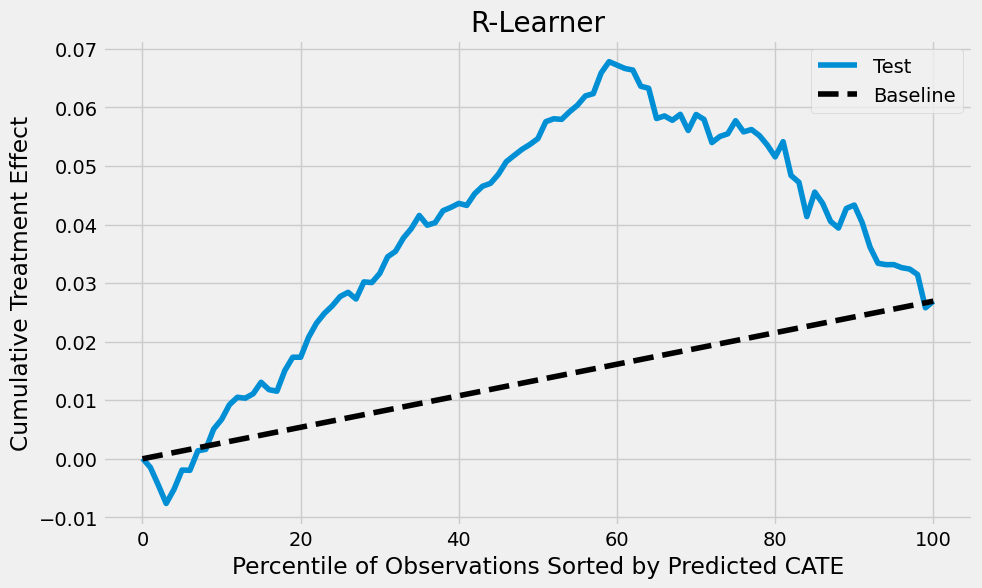

In [157]:
# Calculate cumulative gain using predicted CATE
gain_curve_test = cumulative_gain(
    dataset=df_fe2,
    prediction="cate",
    y="lnpart5revenue",  # Outcome variable
    t="type",  # Treatment variable
    min_periods=30,
    steps=100  # Number of steps in cumulative gain calculation
)

# Baseline elasticity for comparison
baseline_elasticity = elast(df_fe2, y="lnpart5revenue", t="type")

# Plot cumulative gain
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(np.linspace(0, 100, len(gain_curve_test)), gain_curve_test, color="C0", label="Test")
plt.plot([0, 100], [0, baseline_elasticity], linestyle="--", color="black", label="Baseline")
plt.title("R-Learner")
plt.xlabel("Percentile of Observations Sorted by Predicted CATE")
plt.ylabel("Cumulative Treatment Effect")
plt.legend()
plt.show()


In [175]:
y = "lnpart5revenue"  # Outcome
t = "type"  # Treatment
X = ['total_profit', 'lnwage_cost', 'lnlabor', 'firmid']  # Covariates

# Residualize treatment
debias_m = LGBMRegressor(max_depth=3)
df_fe2 = df_fe2.assign(
    treatment_residual=df_fe2[t] - cross_val_predict(debias_m, df_fe2[X], df_fe2[t], cv=5)
)

# Residualize outcome
denoise_m = LGBMRegressor(max_depth=3)
df_fe2 = df_fe2.assign(
    outcome_residual=df_fe2[y] - cross_val_predict(denoise_m, df_fe2[X], df_fe2[y], cv=5))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 811
[LightGBM] [Info] Number of data points in the train set: 6881, number of used features: 4
[LightGBM] [Info] Start training from score 0.468391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [176]:
# Define transformed target and weights
y_star = df_fe2["outcome_residual"] / df_fe2["treatment_residual"]
weights = df_fe2["treatment_residual"] ** 2

# Fit the final model for CATE
cate_model = LGBMRegressor(max_depth=3)
cate_model.fit(X=df_fe2[X], y=y_star, sample_weight=weights)

# Predict CATE for all observations
df_fe2 = df_fe2.assign(cate=cate_model.predict(df_fe2[X]))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 812
[LightGBM] [Info] Number of data points in the train set: 8602, number of used features: 4
[LightGBM] [Info] Start training from score 0.047315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [177]:
# Calculate Average Treatment Effect (ATE) as the mean of predicted CATE
ate_non_param = df_fe2["cate"].mean()
print(f"Non-Parametric DML ATE: {ate_non_param}")


Non-Parametric DML ATE: 0.04273295476244128


In [178]:
# Calculate Average Treatment Effect (ATE) as the mean of predicted CATE
ate_non_param = df_fe2["cate"].mean()
print(f"Non-Parametric DML ATE: {ate_non_param}")

# Summary statistics for CATE
cate_summary = df_fe2["cate"].describe()
print("Summary Statistics for Non-Parametric CATE Predictions:\n", cate_summary)


Non-Parametric DML ATE: 0.04273295476244128
Summary Statistics for Non-Parametric CATE Predictions:
 count    8602.000000
mean        0.042733
std         0.200637
min        -1.245976
25%        -0.046383
50%         0.065380
75%         0.123493
max         1.381545
Name: cate, dtype: float64


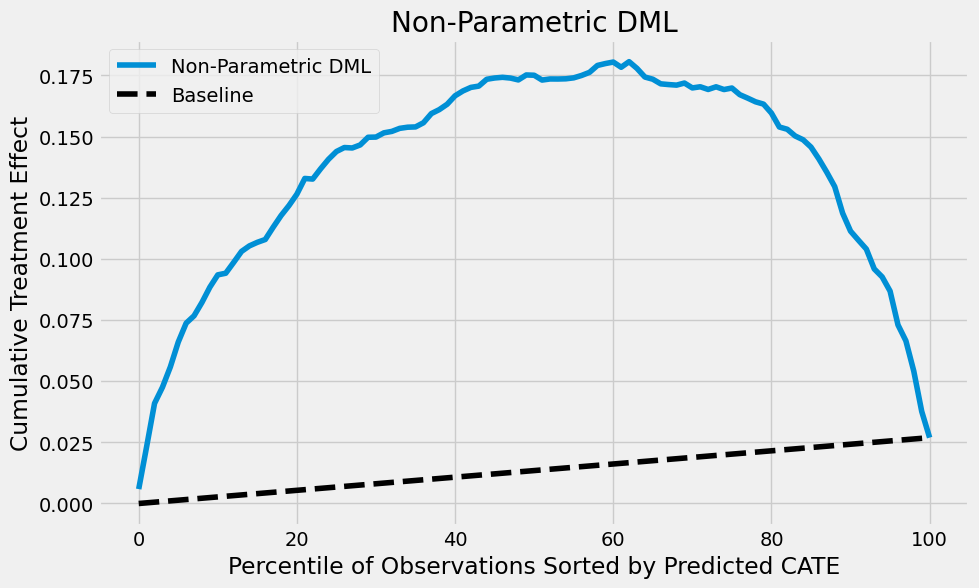

In [179]:
# Calculate cumulative gain using the previously defined function
gain_curve_non_param = cumulative_gain(
    dataset=df_fe2,
    prediction="cate",
    y="lnpart5revenue",
    t="type",
    min_periods=30,
    steps=100
)

# Baseline elasticity for comparison
baseline_elasticity = elast(df_fe2, y="lnpart5revenue", t="type")

# Plot cumulative gain
plt.figure(figsize=(10, 6))
plt.plot(np.linspace(0, 100, len(gain_curve_non_param)), gain_curve_non_param, color="C0", label="Non-Parametric DML")
plt.plot([0, 100], [0, baseline_elasticity], linestyle="--", color="black", label="Baseline")
plt.title("Non-Parametric DML")
plt.xlabel("Percentile of Observations Sorted by Predicted CATE")
plt.ylabel("Cumulative Treatment Effect")
plt.legend()
plt.savefig('non_param_dml.png')
plt.show()


Running DML Analysis for Outcome: lnpart5revenue
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 811
[LightGBM] [Info] Number of data points in the train set: 6881, number of used features: 4
[LightGBM] [Info] Start training from score 0.468391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

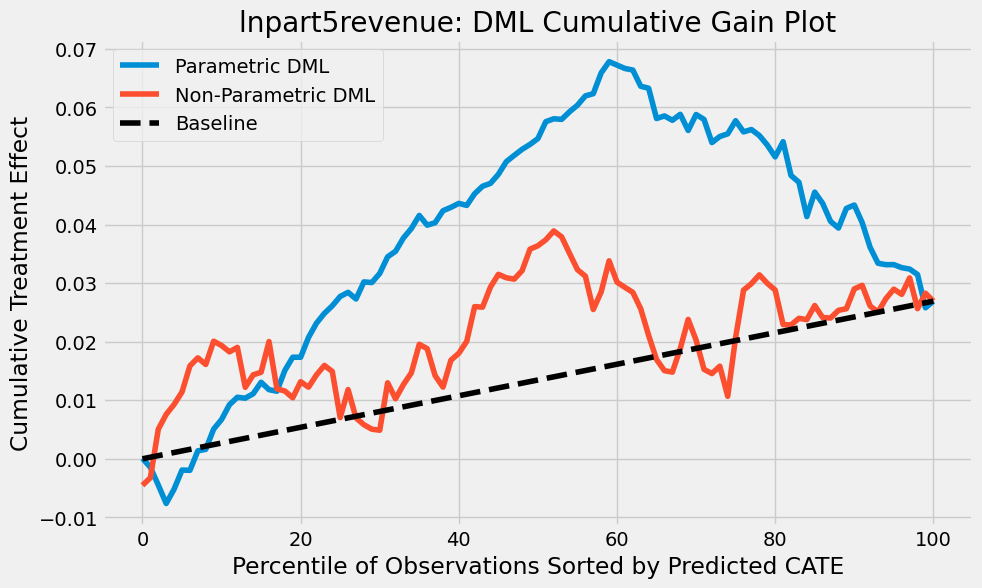

Running DML Analysis for Outcome: total_profit
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 811
[LightGBM] [Info] Number of data points in the train set: 6881, number of used features: 4
[LightGBM] [Info] Start training from score 0.468391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

<Figure size 640x480 with 0 Axes>

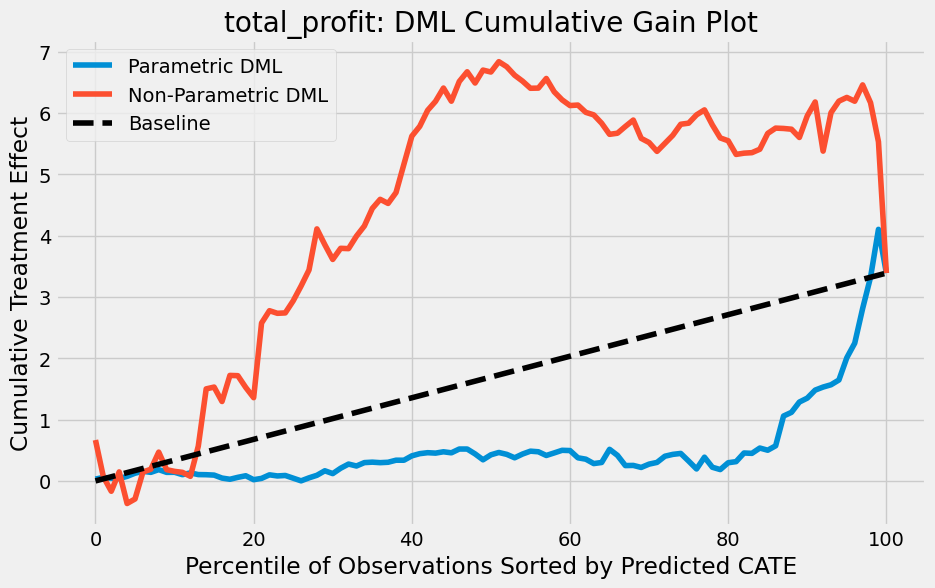

Running DML Analysis for Outcome: lnlabor
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 6881, number of used features: 4
[LightGBM] [Info] Start training from score 0.468391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

<Figure size 640x480 with 0 Axes>

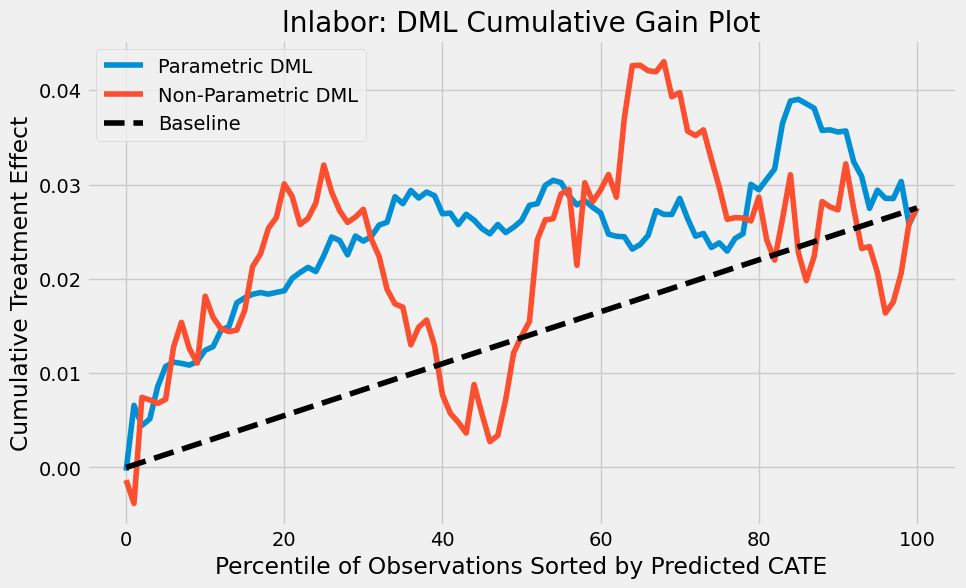


Final DML Results:
lnpart5revenue: {'Parametric ATE': 0.038864681601530095, 'Non-Parametric ATE': 2.9362998658153017}
total_profit: {'Parametric ATE': -3.889275344006253, 'Non-Parametric ATE': 31.02428209962588}
lnlabor: {'Parametric ATE': -0.029781134041737024, 'Non-Parametric ATE': 0.9504835498068562}


<Figure size 640x480 with 0 Axes>

In [183]:
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMRegressor
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import numpy as np

# Specify all outcomes to iterate over
outcomes = ['lnpart5revenue', 'total_profit', 'lnlabor']

# Store results for reporting
results_dml = {}
graphs = {}

# Loop through each outcome
for Y in outcomes:
    df_fe2 = df_fe.dropna(subset=['lnwage_cost'])
    df_fe2 = df_fe2[['interpost', 'type', 'lnpart5revenue', 'total_profit', 'lnwage_cost', 'lnlabor', 'firmid']]
    df_fe2 = df_fe2.dropna(subset=['firmid'])
    print(f"Running DML Analysis for Outcome: {Y}")

    # Covariates for residualization
    X = df_fe2.columns.drop([Y, T, 'interpost'])

    # Step 1: Residualize Treatment
    debias_m = LGBMRegressor(max_depth=3)
    df_fe2 = df_fe2.assign(
        interpost_res=df_fe2['type'] - cross_val_predict(debias_m, df_fe2[X], df_fe2['type'], cv=5)
        + df_fe2['type'].mean()
    )

    # Step 2: Residualize Outcome
    denoise_m = LGBMRegressor(max_depth=3)
    df_fe2 = df_fe2.assign(
        outcome_residual=df_fe2[Y] - cross_val_predict(denoise_m, df_fe2[X], df_fe2[Y], cv=5)
        + df_fe2[Y].mean()
    )

    # Step 3: Parametric DML - Final Model
    final_model = smf.ols(formula="outcome_residual ~ interpost_res", data=df_fe2).fit()
    ate_param = final_model.params['interpost_res']
    print(f"Parametric DML ATE for {Y}: {ate_param}")

    # Step 4: Conditional Average Treatment Effects (CATE)
    final_model_cate = smf.ols(
        formula=f"outcome_residual ~ interpost_res * (total_profit + lnwage_cost + lnlabor)",
        data=df_fe2
    ).fit()

    # Predict CATEs
    df_fe2 = df_fe2.assign(
        cate=final_model_cate.predict(df_fe2.assign(interpost_res=1))
        - final_model_cate.predict(df_fe2.assign(interpost_res=0))
    )

    # Step 5: Non-Parametric DML
    y_star = df_fe2["outcome_residual"] / df_fe2["interpost_res"]
    weights = df_fe2["interpost_res"] ** 2

    cate_model = LGBMRegressor(max_depth=3)
    cate_model.fit(X=df_fe2[X], y=y_star, sample_weight=weights)

    # Predict Non-Parametric CATE and ATE
    df_fe2 = df_fe2.assign(cate_non_param=cate_model.predict(df_fe2[X]))
    ate_non_param = df_fe2["cate_non_param"].mean()
    print(f"Non-Parametric DML ATE for {Y}: {ate_non_param}")

    # Store results
    results_dml[Y] = {
        'Parametric ATE': ate_param,
        'Non-Parametric ATE': ate_non_param
    }

    # Step 6: Cumulative Gain Plot
    gain_curve_param = cumulative_gain(
        dataset=df_fe2,
        prediction="cate",  # Column with predicted parametric CATE
        y=Y,
        t="type",
        min_periods=30,
        steps=100
    )
    gain_curve_non_param = cumulative_gain(
        dataset=df_fe2,
        prediction="cate_non_param",  # Column with predicted non-parametric CATE
        y=Y,
        t="type",
        min_periods=30,
        steps=100
    )
    baseline_elasticity = elast(df_fe2, y=Y, t="type")

    # Visualization
    plt.figure(figsize=(10, 6))
    plt.plot(np.linspace(0, 100, len(gain_curve_param)), gain_curve_param, color="C0", label="Parametric DML")
    plt.plot(np.linspace(0, 100, len(gain_curve_non_param)), gain_curve_non_param, color="C1", label="Non-Parametric DML")
    plt.plot([0, 100], [0, baseline_elasticity], linestyle="--", color="black", label="Baseline")
    plt.title(f"{Y}: DML Cumulative Gain Plot")
    plt.xlabel("Percentile of Observations Sorted by Predicted CATE")
    plt.ylabel("Cumulative Treatment Effect")
    plt.legend()
    plt.show()

    # Store graph for later use
    graphs[Y] = plt.gcf()

# Summary Results
print("\nFinal DML Results:")
for outcome, res in results_dml.items():
    print(f"{outcome}: {res}")


## Generalized Random Forests

In [184]:
from econml.grf import CausalForest, CausalIVForest, RegressionForest
from econml.dml import CausalForestDML
import numpy as np
import scipy.special
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

In [185]:
df_fe2 = df_fe.dropna(subset=['lnwage_cost'])
#df_fe2 = df_fe2[df_fe2['round'] < 2]
#df_fe2 = df_fe2[['type', 'lnpart5revenue', 'total_profit', 'firmage', 'lnwage_cost', 'lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town']]
df_fe2 = df_fe2.dropna(subset=['basecounty'])

In [ ]:
df_fe2['']

Index(['firmid', 'shutdown', 'newproduct', 'gender', 'age',
       'education_college', 'num_clients', 'num_supplier', 'bankloan', 'round',
       ...
       'loanusesum', 'comploanuse', 'baseline', 'midline', 'endline',
       'baseline_firmage', 'baseline_lnwage_cost', 'baseline_lnlabor',
       'baseline_total_profit', 'baseline_lnpart5revenue'],
      dtype='object', length=113)


In [ ]:
#df_fe2 = df_fe2[['baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'baseline_lnlabor', 'lcompnum', 'basecounty', 'retail', 'survey_town', 'interpost_comp1', 'interpostcomp_2']]

In [191]:
# Define covariates
#baseline_covariates = ['baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'baseline_lnlabor', 'lcompnum', '_Ibasecount_2' , '_Ibasecount_3', '_Ibasecount_4', '_Ibasecount_5', '_Ibasecount_6', '_Ibasecount_7', '_Ibasecount_8', '_Ibasecount_9', '_Ibasecount_10', '_Ibasecount_11', 'retail', 'interpost_comp1', 'interpost_comp2']
#baseline_covariates = ['lnpart5revenue', 'lnwage_cost', 'lnlabor', 'lcompnum', '_Ibasecount_2' , '_Ibasecount_3', '_Ibasecount_4', '_Ibasecount_5', '_Ibasecount_6', '_Ibasecount_7', '_Ibasecount_8', '_Ibasecount_9', '_Ibasecount_10', '_Ibasecount_11', 'retail', 'interpost_comp1', 'interpost_comp2']

baseline_covariates = ['endline', 'midline', 'baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'retail']

X = df_fe2[baseline_covariates]

# Define treatment variables (direct and indirect effects)
Z = df_fe2[['interpost', 'inter4post']]

# Define instruments for the treatments
T = df_fe2[['loanuse', 'comploanuse']]

# Define outcome variable
y = df_fe2['lnpart5revenue']


In [187]:
est = CausalIVForest(
    criterion='mse',
    n_estimators=400,
    min_samples_leaf=40,
    min_var_fraction_leaf=0.1,
    min_var_leaf_on_val=True,
    min_impurity_decrease=0.001,
    max_samples=0.45,
    max_depth=None,
    warm_start=False,
    inference=True,
    subforest_size=4,
    honest=True,
    verbose=0,
    n_jobs=-1,
    random_state=123
)


In [188]:
# Fit the Causal IV Forest

est.fit(X, T, y, Z=Z)


CausalIVForest(min_impurity_decrease=0.001, min_samples_leaf=40,
               min_var_fraction_leaf=0.1, min_var_leaf_on_val=True,
               n_estimators=400, random_state=123)

In [189]:
# Predict treatment effects and confidence intervals

point, lb, ub = est.predict(X, interval=True, alpha=0.05)


In [ ]:
print(type(X))


<class 'pandas.core.frame.DataFrame'>


In [ ]:
print(X['lnlabor'].describe())


count    8214.000000
mean        1.992321
std         0.755502
min         0.000000
25%         1.609438
50%         2.079442
75%         2.484907
max         5.075174
Name: lnlabor, dtype: float64


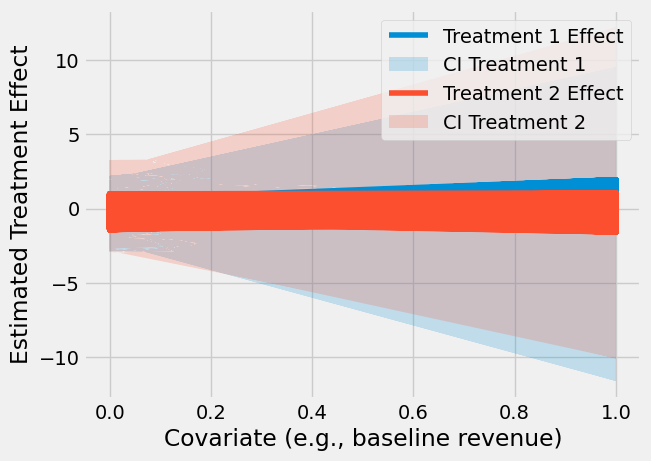

In [ ]:
for t in range(T.shape[1]):  # Iterate over treatments
    plt.plot(X.iloc[:, 0], point[:, t], label=f'Treatment {t + 1} Effect')  # Use first column as x-axis
    plt.fill_between(X.iloc[:, 0], lb[:, t], ub[:, t], alpha=0.2, label=f'CI Treatment {t + 1}')
plt.xlabel('Covariate (e.g., baseline revenue)')
plt.ylabel('Estimated Treatment Effect')
plt.legend()
plt.show()


In [ ]:
X

,baseline_lnpart5revenue,total_profit,lnwage_cost,lnlabor,lcompnum,_Ibasecount_2,_Ibasecount_3,_Ibasecount_4,_Ibasecount_5,_Ibasecount_6,_Ibasecount_7,_Ibasecount_8,_Ibasecount_9,_Ibasecount_10,_Ibasecount_11,retail,interpost_comp1,interpost_comp2
0,6.111467,87.660004,3.126760,2.484907,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000
1,0.000000,128.580002,3.349904,2.708050,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.771429,0.000000
2,0.000000,16.500000,3.206803,2.564949,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.771429,0.000000
3,4.382027,27.150000,2.839078,2.197225,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
4,0.000000,29.110001,2.533697,1.945910,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.800000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9514,0.000000,96.949997,2.867899,2.397895,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.745763
9515,0.000000,-9.020000,3.109061,2.639057,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.745763
9516,5.655992,59.099998,2.833213,2.302585,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000
9517,0.000000,83.760002,3.015535,2.484907,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.728814,0.000000


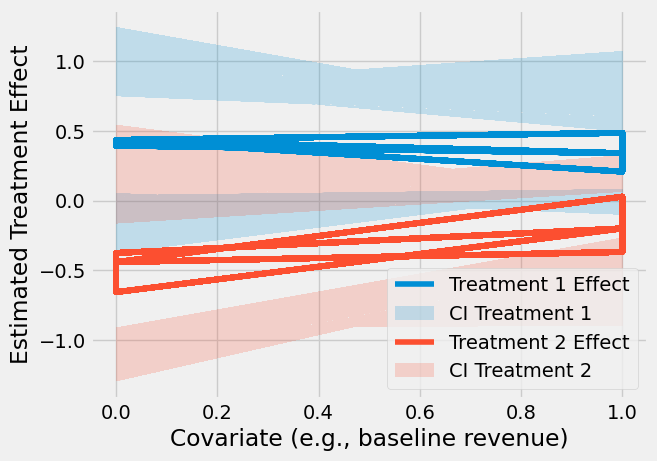

In [192]:
for t in range(T.shape[1]):  # Iterate over treatments
    plt.plot(X['retail'], point[:, t], label=f'Treatment {t + 1} Effect')  # Use column name
    plt.fill_between(X['retail'], lb[:, t], ub[:, t], alpha=0.2, label=f'CI Treatment {t + 1}')
plt.xlabel('Covariate (e.g., baseline revenue)')
plt.ylabel('Estimated Treatment Effect')
plt.legend()
plt.show()


In [199]:
# Define covariates
#baseline_covariates = ['baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'baseline_lnlabor', 'lcompnum', '_Ibasecount_2' , '_Ibasecount_3', '_Ibasecount_4', '_Ibasecount_5', '_Ibasecount_6', '_Ibasecount_7', '_Ibasecount_8', '_Ibasecount_9', '_Ibasecount_10', '_Ibasecount_11', 'retail', 'interpost_comp1', 'interpost_comp2']
#baseline_covariates = ['lnpart5revenue', 'lnwage_cost', 'lnlabor', 'lcompnum', '_Ibasecount_2' , '_Ibasecount_3', '_Ibasecount_4', '_Ibasecount_5', '_Ibasecount_6', '_Ibasecount_7', '_Ibasecount_8', '_Ibasecount_9', '_Ibasecount_10', '_Ibasecount_11', 'retail', 'interpost_comp1', 'interpost_comp2']

baseline_covariates = ['endline', 'midline', 'baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'retail', 'baseline_lnlabor']

X = df_fe2[baseline_covariates]

# Define treatment variables (direct and indirect effects)
Z = df_fe2[['interpost', 'inter4post']]

# Define instruments for the treatments
T = df_fe2[['loanuse', 'comploanuse']]

# Define outcome variable
y = df_fe2['lnpart5revenue']


Running analysis for outcome: lnpart5revenue


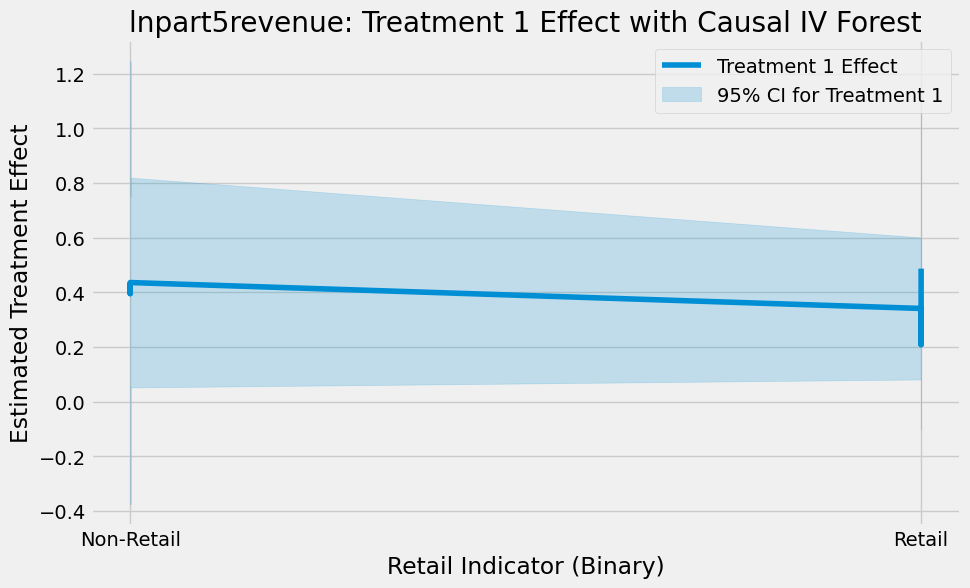

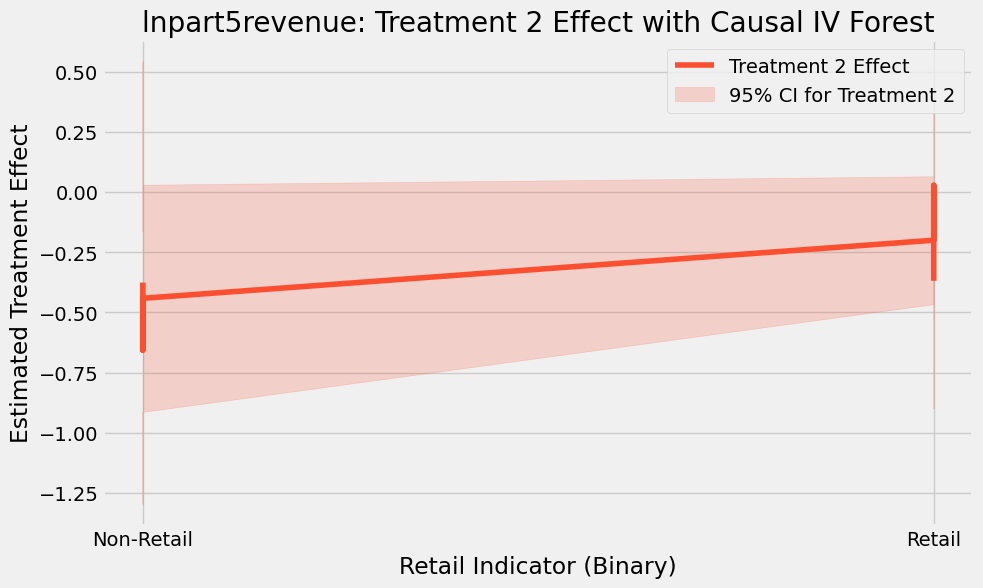

Running analysis for outcome: total_profit


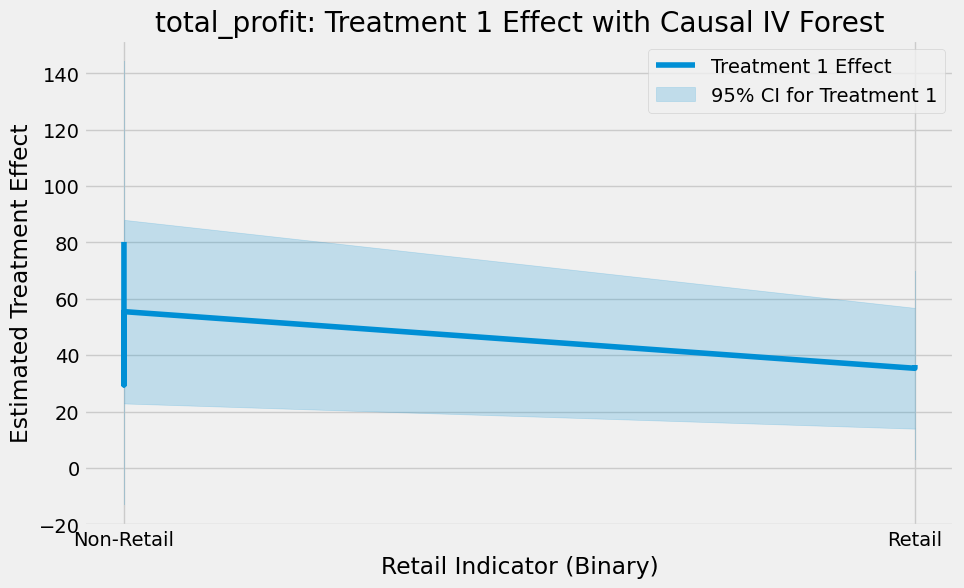

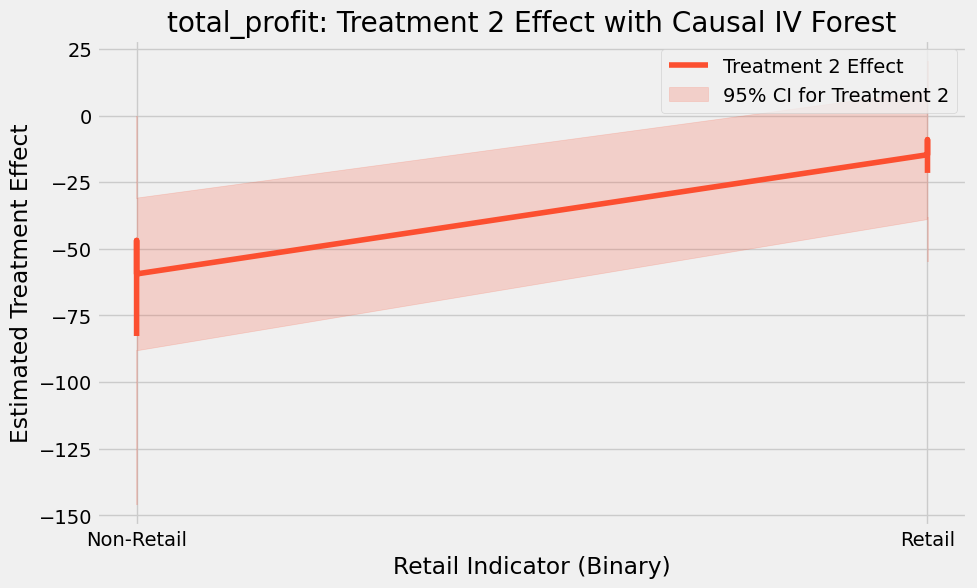

Running analysis for outcome: lnlabor


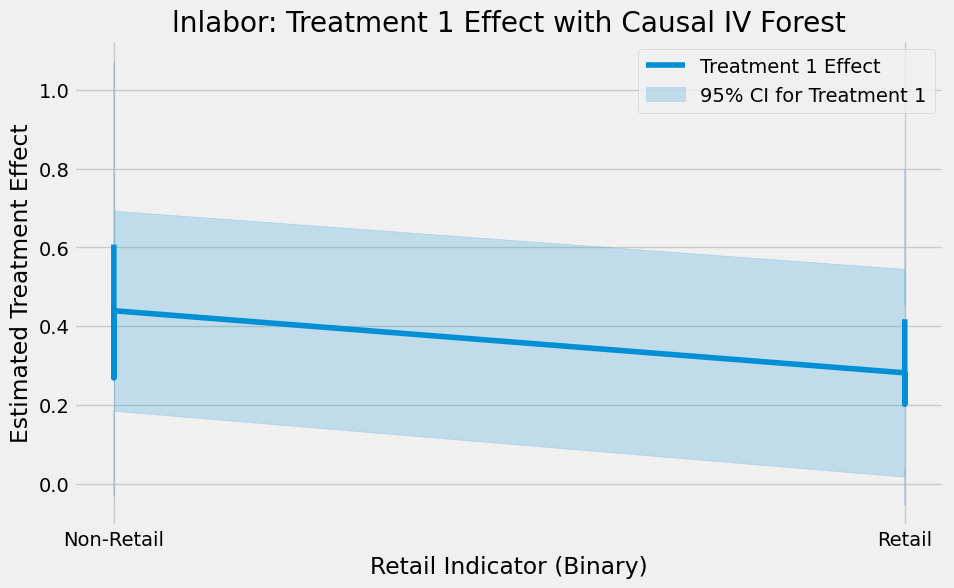

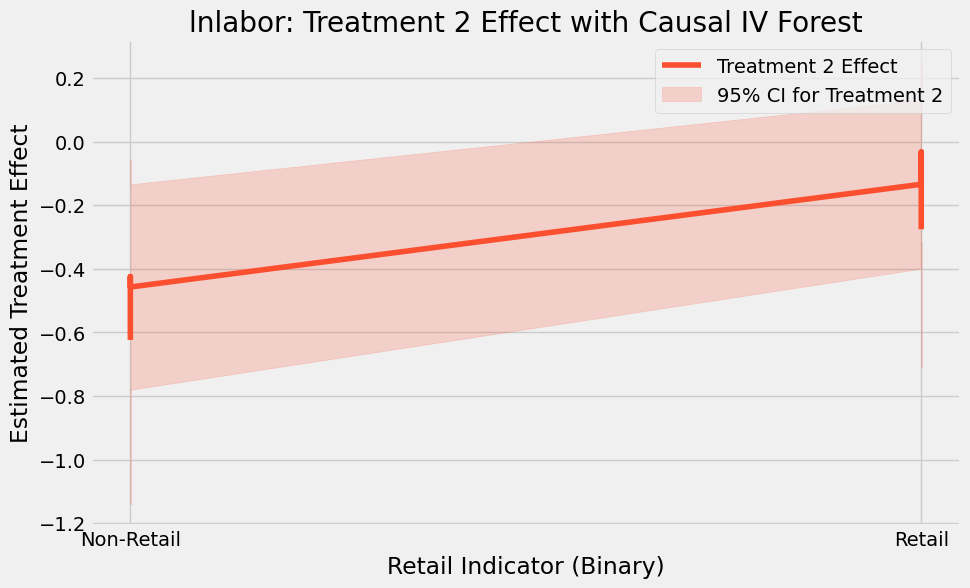

In [200]:
# Loop over all outcomes and treatment effects
for outcome in ['lnpart5revenue', 'total_profit', 'lnlabor']:
    print(f"Running analysis for outcome: {outcome}")

    # Update the outcome variable
    y = df_fe2[outcome]

    # Fit the Causal IV Forest
    est.fit(X, T, y, Z=Z)
    point, lb, ub = est.predict(X, interval=True, alpha=0.05)

    # Iterate over treatments
    for t in range(T.shape[1]):
        plt.figure(figsize=(10, 6))

        # Sort data by 'retail' for smoother plots
        sorted_idx = X['retail'].argsort()
        sorted_retail = X['retail'].iloc[sorted_idx]
        sorted_point = point[sorted_idx, t]
        sorted_lb = lb[sorted_idx, t]
        sorted_ub = ub[sorted_idx, t]

        # Plot treatment effects and confidence intervals
        plt.plot(
            sorted_retail,
            sorted_point,
            label=f'Treatment {t + 1} Effect',
            color=f'C{t}'
        )
        plt.fill_between(
            sorted_retail,
            sorted_lb,
            sorted_ub,
            alpha=0.2,
            label=f'95% CI for Treatment {t + 1}',
            color=f'C{t}'
        )

        # Add title and labels
        plt.title(f"{outcome}: Treatment {t + 1} Effect with Causal IV Forest")
        plt.xlabel('Retail Indicator (Binary)')
        plt.ylabel('Estimated Treatment Effect')
        plt.xticks([0, 1], labels=['Non-Retail', 'Retail'])  # Discrete axis for binary covariate
        plt.legend()
        plt.show()


Running analysis for outcome: lnpart5revenue


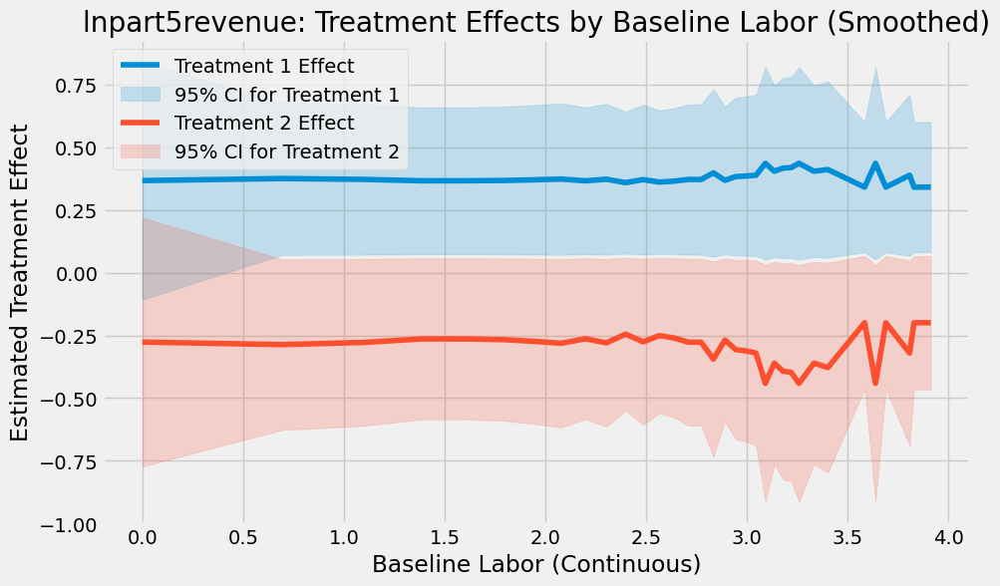

Running analysis for outcome: total_profit


is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

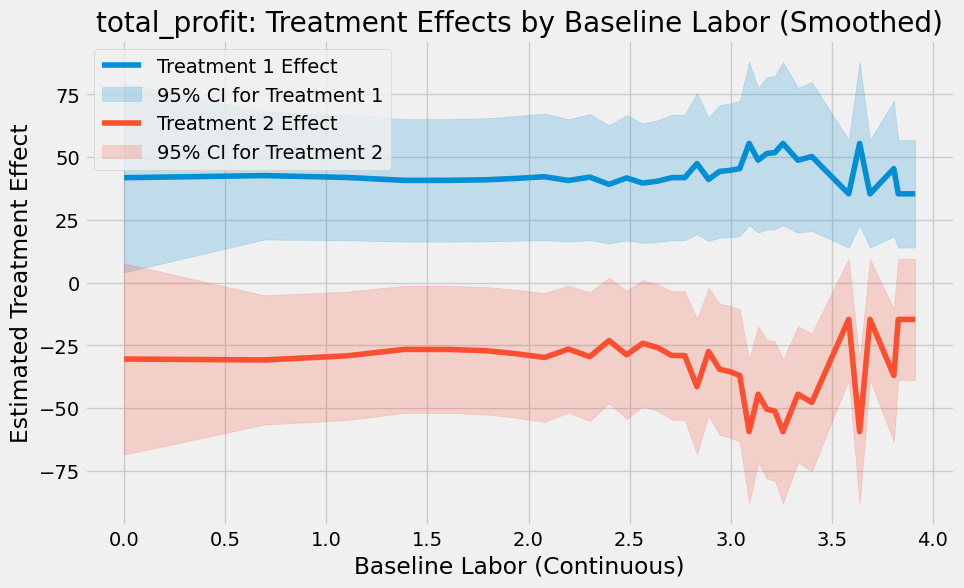

Running analysis for outcome: lnlabor


is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

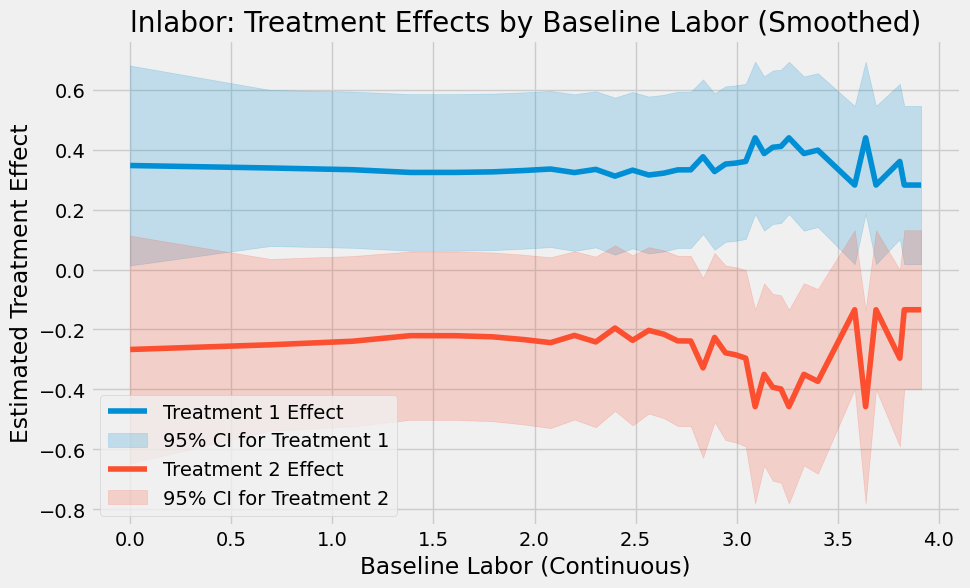

In [212]:
import numpy as np

# Iterate over all outcomes
for outcome in ['lnpart5revenue', 'total_profit', 'lnlabor']:
    print(f"Running analysis for outcome: {outcome}")


    y = df_fe2[outcome]

    # Fit the Causal IV Forest
    est.fit(X, T, y, Z=Z)
    point, lb, ub = est.predict(X, interval=True, alpha=0.05)

    # Sort data by 'baseline_lnlabor' for smoother plots
    sorted_idx = np.argsort(X['baseline_lnlabor'])
    sorted_lnlabor = X['baseline_lnlabor'].iloc[sorted_idx]
    sorted_point = point[sorted_idx]
    sorted_lb = lb[sorted_idx]
    sorted_ub = ub[sorted_idx]

    # Aggregate by unique baseline labor values to reduce clutter
    unique_lnlabor = np.unique(sorted_lnlabor)
    mean_point = np.array([sorted_point[sorted_lnlabor == val].mean(axis=0) for val in unique_lnlabor])
    mean_lb = np.array([sorted_lb[sorted_lnlabor == val].mean(axis=0) for val in unique_lnlabor])
    mean_ub = np.array([sorted_ub[sorted_lnlabor == val].mean(axis=0) for val in unique_lnlabor])

    # Create a combined plot for both treatments
    plt.figure(figsize=(10, 6))

    for t in range(T.shape[1]):  # Iterate over treatments
        # Plot treatment effects and confidence intervals
        plt.plot(
            unique_lnlabor,
            mean_point[:, t],
            label=f'Treatment {t + 1} Effect',
            color=f'C{t}'
        )
        plt.fill_between(
            unique_lnlabor,
            mean_lb[:, t],
            mean_ub[:, t],
            alpha=0.2,
            label=f'95% CI for Treatment {t + 1}',
            color=f'C{t}'
        )

    # Add labels, title, and legend
    plt.title(f"{outcome}: Treatment Effects by Baseline Labor (Smoothed)")
    plt.xlabel('Baseline Labor (Continuous)')
    plt.ylabel('Estimated Treatment Effect')
    plt.legend(loc='best')
    plt.show()


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. 

Running analysis for outcome: lnpart5revenue


is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

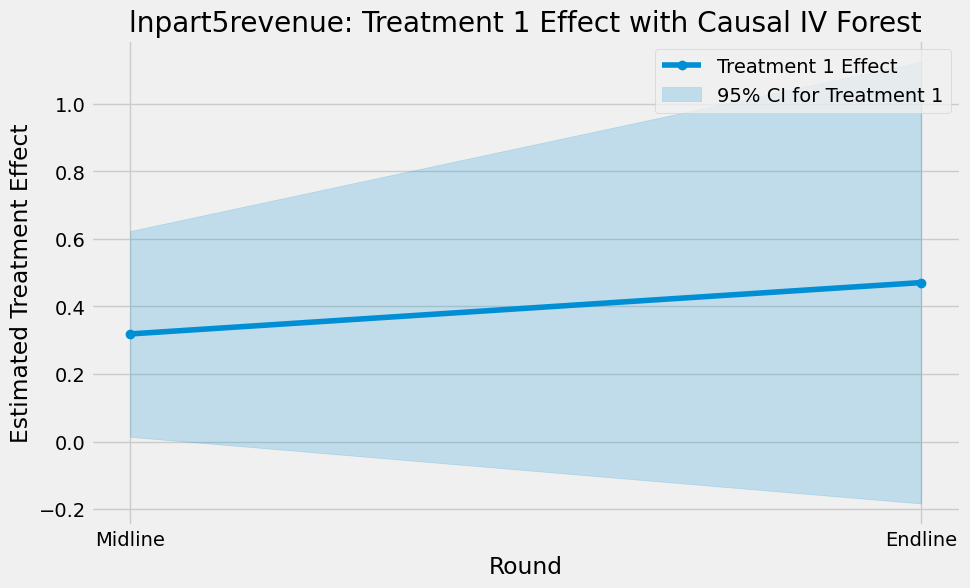

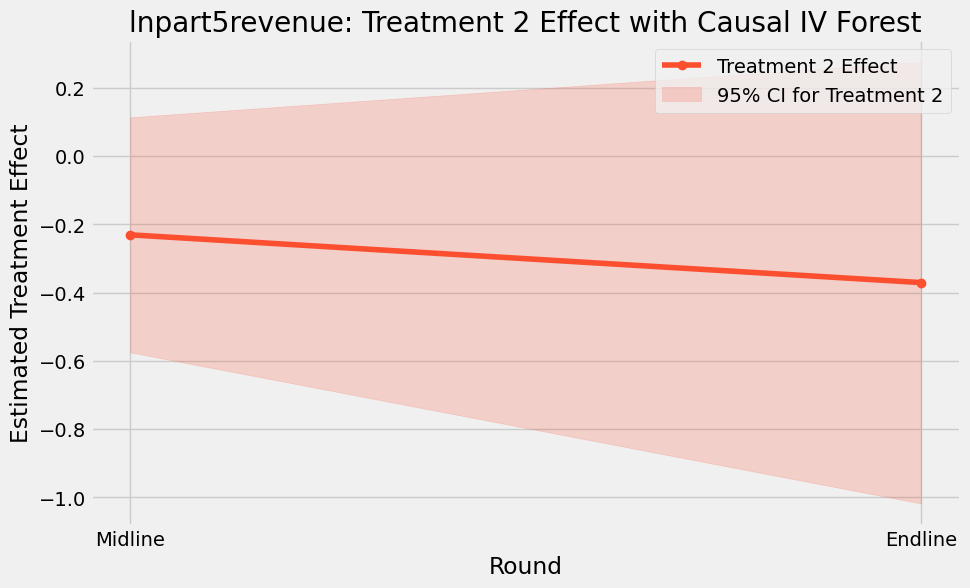

Running analysis for outcome: total_profit


is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

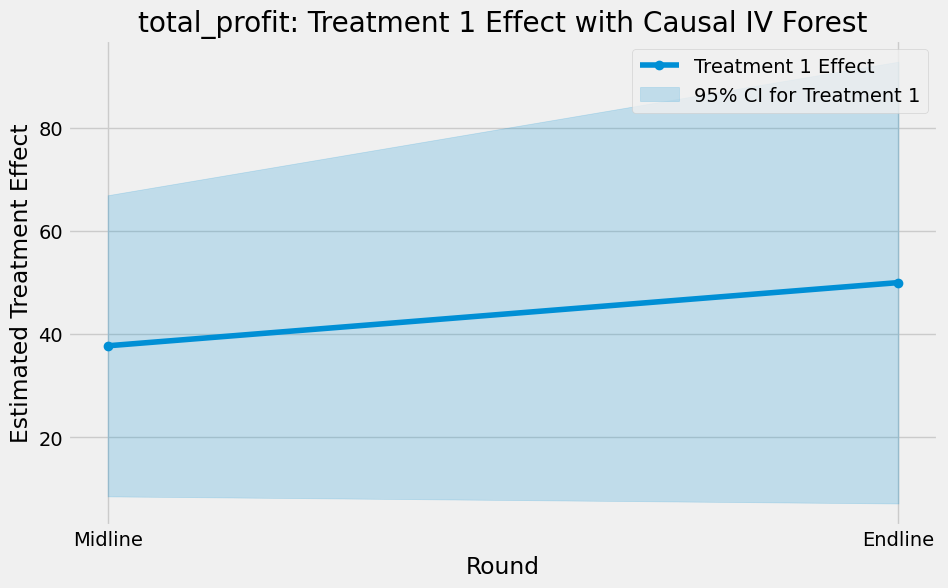

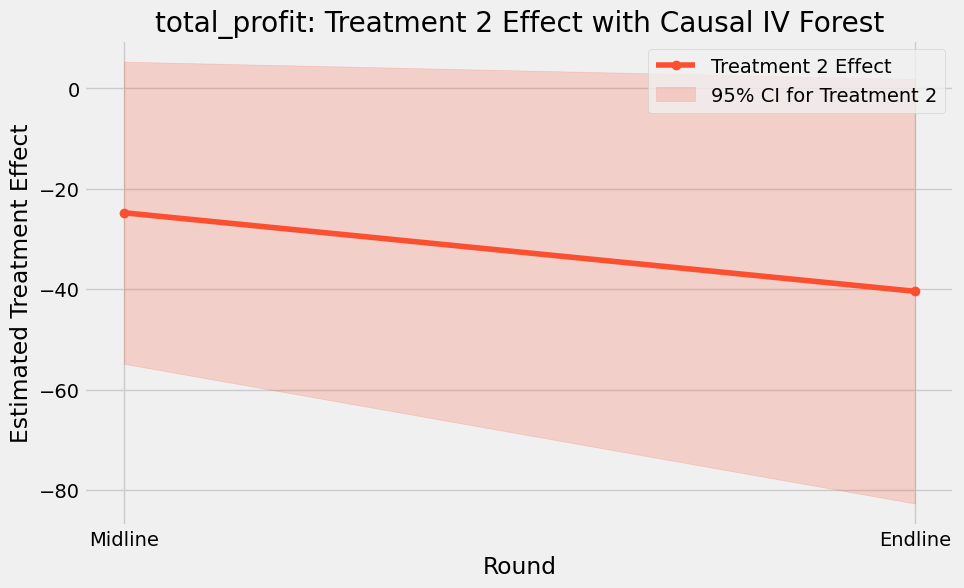

Running analysis for outcome: lnlabor


is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

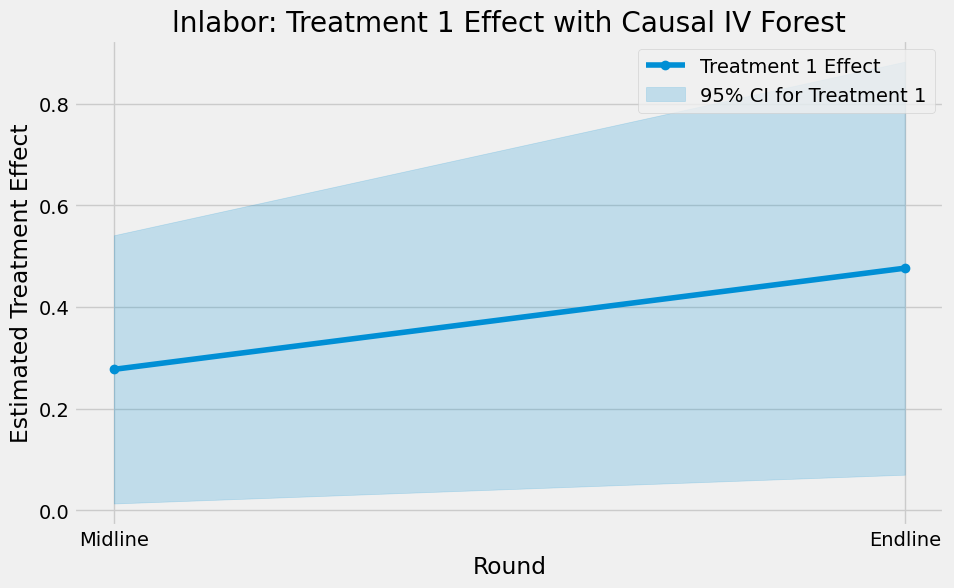

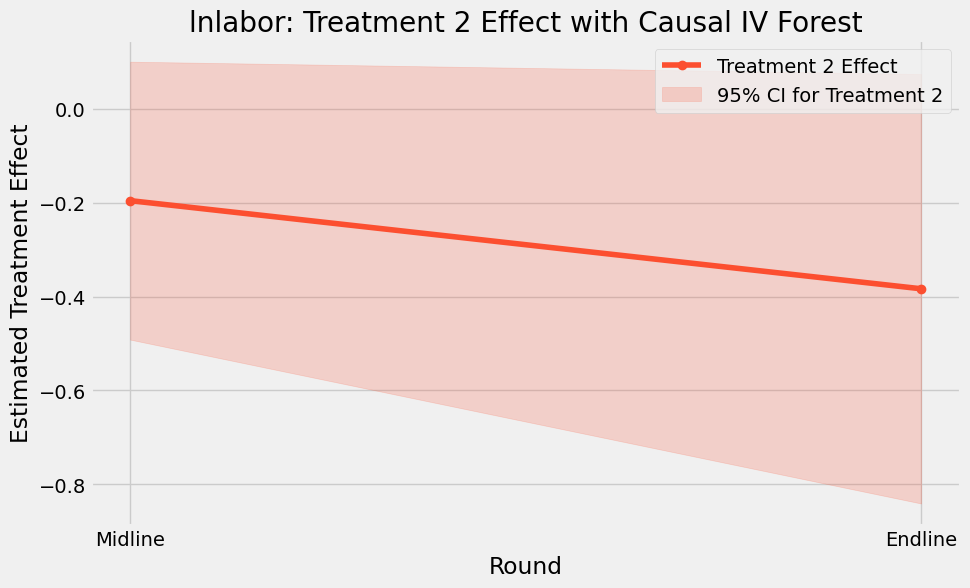

In [213]:
# Iterate over all outcomes and treatment effects
for outcome in ['lnpart5revenue', 'total_profit', 'lnlabor']:
    print(f"Running analysis for outcome: {outcome}")

    # Update the outcome variable
    y = df_fe2[outcome]

    # Fit the Causal IV Forest
    est.fit(X, T, y, Z=Z)
    point, lb, ub = est.predict(X, interval=True, alpha=0.05)

    # Group results by endline (binary)
    for t in range(T.shape[1]):
        plt.figure(figsize=(10, 6))

        # Extract values for treatment t
        treatment_point = point[:, t]
        treatment_lb = lb[:, t]
        treatment_ub = ub[:, t]

        # Group and aggregate by endline
        group_data = pd.DataFrame({
            'endline': X['endline'],
            'point': treatment_point,
            'lb': treatment_lb,
            'ub': treatment_ub
        }).groupby('endline').mean()

        # Plot treatment effects
        plt.plot(
            group_data.index,
            group_data['point'],
            label=f'Treatment {t + 1} Effect',
            color=f'C{t}',
            linestyle='-',
            marker='o'
        )

        # Add shaded confidence intervals
        plt.fill_between(
            group_data.index,
            group_data['lb'],
            group_data['ub'],
            color=f'C{t}',
            alpha=0.2,
            label=f'95% CI for Treatment {t + 1}'
        )

        # Add title and labels
        plt.title(f"{outcome}: Treatment {t + 1} Effect with Causal IV Forest")
        plt.xlabel('Round')
        plt.ylabel('Estimated Treatment Effect')
        plt.xticks([0, 1], labels=['Midline', 'Endline'])  # Discrete axis for binary covariate
        plt.legend()
        plt.show()


In [ ]:
df_fe = df_fe.dropna(subset=['basecounty'])
df_fe = df_fe.dropna(subset=['lnpart5revenue'])
df_fe = df_fe.dropna(subset=['lnwage_cost'])

In [ ]:
df_fe['lnpart5revenue_demeaned'] = df_fe['lnpart5revenue'] - df_fe.groupby('firmid')['lnpart5revenue'].transform('mean')
df_fe['loanuse_demeaned'] = df_fe['loanuse'] - df_fe.groupby('firmid')['loanuse'].transform('mean')
df_fe['comploanuse_demeaned'] = df_fe['comploanuse'] - df_fe.groupby('firmid')['comploanuse'].transform('mean')
df_fe['interpost_demeaned'] = df_fe['interpost'] - df_fe.groupby('firmid')['interpost'].transform('mean')
df_fe['inter4post_demeaned'] = df_fe['inter4post'] - df_fe.groupby('firmid')['inter4post'].transform('mean')
df_fe['baseline_lnpart5revenue_demeaned'] = df_fe['baseline_lnpart5revenue'] - df_fe.groupby('firmid')['baseline_lnpart5revenue'].transform('mean')
df_fe['baseline_total_profit_demeaned'] = df_fe['baseline_total_profit'] - df_fe.groupby('firmid')['baseline_total_profit'].transform('mean')

In [ ]:
#X = df_fe[['baseline_total_profit_demeaned', 'retail','','midline_demeaned', 'endline_demeaned']]
#X = df_fe[['baseline_lnpart5revenue', 'baseline_total_profit', 'baseline_lnwage_cost', 'baseline_lnlabor', '_Ibasecount_2' , '_Ibasecount_3', '_Ibasecount_4', '_Ibasecount_5', '_Ibasecount_6', '_Ibasecount_7', '_Ibasecount_8', '_Ibasecount_9', '_Ibasecount_10', '_Ibasecount_11', 'retail', 'midline', 'endline']]
X = df_fe[['midline', 'endline', 'baseline_lnlabor']]
#X = df_fe[['retail', 'baseline_lnlabor', 'midline', 'endline']]

,baseline_lnpart5revenue,baseline_total_profit,baseline_lnwage_cost,baseline_lnlabor,_Ibasecount_2,_Ibasecount_3,_Ibasecount_4,_Ibasecount_5,_Ibasecount_6,_Ibasecount_7,_Ibasecount_8,_Ibasecount_9,_Ibasecount_10,_Ibasecount_11,retail,midline,endline
count,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000,8214.000000
mean,1.850974,17.458703,0.907871,0.664089,0.325055,0.286584,0.069272,0.034819,0.029097,0.075846,0.037132,0.068663,0.017653,0.028123,0.688215,0.338325,0.323350
std,2.633045,47.160304,1.354173,1.022825,0.468424,0.452193,0.253932,0.183331,0.168088,0.264768,0.189096,0.252896,0.131694,0.165333,0.463239,0.473168,0.467784
min,0.000000,-152.000000,-0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,5.298317,20.000000,2.302585,1.609438,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,9.104980,1407.000000,5.470589,3.912023,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
#T = df_fe[['loanuse_demeaned', 'comploanuse_demeaned']]
T = df_fe[['loanuse', 'comploanuse']]


In [ ]:
y.describe()

,lnpart5revenue_demeaned
count,8.220000e+03
mean,-2.175352e-09
std,3.895182e-01
min,-2.298119e+00
25%,-1.446230e-01
50%,4.184246e-03
75%,1.505394e-01
max,2.693416e+00


In [ ]:
Z = df_fe[['interpost', 'inter4post']]


In [ ]:
y = df_fe['lnpart5revenue']


In [ ]:
grf_iv = CausalIVForest(
    n_estimators=400,
    min_samples_leaf=40,
    min_var_fraction_leaf=0.1,
    min_var_leaf_on_val=True,
    min_impurity_decrease=0.001,
    max_samples=0.45,
    honest=True,
    subforest_size=4,
    random_state=123
)

grf_iv.fit(X, T, y, Z=Z)
point, lb, ub = grf_iv.predict(X, interval=True, alpha=0.05)

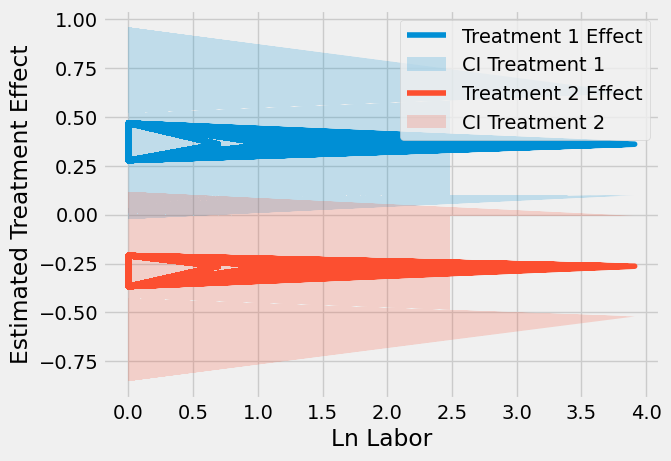

In [ ]:
# Visualize results
for t in range(T.shape[1]):  # Iterate over treatments
    plt.plot(X['baseline_lnlabor'], point[:, t], label=f'Treatment {t + 1} Effect')
    plt.fill_between(X['baseline_lnlabor'], lb[:, t], ub[:, t], alpha=0.2, label=f'CI Treatment {t + 1}')
plt.xlabel('Ln Labor')
plt.ylabel('Estimated Treatment Effect')
plt.legend()
plt.show()


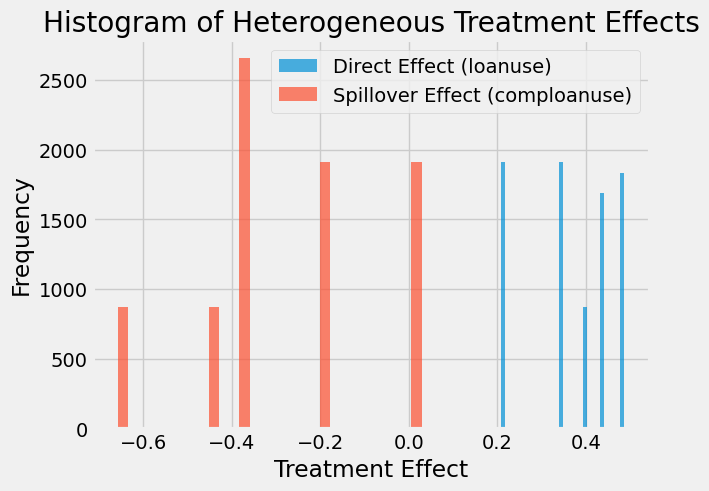

In [ ]:
import matplotlib.pyplot as plt

# Histogram for Treatment 1
plt.hist(point[:, 0], bins=30, alpha=0.7, label='Direct Effect (borrowred)')

# Histogram for Treatment 2
plt.hist(point[:, 1], bins=30, alpha=0.7, label='Spillover Effect (share of comp. borrowing)')

plt.xlabel('Treatment Effect')
plt.ylabel('Frequency')
plt.title('Histogram of Heterogeneous Treatment Effects')
plt.legend()
plt.show()
